In [ ]:
#############################################################################
#   PROJET 6 - Classez des images à l'aide d'algorithmes de Deep Learning   #
#---------------------------------------------------------------------------#
#   NOTEBOOK D'EXPLORATION :                                                #
#############################################################################

In [ ]:
# Stanford Dogs Dataset : http://vision.stanford.edu/aditya86/ImageNetDogs/

In [ ]:
#############################################################################
# PLAN CODE :                                                               #
#############################################################################
# 1. Récupération des données
#    1.1. Répertoire Images
#    1.2. Répertoire Annotation : bounding box
#         1.2.1. Conversion fichiers annotation en panda dataframe
#         1.2.2. Découpage image suivant bounding box
# 
# 2. Prétraitement des images / images preprocessing
#    2.1. Taille images
#         2.1.1. Etude taille images
#         2.1.2. Test redimensionnement images
#         2.1.3. Preprocessing taille images
#         2.1.4. Affichage % taille image
#    2.2. Luminosité
#         2.2.1. Etude luminosité
#         2.2.2. Test luminosité
#         2.2.3. Preprocessing luminosité
#         2.2.4. Affichage % luminosité
#    2.3. Contraste
#         2.3.1. Test contraste
#         2.3.2. Preprocessing contraste
#         2.3.3. Affichage % contraste
#    2.4. Rotation
#         2.4.1. Test rotation
#         2.4.2. Preprocessing rotation
#         2.4.3. Affichage % rotation
#    2.5. Bruit
#         2.5.1. Test bruit
#         2.5.2. Preprocessing bruit
#         2.5.3. Affichage % bruit
#    2.6. Vérification nombre d'images
# 
# 3. Modélisation avec des CNNs (Convolutional Neural Networks / réseaux de neurones convolutionnels)
#    3.1. Approche 1 - Mon propre réseau CNN
#         3.1.1. Fonctions communes
#         3.1.2. Données rectangulaires & bounding box % preprocessings
#                3.1.2.1. Source ('xxx.jpg')
#                3.1.2.2. Luminosité ('xxx_luminosite.jpg')
#                3.1.2.3. Contrastes ('xxx_contraste.jpg')
#                3.1.2.4. Rotation 45° ('xxx_rotation_45.jpg')
#                3.1.2.5. Bruit ('xxx_bruit.jpg')
#                3.1.2.6. Synthèse % preprocessings
#         3.1.3. Données rectangulaires % preprocessings
#                3.1.3.1. Source ('xxx.jpg')
#                3.1.3.2. Luminosité ('xxx_luminosite.jpg')
#                3.1.3.3. Contrastes ('xxx_contraste.jpg')
#                3.1.3.4. Rotation 45° ('xxx_rotation_45.jpg')
#                3.1.3.5. Bruit ('xxx_bruit.jpg')
#                3.1.3.6. Synthèse % preprocessings
#         3.1.4. Données carrées & bounding box % preprocessings
#                3.1.4.1. Source ('xxx.jpg')
#                3.1.4.2. Luminosité ('xxx_luminosite.jpg')
#                3.1.4.3. Contrastes ('xxx_contraste.jpg')
#                3.1.4.4. Rotation 45° ('xxx_rotation_45.jpg')
#                3.1.4.5. Bruit ('xxx_bruit.jpg')
#                3.1.4.6. Synthèse % preprocessings
#         3.1.5. Données carrées % preprocessings
#                3.1.5.1. Source ('xxx.jpg')
#                3.1.5.2. Luminosité ('xxx_luminosite.jpg')
#                3.1.5.3. Contrastes ('xxx_contraste.jpg')
#                3.1.5.4. Rotation 45° ('xxx_rotation_45.jpg')
#                3.1.5.5. Bruit ('xxx_bruit.jpg')
#                3.1.5.6. Synthèse % preprocessings
#         3.1.6. Synthèse % découpages & preprocessings
#    3.2. Approche 2 - Data augmentation
#         3.2.1. Données rectangulaires & bounding box & preprocessing luminosité ('xxx_luminosite.jpg')
#         3.2.2. Données carrées & bounding box & preprocessing luminosité ('xxx_luminosite.jpg')
#         3.2.3. Synthèse % découpages & preprocessings
#    3.3. Approche 3 - Transfer learning
#         3.3.1. Fonctions communes
#         3.3.2. Modèle pré-entraîné InceptionV3
#         3.3.3. Modèle pré-entraîné ResNet50
#         3.3.4. Modèle pré-entraîné VGG16
#         3.3.5. Synthèse % modèles pré-entraînés
#    3.4. Approche 4 - Optimisation hyperparamètres Transfer learning
#         3.4.1. Fonctions communes
#         3.4.2. Hyperparamètres des layers
#         3.4.3. Hyperparamètres de compilation
#         3.4.4. Hyperparamètres d'exécution du modèle
#         3.4.5. Meilleurs hyperparamètres
# 
# 4. Prédiction avec les meilleurs hyperparamètres

In [1]:
# Constantes
# Exécution sur google colab ou pas
C_EXECUTION_SUR_GOOGLE_COLAB = False  # False --> PC
                                      # True --> Google colab : https://colab.research.google.com/

In [ ]:
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    !pip install photutils
    !pip install -U keras-tuner
    !pip install scikeras

In [ ]:
#!pip install scikeras
#!pip install -U keras-tuner # install  Keras Tuner : https://keras.io/keras_tuner/
#!pip install keras-tuner --upgrade

In [2]:
# built-in (librairie par défaut avec python)
import os
import tarfile
import shutil

# Data
import pandas as pd
import numpy as np
from numpy import asarray
import seaborn as sns
import statistics
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

# Visualisation
import matplotlib.pyplot as plt # couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html
from PIL import Image
from PIL import ImageOps
from PIL import ImageFilter

# NLP
from nltk.tokenize import RegexpTokenizer
from string import punctuation
import re

# Découpage
from sklearn.model_selection import train_test_split

# Images
import xml.etree.ElementTree as ET
from photutils.aperture import BoundingBox

# Time
import time
from time import perf_counter

from itertools import chain
import random
# Convert labels to one-hot encoded labels
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import img_to_array
    
# Transfer learning
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras import models
from keras import layers
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from keras.applications.inception_v3 import InceptionV3, decode_predictions
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.vgg16 import VGG16
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html
from sklearn.metrics import accuracy_score

# Hyperparamètres
import keras_tuner as kt
from tensorflow.keras import Model
#from keras.wrappers.scikit_learn import KerasClassifier
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import GridSearchCV 
from tensorflow.keras.constraints import MaxNorm

import pickle  # Sauvegarde modèle

# ------------------------------- Pour google colab -------------------------------
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    from google.colab import drive

# 1. Récupération des données

In [3]:
# Montage disques réseau avec google drive + demande autorisation connexion)
# Google drive : https://drive.google.com/drive/my-drive
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    drive.mount('/content/drive', force_remount = True)
    # vérification fichier
    !ls /content/drive/MyDrive/Colab_Notebooks/data_P6

In [3]:
# Constantes
# >>>>>>> Google colab
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    C_DATASET = '/content/drive/MyDrive/Colab_Notebooks/data_P6/'
    
# >>>>>>> PC
else:
    C_DATASET = './data/'
    
    
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @    Données source                                  @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
C_DATASET_SOURCE            = C_DATASET + 'source/'
C_DATASET_SOURCE_IMAGES     = C_DATASET_SOURCE + 'Images/'
C_DATASET_SOURCE_ANNOTATION = C_DATASET_SOURCE + 'Annotation/'



# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   Données nettoyées                                @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# Données nettoyées de format d'origine soit rectangulaire
C_DATASET_CLEANED_RECT = C_DATASET + 'cleaned_rect/'
# Image unique pour chaque chien avant algos
# Remarque : Images_sources = C_DATASET_SOURCE_IMAGES
C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE  = C_DATASET_CLEANED_RECT + 'Images_luminosite/'  # Luminosité   : xxx_luminosite.jpg
C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE   = C_DATASET_CLEANED_RECT + 'Images_contraste/'   # Contrastes   : xxx_contraste.jpg
C_DATASET_CLEANED_RECT_IMAGES_ROTATION_45 = C_DATASET_CLEANED_RECT + 'Images_rotation_45/' # Rotation 45° : xxx_rotation_45.jpg
C_DATASET_CLEANED_RECT_IMAGES_BRUIT       = C_DATASET_CLEANED_RECT + 'Images_bruit/'       # Bruit        : xxx_bruit.jpg


# Données nettoyées de format carre
C_DATASET_CLEANED_CARRE = C_DATASET + 'cleaned_carre/'
# Image unique pour chaque chien avant algos
C_DATASET_CLEANED_CARRE_IMAGES_SOURCE      = C_DATASET_CLEANED_CARRE + 'Images_source/'      # Images carrées : xxx_carre.jpg 
C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE  = C_DATASET_CLEANED_CARRE + 'Images_luminosite/'  # Luminosité     : xxx_luminosite.jpg
C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE   = C_DATASET_CLEANED_CARRE + 'Images_contraste/'   # Contrastes     : xxx_contraste.jpg
C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45 = C_DATASET_CLEANED_CARRE + 'Images_rotation_45/' # Rotation 45°   : xxx_rotation_45.jpg
C_DATASET_CLEANED_CARRE_IMAGES_BRUIT       = C_DATASET_CLEANED_CARRE + 'Images_bruit/'       # Bruit          : xxx_bruit.jpg




# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   Bounding box (données retaillée avec bndbox)     @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# Données bounding box nettoyées de format d'origine soit rectangulaire
C_BNDBOX_CLEANED_RECT = C_DATASET + 'bndbox_cleaned_rect/'
# Image unique pour chaque chien avant algos
C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE      = C_BNDBOX_CLEANED_RECT + 'Images_source/'      # Images source : xxx.jpg
C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE  = C_BNDBOX_CLEANED_RECT + 'Images_luminosite/'  # Luminosité   : xxx_luminosite.jpg
C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE   = C_BNDBOX_CLEANED_RECT + 'Images_contraste/'   # Contrastes   : xxx_contraste.jpg
C_BNDBOX_CLEANED_RECT_IMAGES_ROTATION_45 = C_BNDBOX_CLEANED_RECT + 'Images_rotation_45/' # Rotation 45° : xxx_rotation_45.jpg
C_BNDBOX_CLEANED_RECT_IMAGES_BRUIT       = C_BNDBOX_CLEANED_RECT + 'Images_bruit/'       # Bruit        : xxx_bruit.jpg


# Données bounding box nettoyées de format carré
C_BNDBOX_CLEANED_CARRE = C_DATASET + 'bndbox_cleaned_carre/'
# Image unique pour chaque chien avant algos
C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE      = C_BNDBOX_CLEANED_CARRE + 'Images_source/'      # Images carrées : xxx_carre.jpg
C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE  = C_BNDBOX_CLEANED_CARRE + 'Images_luminosite/'  # Luminosité    : xxx_luminosite.jpg
C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE   = C_BNDBOX_CLEANED_CARRE + 'Images_contraste/'   # Contrastes    : xxx_contraste.jpg
C_BNDBOX_CLEANED_CARRE_IMAGES_ROTATION_45 = C_BNDBOX_CLEANED_CARRE + 'Images_rotation_45/' # Rotation 45°  : xxx_rotation_45.jpg
C_BNDBOX_CLEANED_CARRE_IMAGES_BRUIT       = C_BNDBOX_CLEANED_CARRE + 'Images_bruit/'       # Bruit         : xxx_bruit.jpg



# Données transfer learning
#C_DATASET_LOGS_TF = C_DATASET + 'logs/'
#
#C_BNDBOX_CLEANED_LOGS       = C_BNDBOX_CLEANED + 'Logs/'

In [256]:
# Liste des folders et fichiers à la racine du répertoire C_DATASET_SOURCE
os.listdir(C_DATASET_SOURCE)

['Annotation',
 'annotation.tar',
 'file_list.mat',
 'Images',
 'images.tar',
 'lists.tar',
 'README.txt',
 'test_data.mat',
 'test_list.mat',
 'train_data.mat',
 'train_list.mat']

In [ ]:
###############################################################
#                 Extraction fichiers .tar                    #
###############################################################

In [6]:
# https://www.tutorialspoint.com/How-are-files-extracted-from-a-tar-file-using-Python
def extract_all_files(tar_file_path, extract_to):
    # Destination = xxx pour xxx.tar
    extract_to = C_DATASET_SOURCE + extract_to
    
    with tarfile.open(C_DATASET_SOURCE + tar_file_path, 'r') as tar:
        tar.extractall(extract_to)

In [9]:
# annotation.tar --> folder Annotation
extract_all_files(tar_file_path = 'annotation.tar', 
                  extract_to    = '.') # n sous-folders

In [10]:
# images.tar --> folder Images
extract_all_files(tar_file_path = 'images.tar', 
                  extract_to    = '.') # n sous-folders

In [11]:
# Folder Lists
extract_all_files(tar_file_path = 'lists.tar', 
                  extract_to    = '.') # un seul folder

In [5]:
# https://www.geeksforgeeks.org/python-os-path-isdir-method/
# Liste des fichiers et répertoires à la racine du répertoire C_DATASET_SOURCE
def liste_fichiers_et_repertoires(chemin_repertoire_in): 

    nb_caractere_ligne = 122
    
    print('chemin_repertoire_in =', chemin_repertoire_in, '\n')
    
    liste_file_folder = os.listdir(chemin_repertoire_in)
    print('liste_file_folder =', liste_file_folder, '\n')

    # Liste des fichiers du répertoire source
    texte_fichier = 'Répertoire ' + chemin_repertoire_in + ' : liste des fichiers'
    nb_car_texte_fichier = round((nb_caractere_ligne - len(texte_fichier))/2)    
    print('@' * nb_car_texte_fichier, texte_fichier, '@' * nb_car_texte_fichier)
    for rep in liste_file_folder:
        path = chemin_repertoire_in + rep
        # Test si c'est un (sous-)répertoire ou pas
        isdir = os.path.isdir(path)
        
        if (not(isdir)):
            print(rep)
        

    # Liste des répertoires et sous-répertoires du répertoire source
    print('\n')
    texte_folder = 'Répertoire ' + chemin_repertoire_in + ' : liste des répertoires et sous-répertoires'
    nb_car_texte_folder = round((nb_caractere_ligne - len(texte_folder))/2)
    print('@' * nb_car_texte_folder, texte_folder, '@' * nb_car_texte_folder)
    for rep in liste_file_folder:
        path = chemin_repertoire_in + rep
        # Test si c'est un (sous-)répertoire ou pas
        isdir = os.path.isdir(path)
        
        if (isdir):
            print('>' *7, 'Répertoire', rep, '--->', len(os.listdir(path)), 'éléments :')
            print(os.listdir(path))
            print('\n')

In [6]:
# Liste des fichiers et répertoires à la racine du répertoire C_DATASET_SOURCE
liste_fichiers_et_repertoires(chemin_repertoire_in = C_DATASET_SOURCE)

# ==> 120 races de chiens.

chemin_repertoire_in = ./data/source/ 

liste_file_folder = ['Annotation', 'annotation.tar', 'file_list.mat', 'Images', 'images.tar', 'lists.tar', 'README.txt', 'test_data.mat', 'test_list.mat', 'train_data.mat', 'train_list.mat'] 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Répertoire ./data/source/ : liste des fichiers @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
annotation.tar
file_list.mat
images.tar
lists.tar
README.txt
test_data.mat
test_list.mat
train_data.mat
train_list.mat


@@@@@@@@@@@@@@@@@@@@@@@@@@ Répertoire ./data/source/ : liste des répertoires et sous-répertoires @@@@@@@@@@@@@@@@@@@@@@@@@@
>>>>>>> Répertoire Annotation ---> 120 éléments :
['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n

In [ ]:
########################################################
#                  Nombre d'images                     #
########################################################

In [7]:
# Comparaison contenu liste_dir_annotation et liste_dir_images.
# https://www.techiedelight.com/fr/traverse-list-with-indices-python/
liste_dir_annotation = os.listdir(C_DATASET_SOURCE_ANNOTATION)
# tri liste (https://www.delftstack.com/fr/howto/python/sort-list-alphabetically/)
liste_dir_annotation.sort()
print('liste_dir_annotation[0:8] =', liste_dir_annotation[0:8], '...', '\n')

liste_dir_images = os.listdir(C_DATASET_SOURCE_IMAGES)
# tri liste (https://www.delftstack.com/fr/howto/python/sort-list-alphabetically/)
liste_dir_images.sort()
print('liste_dir_images[0:8] =', liste_dir_images[0:8], '...', '\n')

count = 0

for i, v in enumerate(liste_dir_annotation):
    if (v == liste_dir_images[i]):
        count = count + 1
    else:
        print('indice', i, 
              ': liste_dir_annotation =', liste_dir_annotation[i], 
              ', liste_dir_images =', liste_dir_images[i])

print(count, '/', len(liste_dir_annotation), 'éléments identiques')

liste_dir_annotation[0:8] = ['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier'] ... 

liste_dir_images[0:8] = ['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier'] ... 

120 / 120 éléments identiques


# 1.1. Répertoire Images

In [8]:
# Calcul nombre d'images pour chaque sous-répertoire (stockage dans liste nb_images).
def nb_images_par_race(directory_in):
    
    liste_races  = []
    nb_images    = [] # liste avec le nombre d'images par sous-répertoire
    nb_img_total = 0  # nb images total

    for dir_image in liste_dir_images:
        path_subfolder_images = directory_in + dir_image
        nb_img = len(os.listdir(path_subfolder_images))
        liste_races.append(dir_image)
        nb_images.append(nb_img)
        print(nb_img, 'images dans le répertoire', dir_image)
    
        # Maj nombre d'images total
        nb_img_total = nb_img_total + nb_img
    
    print('\n==> nb_img_total (nombre total d\'images) =', nb_img_total)
    
    return(liste_races, nb_images)

In [9]:
liste_races, nb_images = nb_images_par_race(directory_in = C_DATASET_SOURCE_IMAGES)

# nb_img_total (nombre total d'images) = 20580

152 images dans le répertoire n02085620-Chihuahua
185 images dans le répertoire n02085782-Japanese_spaniel
252 images dans le répertoire n02085936-Maltese_dog
149 images dans le répertoire n02086079-Pekinese
214 images dans le répertoire n02086240-Shih-Tzu
188 images dans le répertoire n02086646-Blenheim_spaniel
196 images dans le répertoire n02086910-papillon
172 images dans le répertoire n02087046-toy_terrier
172 images dans le répertoire n02087394-Rhodesian_ridgeback
239 images dans le répertoire n02088094-Afghan_hound
175 images dans le répertoire n02088238-basset
195 images dans le répertoire n02088364-beagle
187 images dans le répertoire n02088466-bloodhound
171 images dans le répertoire n02088632-bluetick
159 images dans le répertoire n02089078-black-and-tan_coonhound
153 images dans le répertoire n02089867-Walker_hound
157 images dans le répertoire n02089973-English_foxhound
148 images dans le répertoire n02090379-redbone
151 images dans le répertoire n02090622-borzoi
218 image

In [10]:
print(liste_races[0], nb_images[0])

n02085620-Chihuahua 152


In [11]:
print('nb_images :')
print('\t- min\t=', min(nb_images))
print('\t- max\t=', max(nb_images))
print('\t- mean\t=', statistics.mean(nb_images))

# ==> moyenne de 171 images / race de chien.

nb_images :
	- min	= 148
	- max	= 252
	- mean	= 171.5


In [12]:
############################################################################
# Visualisation fréquence du nombre de répertoires % nombre d'images       #
############################################################################
# https://www.python-simple.com/python-matplotlib/histogram.php
def visualisation_frequence_nb_repertoires(nb_images_in):
    
    plt.figure(figsize = (12, 4)) # longueur, hauteur
    plt.hist(nb_images_in, rwidth = 0.8, bins = 20, color = 'skyblue', edgecolor = 'blue')
    plt.xlabel('Nombre d\'images')
    plt.ylabel('Frequence (nombre de répertoires)')
    plt.title('Fréquence du nombre de répertoires % nombre d\'images', fontsize = 14)
    plt.show()

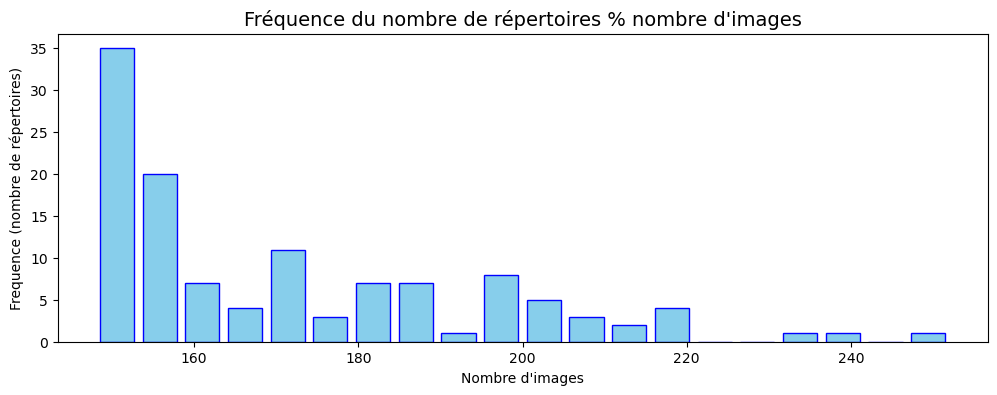

In [13]:
visualisation_frequence_nb_repertoires(nb_images_in = nb_images)

In [14]:
############################################################################
# Visualisation nombre d'images par répertoire                             #
############################################################################
def visualisation_nb_images_par_repertoire(liste_races_in, nb_images_in):

    plt.figure(figsize = (20, 7)) # longueur, hauteur
    width = 0.5
    # https://devagone.fr/comment-changer-la-couleur-dune-seule-barre-si-une-condition-est-vraie-matplotlib/
    liste_races_sup = []
    liste_races_inf = []
    liste_races_mid = []

    nb_images_sup = []
    nb_images_inf = []
    nb_images_mid = []


    for i in range(len(nb_images_in)):
        # Inférieur
        if (nb_images_in[i] < statistics.mean(nb_images_in) - 15):
            liste_races_inf.append(liste_races_in[i])
            nb_images_inf.append(nb_images_in[i])
            niveau = 'INF'
        # Supérieur
        elif (nb_images_in[i] > statistics.mean(nb_images_in) + 10):
            liste_races_sup.append(liste_races_in[i])
            nb_images_sup.append(nb_images_in[i])
            niveau = 'SUP'
        # Milieu
        else:
            liste_races_mid.append(liste_races_in[i])
            nb_images_mid.append(nb_images_in[i])        
            niveau = 'MID'
#        print(i, ',\t', nb_images_in[i], '==>', niveau, ',\t', liste_races_in[i])
        
#    print('INF :', len(liste_races_inf), len(nb_images_inf))
#    print('MID :', len(liste_races_mid), len(nb_images_mid))
#    print('SUP :', len(liste_races_sup), len(nb_images_sup))

    plt.bar(liste_races_inf, nb_images_inf, width, color = 'orange', label = 'inf')
    plt.bar(liste_races_mid, nb_images_mid, width, color = 'turquoise', label = 'mid')
    plt.bar(liste_races_sup, nb_images_sup, width, color = 'green', label = 'sup')
    plt.xticks(rotation = 90)
    plt.ylabel('Nombre d\'images', fontsize = 15)
    plt.title('Nombre d\'images par répertoire', fontsize = 20)
    plt.legend()
    plt.show()

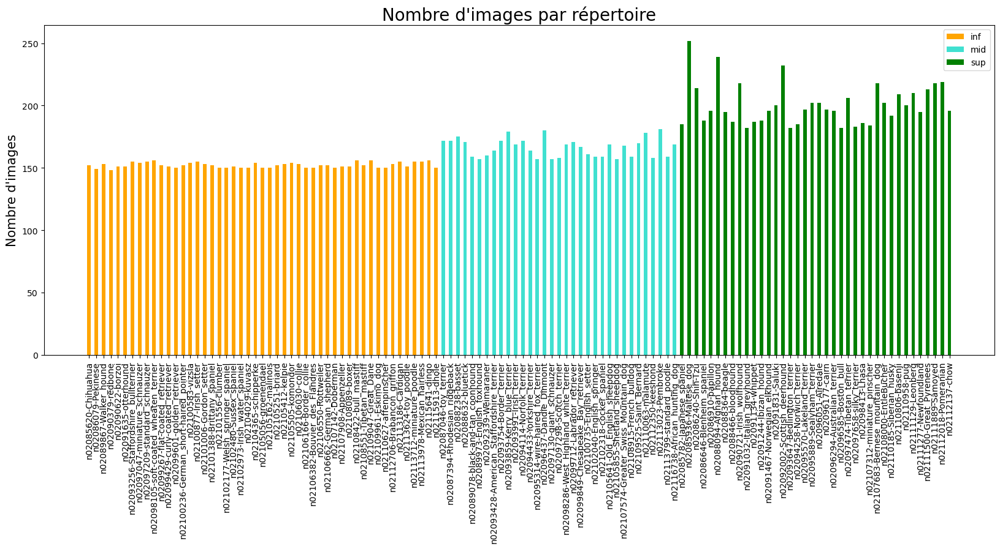

In [15]:
visualisation_nb_images_par_repertoire(liste_races_in = liste_races, 
                                       nb_images_in   = nb_images)

In [ ]:
###########################################
#           Races des chiens              #
###########################################

In [16]:
# Pour un répertoire :
# Conversion nom d'un répertoire en race de chien : passage en minuscule, suppression punctuation,
# caractères alphanumériques et nombres 
def conversion_nom_repertoire_to_race(nom_repertoire_in):
    
    # Initialisation RegexpTokenizer
    tokenizer = RegexpTokenizer(r'\w+')


    # On met tout le texte en minuscule  
    nom_repertoire_min = nom_repertoire_in.lower()
    
    
    # Suppression ponctuation (remplacement par un caractère blanc)
    # Ponctuation =  !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~     
    doc_sans_ponctuation = re.sub(f"[{re.escape(punctuation)}]", " ", nom_repertoire_min)
    
    # Tokenization : liste de tokens bruts
    tokens = tokenizer.tokenize(doc_sans_ponctuation)
            
    
    # Suppression de tous les caractères "blanc" (\s) i.e. équivalent à la classe [ \t\n\r\f\v].
    # https://docs.python.org/fr/3/howto/regex.html
    tokens_no_blanc = [w for w in tokens if not (bool(re.search(r'\s', w)))]
        
        
    # Suppression des mots alphanumeriques (exemple : 4cb9df79467b3eb5d6787a98dcf8665)
    # https://www.delftstack.com/fr/howto/python/how-to-check-a-string-contains-a-number-or-not-in-python/
    # <=> on regarde si la chaîne de caractère contient un nombre.
    # Suppression de tous les caractères numériques (\d) i.e. équivalent à la classe [0-9].
    # https://docs.python.org/fr/3/howto/regex.html        
    tokens_no_alphanum = [w for w in tokens_no_blanc if not (bool(re.search(r'\d', w)))]
        
        
    # Suppression des nombres    
    tokens_no_nombre = [w for w in tokens_no_alphanum if not (w.isdigit())]
                
        
    # Conversion liste de tokens de type str --> une chaîne de caractères.        
    # https://www.delftstack.com/fr/howto/python/how-to-convert-a-list-to-string/
    race = ' '.join(tokens_no_nombre)
    
   
    print('nom_repertoire_in =', nom_repertoire_in, '-' * (45 -  len(nom_repertoire_in)), '>', 'race =', race)
    
    return race

In [17]:
race = conversion_nom_repertoire_to_race(nom_repertoire_in = 'n02086646-Blenheim_spaniel')

nom_repertoire_in = n02086646-Blenheim_spaniel ------------------- > race = blenheim spaniel


In [18]:
# Pour tous les répertoires
liste_races = []

def calcul_liste_races():
    
    for i, v in enumerate(liste_dir_images):
        
        race = conversion_nom_repertoire_to_race(nom_repertoire_in = liste_dir_images[i])
        liste_races.append(race)
     
    print('\n\n', len(liste_races), 'liste_races :', liste_races)

In [1]:
calcul_liste_races()


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
#nom_repertoire_in = n02085620-Chihuahua -------------------------- > race = chihuahua
#nom_repertoire_in = n02085782-Japanese_spaniel ------------------- > race = japanese spaniel
#nom_repertoire_in = n02085936-Maltese_dog ------------------------ > race = maltese dog
#nom_repertoire_in = n02086079-Pekinese --------------------------- > race = pekinese
#nom_repertoire_in = n02086240-Shih-Tzu --------------------------- > race = shih tzu
# [...]
# Traces supprimées.

# 1.2. Répertoire Annotation : bounding box

# 1.2.1. Conversion fichiers annotation en panda dataframe

In [44]:
# Liste des fichiers et répertoires à la racine du répertoire C_DATASET_SOURCE_ANNOTATION
liste_fichiers_et_repertoires(chemin_repertoire_in = C_DATASET_SOURCE_ANNOTATION)

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@ Répertoire ./data/source/Annotation/ : liste des répertoires et sous-répertoires @@@@@@@@@@@@@@@@@@@@@
# >>>>>>> Répertoire n02085620-Chihuahua ---> 152 éléments :
# ['n02085620_10074', 'n02085620_10131', 'n02085620_10621', 'n02085620_1073', 'n02085620_10976', 'n02085620_11140', 'n02085620_11238', 'n02085620_11258', 'n02085620_11337', 'n02085620_11477', 'n02085620_1152', 'n02085620_11696', 'n02085620_11818', 'n02085620_11948', 'n02085620_1205', 'n02085620_12101', 'n02085620_12334', 'n02085620_1235', 'n02085620_1271', 'n02085620_12718', 
# [...]

[...]

@@@@@@@@@@@@@@@@@@@@@ Répertoire ./data/source/Annotation/ : liste des répertoires et sous-répertoires @@@@@@@@@@@@@@@@@@@@@
>>>>>>> Répertoire n02085620-Chihuahua ---> 152 éléments :
['n02085620_10074', 'n02085620_10131', 'n02085620_10621', 'n02085620_1073', 'n02085620_10976', 'n02085620_11140', 'n02085620_11238', 'n02085620_11258', 'n02085620_11337', 'n02085620_11477', 'n02085620_1152', 'n02085620_11696', 'n02085620_11818', 'n02085620_11948', 'n02085620_1205', 'n02085620_12101', 'n02085620_12334', 'n02085620_1235', 'n02085620_1271', 'n02085620_12718', 
[...]


In [21]:
##########################################################
#       Stockage nom fichiers dans panda dataframe       #
##########################################################
lst               = [] # liste des fichiers 
lst_prefixe       = [] # liste des fichiers avec préfixe
chemin_repertoire = C_DATASET_SOURCE_ANNOTATION

 
print('chemin_repertoire =', chemin_repertoire, '\n')
    
liste_file_folder = os.listdir(chemin_repertoire)

# Liste des répertoires et sous-répertoires du répertoire source
for rep in liste_file_folder:
    path = chemin_repertoire + rep
    # Test si c'est un (sous-)répertoire ou pas
    isdir = os.path.isdir(path)
        
    if (isdir):
        # liste des fichiers
        print(len(os.listdir(path)), 'fichiers', path)        
        lst = os.listdir(path)
        
        # transformation liste fichiers : on préfixe par chemin entier
        for l in lst:
            lst_prefixe.append(path +'/' + l)


# transformation liste en panda dataframe        
df_annotation = pd.DataFrame(lst_prefixe, columns = ['filename'])

chemin_repertoire = ./data/source/Annotation/ 

152 fichiers ./data/source/Annotation/n02085620-Chihuahua
185 fichiers ./data/source/Annotation/n02085782-Japanese_spaniel
252 fichiers ./data/source/Annotation/n02085936-Maltese_dog
149 fichiers ./data/source/Annotation/n02086079-Pekinese
214 fichiers ./data/source/Annotation/n02086240-Shih-Tzu
188 fichiers ./data/source/Annotation/n02086646-Blenheim_spaniel
196 fichiers ./data/source/Annotation/n02086910-papillon
172 fichiers ./data/source/Annotation/n02087046-toy_terrier
172 fichiers ./data/source/Annotation/n02087394-Rhodesian_ridgeback
239 fichiers ./data/source/Annotation/n02088094-Afghan_hound
175 fichiers ./data/source/Annotation/n02088238-basset
195 fichiers ./data/source/Annotation/n02088364-beagle
187 fichiers ./data/source/Annotation/n02088466-bloodhound
171 fichiers ./data/source/Annotation/n02088632-bluetick
159 fichiers ./data/source/Annotation/n02089078-black-and-tan_coonhound
153 fichiers ./data/source/Annotation/n0208986

In [23]:
df_annotation

,filename
0,./data/source/Annotation/n02085620-Chihuahua/n...
1,./data/source/Annotation/n02085620-Chihuahua/n...
2,./data/source/Annotation/n02085620-Chihuahua/n...
3,./data/source/Annotation/n02085620-Chihuahua/n...
4,./data/source/Annotation/n02085620-Chihuahua/n...
...,...
20575,./data/source/Annotation/n02116738-African_hun...
20576,./data/source/Annotation/n02116738-African_hun...
20577,./data/source/Annotation/n02116738-African_hun...
20578,./data/source/Annotation/n02116738-African_hun...


In [24]:
for index in [0, 100, 1_000, 2_000, 10_000]:
    print('index =', index, '\t:', df_annotation.loc[index, 'filename'])

index = 0 	: ./data/source/Annotation/n02085620-Chihuahua/n02085620_10074
index = 100 	: ./data/source/Annotation/n02085620-Chihuahua/n02085620_4572
index = 1000 	: ./data/source/Annotation/n02086646-Blenheim_spaniel/n02086646_1952
index = 2000 	: ./data/source/Annotation/n02088238-basset/n02088238_2574
index = 10000 	: ./data/source/Annotation/n02099429-curly-coated_retriever/n02099429_841


In [25]:
# https://towardsdatascience.com/bounding-box-prediction-from-scratch-using-pytorch-a8525da51ddc
# --> https://jovian.ml/aakanksha-ns/road-signs-bounding-box-prediction

##########################################################
# Stockage contenu des fichiers du répertoire annotation #
# dans le dataframe                                      #
##########################################################
for index, row in df_annotation.iterrows():
    
    anno_path = df_annotation.loc[index, 'filename']
    # Affichage uniquement qq lignes (pour alléger les traces)
    if index in [0, 100, 1_000, 5_000, 10_000, 15_000, 20_000]:
        print('index =', index, ',\tanno_path =', anno_path)
    
    root = ET.parse(anno_path).getroot()
    df_annotation.loc[index, 'width']  = root.find('./size/width').text
    df_annotation.loc[index, 'height'] = root.find('./size/height').text
    df_annotation.loc[index, 'depth']  = root.find('./size/depth').text        
    df_annotation.loc[index, 'class']  = root.find('./object/name').text
    df_annotation.loc[index, 'xmin']   = int(root.find('./object/bndbox/xmin').text)
    df_annotation.loc[index, 'ymin']   = int(root.find('./object/bndbox/ymin').text)
    df_annotation.loc[index, 'xmax']   = int(root.find('./object/bndbox/xmax').text)
    df_annotation.loc[index, 'ymax']   = int(root.find('./object/bndbox/ymax').text)

index = 0 ,	anno_path = ./data/source/Annotation/n02085620-Chihuahua/n02085620_10074
index = 100 ,	anno_path = ./data/source/Annotation/n02085620-Chihuahua/n02085620_4572
index = 1000 ,	anno_path = ./data/source/Annotation/n02086646-Blenheim_spaniel/n02086646_1952
index = 5000 ,	anno_path = ./data/source/Annotation/n02092339-Weimaraner/n02092339_2691
index = 10000 ,	anno_path = ./data/source/Annotation/n02099429-curly-coated_retriever/n02099429_841
index = 15000 ,	anno_path = ./data/source/Annotation/n02107683-Bernese_mountain_dog/n02107683_1255
index = 20000 ,	anno_path = ./data/source/Annotation/n02113978-Mexican_hairless/n02113978_2121


In [26]:
##########################################
#          Race des chiens               #
##########################################
race_chien_ndarray = df_annotation['class'].unique()
print(df_annotation['class'].nunique(), 'valeurs uniques (', type(race_chien_ndarray), ') :', race_chien_ndarray, '\n')

race_chien_list = race_chien_ndarray.tolist()
print(len(race_chien_list), 'valeurs uniques (', type(race_chien_list), ') :', race_chien_list)

120 valeurs uniques ( <class 'numpy.ndarray'> ) : ['Chihuahua' 'Japanese_spaniel' 'Maltese_dog' 'Pekinese' 'Shih-Tzu'
 'Blenheim_spaniel' 'papillon' 'toy_terrier' 'Rhodesian_ridgeback'
 'Afghan_hound' 'basset' 'beagle' 'bloodhound' 'bluetick'
 'black-and-tan_coonhound' 'Walker_hound' 'English_foxhound' 'redbone'
 'borzoi' 'Irish_wolfhound' 'Italian_greyhound' 'whippet' 'Ibizan_hound'
 'Norwegian_elkhound' 'otterhound' 'Saluki' 'Scottish_deerhound'
 'Weimaraner' 'Staffordshire_bullterrier' 'American_Staffordshire_terrier'
 'Bedlington_terrier' 'Border_terrier' 'Kerry_blue_terrier'
 'Irish_terrier' 'Norfolk_terrier' 'Norwich_terrier' 'Yorkshire_terrier'
 'wire-haired_fox_terrier' 'Lakeland_terrier' 'Sealyham_terrier'
 'Airedale' 'cairn' 'Australian_terrier' 'Dandie_Dinmont' 'Boston_bull'
 'miniature_schnauzer' 'giant_schnauzer' 'standard_schnauzer'
 'Scotch_terrier' 'Tibetan_terrier' 'silky_terrier'
 'soft-coated_wheaten_terrier' 'West_Highland_white_terrier' 'Lhasa'
 'flat-coated_retrie

In [27]:
####################################################
# Remplacement race des chiens : string --> entier #
####################################################
for index, row in df_annotation.iterrows():
    df_annotation.loc[index, 'class'] = race_chien_list.index(row['class'])

In [28]:
print(df_annotation.shape, '\n')
print(df_annotation.columns)
df_annotation.head()

(20580, 9) 

Index(['filename', 'width', 'height', 'depth', 'class', 'xmin', 'ymin', 'xmax',
       'ymax'],
      dtype='object')


,filename,width,height,depth,class,xmin,ymin,xmax,ymax
0,./data/source/Annotation/n02085620-Chihuahua/n...,333,500,3,0,25.0,10.0,276.0,498.0
1,./data/source/Annotation/n02085620-Chihuahua/n...,395,495,3,0,49.0,9.0,393.0,493.0
2,./data/source/Annotation/n02085620-Chihuahua/n...,500,298,3,0,142.0,43.0,335.0,250.0
3,./data/source/Annotation/n02085620-Chihuahua/n...,345,500,3,0,0.0,27.0,312.0,498.0
4,./data/source/Annotation/n02085620-Chihuahua/n...,322,484,3,0,90.0,104.0,242.0,452.0


In [30]:
#########################################################
#   ENREGISTREMENT DONNEES NETTOYEES DANS UN FICHIER    #
#########################################################
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.to_csv.html
# Création répertoire
os.mkdir(C_BNDBOX_CLEANED_RECT)

# Fichier data_customers_orders
df_annotation.to_csv(C_BNDBOX_CLEANED_RECT + 'df_annotation.csv', 
                     sep = '\t', header = True, index = False)

# 1.2.2. Découpage image suivant bounding box

In [31]:
df_annotation = pd.read_csv(C_BNDBOX_CLEANED_RECT + 'df_annotation.csv', sep = '\t')

In [32]:
# Création des mêmes sous-répertoires (vides) que le répertoire source.
def creation_sous_repertoires(chemin_repertoire_in):
    
    liste_dir_source_images = os.listdir(C_DATASET_SOURCE_IMAGES)
    
#    print('SOURCE : liste_dir_source_images\t=', liste_dir_source_images)    
#    print('TARGET : chemin_repertoire_in\t=', chemin_repertoire_in)
    
    for dir_image in liste_dir_source_images:
        folder_cree = chemin_repertoire_in + dir_image
        os.mkdir(folder_cree)
        print('création folder', folder_cree)

In [21]:
# Données rectangulaires :
# création des répertoire pour chaque type de traitement et des sous-répertoires (1 / race de chien)
# Remarque : folder C_BNDBOX_CLEANED_RECT déjà crée.
for folder_bndbox_rect in [C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE,
                           C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE, C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE, 
                           C_BNDBOX_CLEANED_RECT_IMAGES_ROTATION_45, C_BNDBOX_CLEANED_RECT_IMAGES_BRUIT]:
 
    os.mkdir(folder_bndbox_rect)
    print('@' * 30, 'Création folder', folder_bndbox_rect, '@' * 30)

    # Création des mêmes sous-répertoires (vides) que le répertoire source.
    creation_sous_repertoires(chemin_repertoire_in = folder_bndbox_rect)
    
    print('\n')
    
    
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_rect/Images_source/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_rect/Images_source/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_rect/Images_luminosite/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_rect/Images_luminosite/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_rect/Images_luminosite/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_rect/Images_contraste/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_rect/Images_contraste/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_rect/Images_contraste/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_rect/Images_rotation_45/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_rect/Images_rotation_45/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_rect/Images_rotation_45/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_rect/Images_bruit/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_rect/Images_bruit/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_rect/Images_bruit/n02085782-Japanese_spaniel
# [...]

In [22]:
# Données carrées :
# création des répertoire pour chaque type de traitement et des sous-répertoires (1 / race de chien)
for folder_bndbox_carre in [C_BNDBOX_CLEANED_CARRE,
                            C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE,
                            C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE, C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE,
                            C_BNDBOX_CLEANED_CARRE_IMAGES_ROTATION_45, C_BNDBOX_CLEANED_CARRE_IMAGES_BRUIT]:
    
    os.mkdir(folder_bndbox_carre)
    print('@' * 30, 'Création folder', folder_bndbox_carre, '@' * 30)

    # Création des mêmes sous-répertoires (vides) que le répertoire source.
    # Cas particulier : pas de création de sous-répertoires pour le répertoire C_BNDBOX_CLEANED_CARRE car il contient
    # n sous-répertoires C_BNDBOX_CARRE_xxx.
    if (folder_bndbox_carre != C_BNDBOX_CLEANED_CARRE):
        creation_sous_repertoires(chemin_repertoire_in = folder_bndbox_carre)
    
    print('\n')

   
    
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>    
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_carre/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# 
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_carre/Images_source/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_carre/Images_source/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_carre/Images_luminosite/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_carre/Images_luminosite/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_carre/Images_luminosite/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_carre/Images_contraste/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_carre/Images_contraste/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_carre/Images_contraste/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_carre/Images_rotation_45/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_carre/Images_rotation_45/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_carre/Images_rotation_45/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/bndbox_cleaned_carre/Images_bruit/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/bndbox_cleaned_carre/Images_bruit/n02085620-Chihuahua
# création folder ./data/bndbox_cleaned_carre/Images_bruit/n02085782-Japanese_spaniel
# [...]

In [234]:
if (C_EXECUTION_SUR_GOOGLE_COLAB):
    folder = '/content/drive/MyDrive/Colab_Notebooks/data_P6/source/Annotation/n02116738-African_hunting_dog/n02116738_806'
    print('len folder\t\t=', len(folder))
    print('len folder annotation\t=', len('/content/drive/MyDrive/Colab_Notebooks/data_P6/source/Annotation/'))
    print('suffixe nom fichier\t=', folder[65:len(folder)])

else:
    folder = './data/source/Annotation/n02116738-African_hunting_dog/n02116738_806'
    print('len folder\t\t=', len(folder))
    print('len folder annotation\t=', len('./data/source/Annotation/'))
    print('suffixe nom fichier\t=', folder[25:len(folder)])

len folder		= 68
len folder annotation	= 25
suffixe nom fichier	= n02116738-African_hunting_dog/n02116738_806


In [36]:
# https://photutils.readthedocs.io/en/stable/api/photutils.aperture.BoundingBox.html
# class photutils.aperture.BoundingBox(ixmin, ixmax, iymin, iymax)
# https://blog.roboflow.com/how-to-draw-a-bounding-box-label-python/
# https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/

# pascal_voc is a format used by the Pascal VOC dataset. 
#   --> Coordinates of a bounding box are encoded with four values in pixels : [x_min, y_min, x_max, y_max]. 
#   --> x_min and y_min are coordinates of the top-left corner of the bounding box. 
#   --> x_max and y_max are coordinates of bottom-right corner of the bounding box.
def bounding_box(index_in, folder_source_in, folder_target_in, 
                 afficher_image_in, enregistrer_image_in):
    
    if (C_EXECUTION_SUR_GOOGLE_COLAB):
        taille_prefixe = 65
    else:
        taille_prefixe = 25
    
    xmin  = int(df_annotation.loc[index, 'xmin'])
    ymin  = int(df_annotation.loc[index, 'ymin'])
    xmax  = int(df_annotation.loc[index, 'xmax'])
    ymax  = int(df_annotation.loc[index, 'ymax'])
#    width = int(df_annotation.loc[index, 'width'])
#    height = int(df_annotation.loc[index, 'height'])

#    race = race_chien_list[int(df_annotation.loc[index, 'class'])]
#    print(df_annotation.loc[index, 'class'], race)

    # bounding box, format pascal_voc : [x_min, y_min, x_max, y_max]
    bbox = BoundingBox(ixmin = xmin, # <xmin>...</xmin>
                       ixmax = xmax, # <xmax>...</xmax>
                       iymin = ymin, # <ymin>...</ymin>
                       iymax = ymax) # <ymax>...</ymax>

    image_annotation = df_annotation.loc[index, 'filename']
#    print(image_annotation)

    image_name = image_annotation[taille_prefixe:len(image_annotation)]
#    print(image_name)
    
    img = Image.open(folder_source_in + image_name + '.jpg')
    
    # Conversion image RGBA en image RGB (1 seule image / 21281)
    # https://stackoverflow.com/questions/50331463/convert-rgba-to-rgb-in-python
    if (img.mode == 'RGBA'):
        rgba_image = img
        rgb_image  = rgba_image.convert('RGB')
        img        = rgb_image
        print(img, ' : conversion RGBA --> RGB')
                
    # Image retaillée autour de la bounding box
    img_resize = img.crop((xmin, ymin, xmax, ymax))  # im.crop((left, top, right, bottom))    


    # Affichage image
    if (afficher_image_in):
        fig = plt.figure(figsize = (15, 7)) # longueur, hauteur
       
        # Affichage image source avec bounding box
        ax1 = fig.add_subplot(2, 2, 1)   
        ax1.imshow(img)
        ax1.add_patch(bbox.as_artist(facecolor = 'none', edgecolor = 'gold', lw = 5.))
        ax1.set_xlabel(xlabel = 'répertoire : ' + folder_source_in + '\nname        : ' + image_name + '.jpg',
                       loc    = 'left')
        
        # Affichage image découpée sur la bounding box
        # https://davy.ai/opencv-python-how-to-crop-image-with-bounding-box-coordinates/    
        ax2 = fig.add_subplot(2, 2, 2)
        ax2.imshow(img_resize) 
        ax2.set_xlabel(xlabel = 'répertoire : ' + folder_target_in + '\nname        : ' + image_name + '.jpg',
                       loc    = 'left')
    

    # Enregistrement image
    if (enregistrer_image_in):
        # affichage uniquement des 10 premières lignes
        img_resize_name = folder_target_in + image_name + '.jpg'
        img_resize.save(img_resize_name)

In [37]:
# Maj nom folders
folder_source = C_DATASET_SOURCE_IMAGES
folder_target = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE

print('folder_source =', folder_source,
      '\nfolder_target =', folder_target)

folder_source = ./data/source/Images/ 
folder_target = ./data/bndbox_cleaned_rect/Images_source/


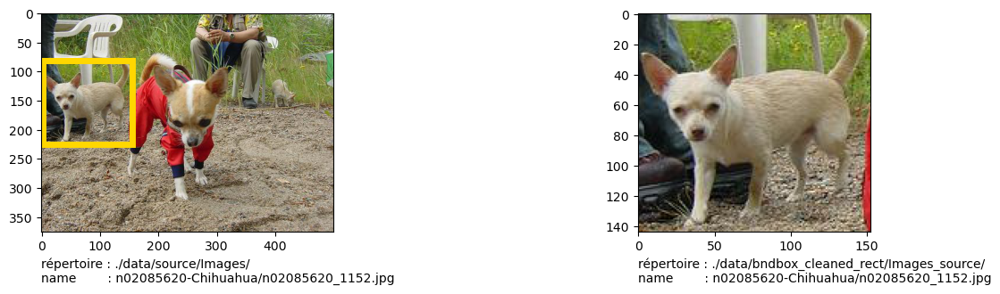

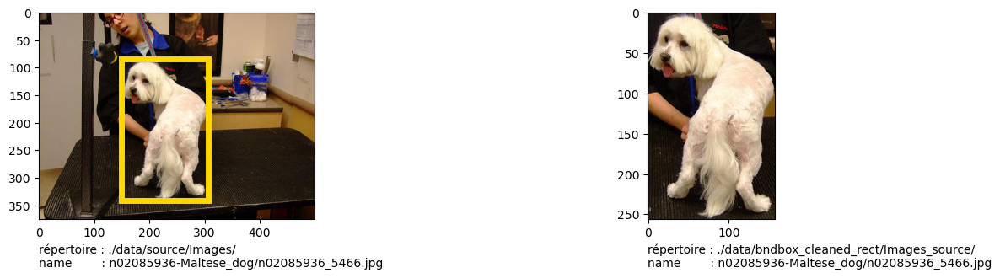

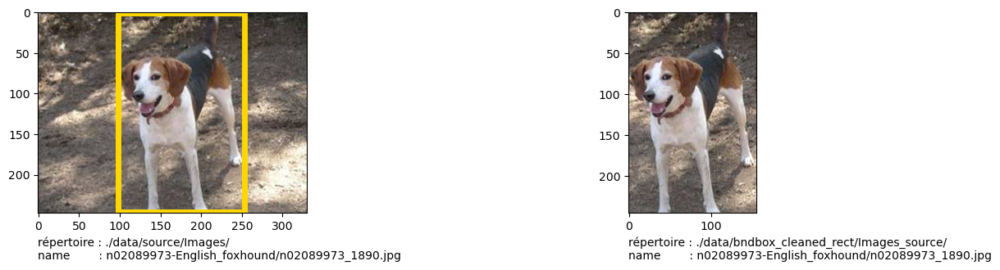

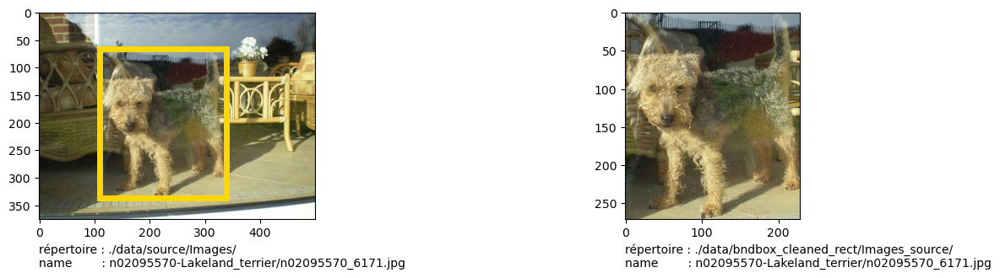

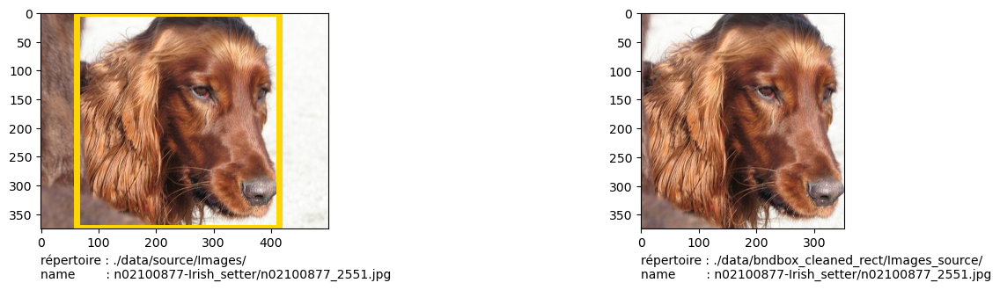

In [38]:
# Pour quelques images
for index in [10, 500, 3_000, 7_000, 11_000]:
    bounding_box(index_in             = index,
                 folder_source_in     = folder_source,
                 folder_target_in     = folder_target, 
                 afficher_image_in    = True,
                 enregistrer_image_in = False)

In [39]:
# Pour toutes les images
for index, row in df_annotation.iterrows():
    bounding_box(index_in             = index,
                 folder_source_in     = folder_source,
                 folder_target_in     = folder_target, 
                 afficher_image_in    = False,
                 enregistrer_image_in = True)

<PIL.Image.Image image mode=RGB size=213x189 at 0x26681972820>  : conversion RGBA --> RGB


In [329]:
# Vérification du nombre d'image avec un suffixe % celles d'origine
def verification_nb_images_avec_suffixe(folder_source_in, folder_target_in, suffixe_in, afficher_subfolder_in):
    
    # Initialisation
    nb_difference = 0
    
    # nom folder | nb fichiers subfolder source | nb fichiers subfolder target (suffixe _carre)
    if (afficher_subfolder_in):
        print('nom folder\t\t\t\t| nb fichiers source\t| nb fichiers cleaned, suffixe', suffixe_in)
        print('-' * 100)
    
    for dir_image in os.listdir(folder_target_in):
        path_subfolder_images = folder_target_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
        
        count = 0 # initialisation
        for img in liste_images:
             
            if (suffixe_in in img):
                count = count + 1
#        print('path_subfolder_images =', path_subfolder_images, ':', count, 'fichiers avec le suffixe', suffixe_in)
        
        # Données répertoire source
        path_subfolder_images_source = folder_source_in + dir_image
        liste_images_source = os.listdir(path_subfolder_images_source)
        count_source = len(liste_images_source)
        
        if (afficher_subfolder_in):
#           print('path_subfolder_images_source =', path_subfolder_images_source, ':', count_source)
        
            # nom folder | nb fichiers subfolder source | nb fichiers subfolder target (suffixe _carre)
            print(dir_image, ' ' * (45 -  len(dir_image)), count_source, '\t\t\t', count)
        
        # Vérification qu'il y a bien le même nombre de fichiers entre la source et celui suffixé
        if (count_source != count):
            nb_difference = nb_difference + 1
            
    # Ajout retour chariot avant conclusion pour aérer si la liste des subfolder a été écrite.
    if (afficher_subfolder_in):
         espace = '\n'
    else:
        espace = ''
        
    if (nb_difference == 0):
        print(espace, ':-) ==> source % suffixe', suffixe_in, ': TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE')
    else:
        print(espace, ':-( ==> source % suffixe', suffixe_in, ':', nb_difference, 
              'FOLDERS AVEC NOMBRE DE FICHIERS DIFFERENT')

In [42]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source,
                                    folder_target_in      = folder_target,
                                    suffixe_in            = '',
                                    afficher_subfolder_in = False)


==> source % suffixe  : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


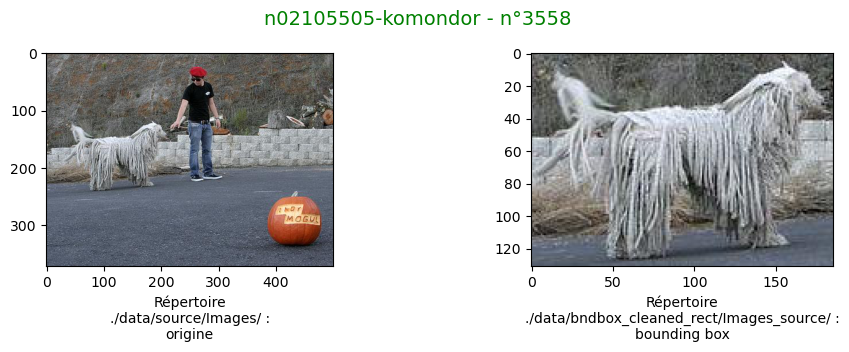

In [43]:
# Affichage d'une image avant et après changement de luminosité pour vérifier
fig = plt.figure(figsize = (10, 3.5)) # longueur, hauteur
fig.suptitle(t = 'n02105505-komondor - n°3558', fontsize = 14, color = 'green')
             
plt.subplot(1, 2, 1)
im_origine = Image.open(folder_source + 'n02105505-komondor/n02105505_3558.jpg')
plt.imshow(im_origine)
plt.xlabel('Répertoire\n' + folder_source + ' :\norigine')
    
plt.subplot(1, 2, 2)
im_luminosite = Image.open(folder_target + 'n02105505-komondor/n02105505_3558.jpg')
plt.imshow(im_luminosite)
plt.xlabel('Répertoire\n' + folder_target + ' :\nbounding box')

plt.tight_layout()
plt.show()

# 2. Prétraitement des images / images preprocessing

In [ ]:
# Les images sont générées dans les folders C_DATASET_CLEANED_RECT, C_DATASET_CLEANED_CARRE, C_BNDBOX_CLEANED_RECT,
# C_BNDBOX_CLEANED_CARRE.
# Ils contiennnent une image unique pour un type de chien.
#
#  2.1. Taille images -------------------> fichier xxx_carre.jpg (1)
#  2.2. Luminosité ----------------------> fichier xxx_luminosite.jpg (2)
#  2.3. Contrastes ----------------------> fichier xxx_contraste.jpg (2)
#  2.4. Rotation ------------------------> fichier xxx_rotation_45.jpg (1)
#  2.5. Bruit ---------------------------> fichier xxx_bruit.jpg (2)


# Remarque : 
#   > (1) Résultats des traitements qui améliorent les images.
#   > (2) Résultats des traitements destructeurs (i.e. avec perte d'éléments).

In [23]:
# Données carrées : 
# création des répertoire pour chaque type de traitement et des sous-répertoires (1 / race de chien)
for folder_cleaned_carre in [C_DATASET_CLEANED_CARRE,
                             C_DATASET_CLEANED_CARRE_IMAGES_SOURCE, 
                             C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE, C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE,
                             C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45, C_DATASET_CLEANED_CARRE_IMAGES_BRUIT]:
    
    os.mkdir(folder_cleaned_carre)
    print('@' * 30, 'Création folder', folder_cleaned_carre, '@' * 30)

    # Création des mêmes sous-répertoires (vides) que le répertoire source.
    # Cas particulier : pas de création de sous-répertoires pour le répertoire C_DATASET_CLEANED_CARRE car il contient
    # n sous-répertoires C_DATASET_CLEANED_CARRE_IMAGES_xxx.
    if (folder_cleaned_carre != C_DATASET_CLEANED_CARRE):
        creation_sous_repertoires(chemin_repertoire_in = folder_cleaned_carre)
    
    print('\n')
    

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_carre/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_carre/Images_source/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_carre/Images_source/n02085620-Chihuahua
# création folder ./data/cleaned_carre/Images_source/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_carre/Images_luminosite/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_carre/Images_luminosite/n02085620-Chihuahua
# création folder ./data/cleaned_carre/Images_luminosite/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_carre/Images_contraste/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_carre/Images_contraste/n02085620-Chihuahua
# création folder ./data/cleaned_carre/Images_contraste/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_carre/Images_rotation_45/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_carre/Images_rotation_45/n02085620-Chihuahua
# création folder ./data/cleaned_carre/Images_rotation_45/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_carre/Images_bruit/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_carre/Images_bruit/n02085620-Chihuahua
# création folder ./data/cleaned_carre/Images_bruit/n02085782-Japanese_spaniel
# [...]

In [24]:
# Données rectangulaires : 
# création des répertoire pour chaque type de traitement et des sous-répertoires (1 / race de chien)
for folder_cleaned_rect in [C_DATASET_CLEANED_RECT,
                            C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE, C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE,
                            C_DATASET_CLEANED_RECT_IMAGES_ROTATION_45, C_DATASET_CLEANED_RECT_IMAGES_BRUIT]:
    
    os.mkdir(folder_cleaned_rect)
    print('@' * 30, 'Création folder', folder_cleaned_rect, '@' * 30)

    # Création des mêmes sous-répertoires (vides) que le répertoire source
    # Cas particulier : pas de création de sous-répertoires pour le répertoire C_DATASET_CLEANED_RECT car il contient
    # n sous-répertoires C_DATASET_CLEANED_RECT_IMAGES_xxx.
    if (folder_cleaned_rect != C_DATASET_CLEANED_RECT):
        creation_sous_repertoires(chemin_repertoire_in = folder_cleaned_rect)
    
    print('\n')
    
    
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_rect/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_rect/Images_luminosite/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_rect/Images_luminosite/n02085620-Chihuahua
# création folder ./data/cleaned_rect/Images_luminosite/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_rect/Images_contraste/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_rect/Images_contraste/n02085620-Chihuahua
# création folder ./data/cleaned_rect/Images_contraste/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_rect/Images_rotation_45/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_rect/Images_rotation_45/n02085620-Chihuahua
# création folder ./data/cleaned_rect/Images_rotation_45/n02085782-Japanese_spaniel
# [...]
# 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ Création folder ./data/cleaned_rect/Images_bruit/ @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# création folder ./data/cleaned_rect/Images_bruit/n02085620-Chihuahua
# création folder ./data/cleaned_rect/Images_bruit/n02085782-Japanese_spaniel
# [...]

# 2.1. Taille images

In [235]:
# Maj nom folders
folder_source_rect  = C_DATASET_SOURCE_IMAGES
folder_target_carre = C_DATASET_CLEANED_CARRE_IMAGES_SOURCE

print('>>>>>>> Images rectangulaires (source) :',
      '\n\tfolder_source_rect\t\t=', folder_source_rect,
      '\n\tfolder_target_carre\t\t=', folder_target_carre)

>>>>>>> Images rectangulaires (source) : 
	folder_source_rect		= ./data/source/Images/ 
	folder_target_carre		= ./data/cleaned_carre/Images_source/


In [237]:
# Maj nom folders bndbox
folder_bndbox_source_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE
folder_bndbox_target_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE

print('>>>>>>> Images rectangulaires & bndbox (source) :',
      '\n\tfolder_bndbox_source_rect\t=', folder_bndbox_source_rect,
      '\n\tfolder_bndbox_target_carre\t=', folder_bndbox_target_carre)

>>>>>>> Images rectangulaires & bndbox (source) : 
	folder_bndbox_source_rect	= ./data/bndbox_cleaned_rect/Images_source/ 
	folder_bndbox_target_carre	= ./data/bndbox_cleaned_carre/Images_source/


# 2.1.1. Etude taille images

In [ ]:
############################################
#            Pour une image                #
############################################

Largeur = 360 px, hauteur = 273 px
type = <class 'tuple'>


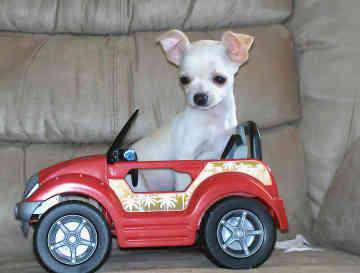

In [184]:
# Chargement et affichage de l'image source
img = Image.open(folder_source_rect + 'n02085620-Chihuahua/n02085620_2937.jpg') 

w, h = img.size
print('Largeur = {} px, hauteur = {} px'.format(w, h))
print('type =', type(img.size))

img

Largeur = 135 px, hauteur = 164 px
type = <class 'tuple'>


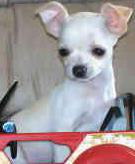

In [185]:
# Chargement et affichage de l'image source bndbox
img_bndbox = Image.open(folder_bndbox_source_rect + 'n02085620-Chihuahua/n02085620_2937.jpg') 

# Taille de l'image analogique (en pixels)
w, h = img_bndbox.size
print('Largeur = {} px, hauteur = {} px'.format(w, h))
print('type =', type(img_bndbox.size))

img_bndbox

In [ ]:
############################################
#         Pour toutes les images           #
############################################

In [64]:
# Calcul largeur, hauteur, mode pour chaque image et stockage dans des listes.
def calcul_taille_images(folder_source_in):
    
    images_largeur = []
    images_hauteur = []
    images_mode    = []

    for dir_image in liste_dir_images:
        # sous-répertoire du folder 'Images'
        path_subfolder_images = folder_source_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
    
        print('path_subfolder_images =', path_subfolder_images, '\n')
 
        for img in liste_images:
            img_ = Image.open(path_subfolder_images + '/' + img)
        
            largeur, hauteur = img_.size        
            mode = img_.mode
            mat = np.array(img_)
            print(img, '\t: hauteur =', hauteur, ', largeur =', largeur, ', mode =', mode, ', shape =', mat.shape)
        
            images_largeur.append(largeur)
            images_hauteur.append(hauteur)
            images_mode.append(mode) 
        
        print('\n\n')    
        print('@' * 100)
    
    return images_largeur, images_hauteur, images_mode

In [25]:
images_largeur, images_hauteur, images_mode = \
calcul_taille_images(folder_source_in = folder_source_rect)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# path_subfolder_images = ./data/source/Images/n02085620-Chihuahua
# 
# n02085620_10074.jpg	: hauteur = 500 , largeur = 333 , mode = RGB , shape = (500, 333, 3)
# n02085620_10131.jpg	: hauteur = 495 , largeur = 395 , mode = RGB , shape = (495, 395, 3)
# n02085620_10621.jpg	: hauteur = 298 , largeur = 500 , mode = RGB , shape = (298, 500, 3)
# n02085620_1073.jpg	: hauteur = 500 , largeur = 345 , mode = RGB , shape = (500, 345, 3)
# [...]

In [26]:
images_bndbox_largeur, images_bndbox_hauteur, images_bndbox_mode = \
calcul_taille_images(folder_source_in = folder_bndbox_source_rect)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# path_subfolder_images = ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua
# 
# n02085620_10074.jpg	: hauteur = 488 , largeur = 251 , mode = RGB , shape = (488, 251, 3)
# n02085620_10131.jpg	: hauteur = 484 , largeur = 344 , mode = RGB , shape = (484, 344, 3)
# n02085620_10621.jpg	: hauteur = 207 , largeur = 193 , mode = RGB , shape = (207, 193, 3)
# n02085620_1073.jpg	: hauteur = 471 , largeur = 312 , mode = RGB , shape = (471, 312, 3)
# [...]

In [107]:
print('\t| <--------- IMAGES ----------> || <------------- IMAGES_BNDBOX --------------> |')
print('\t| images_largeur| images_hauteur|| images_bndbox_largeur| images_bndbox_hauteur |')
print('|-------|---------------|---------------||----------------------|-----------------------|')
print('| min\t|\t', min(images_largeur),        '\t|\t',   min(images_hauteur), 
      '\t||\t',     min(images_bndbox_largeur), '\t\t|\t', min(images_bndbox_hauteur), '\t\t|')

print('| max\t|\t', max(images_largeur),        '\t|\t',   max(images_hauteur), 
      '\t||\t',     max(images_bndbox_largeur), '\t\t|\t', max(images_bndbox_hauteur), '\t\t|')

print('| mean\t|\t', round(statistics.mean(images_largeur), 1), '\t|\t', round(statistics.mean(images_hauteur), 1), 
      '\t||\t',      round(statistics.mean(images_bndbox_largeur), 1), '\t\t|\t', 
      round(statistics.mean(images_bndbox_hauteur), 1), '\t\t|')

	| <--------- IMAGES ----------> || <------------- IMAGES_BNDBOX --------------> |
	| images_largeur| images_hauteur|| images_bndbox_largeur| images_bndbox_hauteur |
|-------|---------------|---------------||----------------------|-----------------------|
| min	|	 97 	|	 100 	||	 32 		|	 38 		|
| max	|	 3264 	|	 2562 	||	 2735 		|	 2025 		|
| mean	|	 442.5 	|	 385.9 	||	 289.0 		|	 297.6 		|


In [146]:
# https://www.techiedelight.com/fr/count-occurrences-of-an-item-in-a-python-list/

print('         | <-------------- IMAGES ------------> || <------------- IMAGES_BNDBOX --------------> |')
print('|--------|--------------------------------------||----------------------------------------------|')
print('| min    |\t\t', min(images_mode),       '\t\t\t||\t\t\t', min(images_bndbox_mode),       '\t\t\t|')
print('| max    |\t\t', max(images_mode),       '\t\t\t||\t\t\t', max(images_bndbox_mode),       '\t\t\t|')
print('| unique |\t',   list(set(images_mode)), '\t\t||\t\t\t',   list(set(images_bndbox_mode)), '\t\t|')
print('| unique |',     Counter(images_mode),   '\t||\t',         Counter(images_bndbox_mode),   '\t\t|')

         | <-------------- IMAGES ------------> || <------------- IMAGES_BNDBOX --------------> |
|--------|--------------------------------------||----------------------------------------------|
| min    |		 RGB 			||			 RGB 			|
| max    |		 RGBA 			||			 RGB 			|
| unique |	 ['RGBA', 'RGB'] 		||			 ['RGB'] 		|
| unique | Counter({'RGB': 20579, 'RGBA': 1}) 	||	 Counter({'RGB': 20580}) 		|


In [147]:
###############################################################
#   METHODE VALEURS ABERRANTES : IQR (Inter Quartile Range)   #
###############################################################
# L’approche IQR pour trouver les valeurs aberrantes est l’approche la plus couramment utilisée et la plus fiable 
# dans le domaine de la recherche.
def IQR(liste_in, liste_name_in):
    
    print('\n', '@' * 43, ' ' * 7, liste_name_in, ' ' * 7, '@' * 43)
    
    print('---> Statistiques :')
    print('\t- min\t\t\t\t=', min(liste_in), '\n\t- max\t\t\t\t=', max(liste_in))
    print('\t- mean\t\t\t\t=', round(statistics.mean(images_largeur), 1), '\n')    
    
    
    ###################################################
    # Quartile 1 et quartile 3                        #
    ###################################################
    print('---> Quartiles :')    
    # Quartile 1
    Q1 = round(np.percentile(liste_in, 25, method = 'midpoint'), 2)
#    Q1 = round(np.nanpercentile(liste_in, 25, method = 'midpoint'), 2)   # ignoring nan values

    # Quartile 3
    Q3 = round(np.percentile(liste_in, 75, method = 'midpoint'), 2)    
#    Q3 = round(np.nanpercentile(liste_in, 75, method = 'midpoint'), 2)   # ignoring nan values

    
    ###################################################
    # IQR                                             #
    ###################################################
    # IQR = Quartile 3 – Quartile 1
    IQR = Q3 - Q1

    print('\t- Q1\t\t\t\t=', Q1, '\n\t- Q3\t\t\t\t=', Q3, '\n\t- IQR\t\t\t\t=', IQR, '\n')

    
    
    ###################################################
    # Upper limit et lower limit                      #
    ###################################################
    print('---> Limites :')    
    # Upper limit (limite supérieure = Q3 + 1,5 * IQR)
    upper_limit = round(Q3 + 1.5 * IQR, 2)
    print('\t- upper_limit\t\t\t=', upper_limit)
    
    # Lower limit (limite inférieure = Q1 – 1,5 * IQR)
    lower_limit = round(Q1 - 1.5 * IQR, 2)
    print('\t- lower_limit\t\t\t=', lower_limit, '\n')
    

    
    ###################################################
    # Outliers                                        #
    ###################################################
    # Valeurs aberrantes = au-dessus de la limite supérieure et au-dessous de la limite inférieure.
    print('---> Outliers :')     
    outliers_upper_limit = []
    for outlier_upper in liste_in:
        if (outlier_upper > upper_limit):
            outliers_upper_limit.append(outlier_upper)
    print('\t- Nb outliers > upper_limit\t=', len(outliers_upper_limit))        
    
    outliers_lower_limit = []   
    for outlier_lower in liste_in:
        if (outlier_lower < lower_limit):
            outliers_lower_limit.append(outlier_lower)
    print('\t- Nb outliers < lower_limit\t=', len(outliers_lower_limit)) 

In [177]:
# Visualisation taille (largeur / hauteur) images.
def IQR_plot(liste_in, liste_name_in):
    fig = plt.figure(figsize = (10, 3.5)) # longueur, hauteur

    # Histogramme
    plt.subplot(1, 2, 1)
    if ('bndbox_' in liste_name_in):
        color_hist     = 'orange'
        edgecolor_hist ='red'
    else:
        color_hist     = 'greenyellow'
        edgecolor_hist = 'darkgreen'
    plt.hist(liste_in, rwidth = 0.8, bins = 20, color = color_hist, edgecolor = edgecolor_hist)
    plt.xlabel(liste_name_in + ' (pixels)')
    plt.ylabel('Frequence')
    plt.title('Histogramme ' + liste_name_in, fontsize = 13)

    
    # Boxplot
    plt.subplot(1, 2, 2)
    if ('bndbox_' in liste_name_in):
        color_boxplot = 'yellow'
    else:
        color_boxplot = 'cyan'    
    plt.title('\n\nBoxplot ' + liste_name_in + ' (étude outliers)', fontsize = 13)    
    sns.boxplot(x = liste_in, color = color_boxplot)

    # Display the plot
    fig.tight_layout()  # Espace entre les subplots
    plt.show()
    
    print('\n' * 5)    


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@         images_largeur         @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
---> Statistiques :
	- min				= 97 
	- max				= 3264
	- mean				= 442.5 

---> Quartiles :
	- Q1				= 361.0 
	- Q3				= 500.0 
	- IQR				= 139.0 

---> Limites :
	- upper_limit			= 708.5
	- lower_limit			= 152.5 

---> Outliers :
	- Nb outliers > upper_limit	= 348
	- Nb outliers < lower_limit	= 124


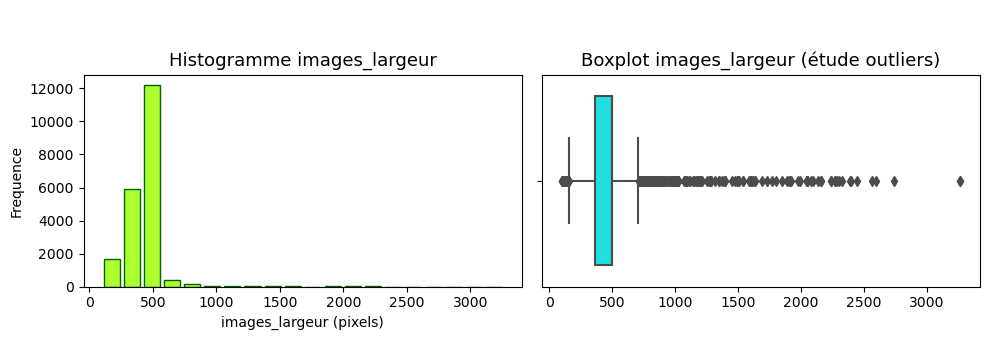








 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@         images_hauteur         @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
---> Statistiques :
	- min				= 100 
	- max				= 2562
	- mean				= 442.5 

---> Quartiles :
	- Q1				= 333.0 
	- Q3				= 453.0 
	- IQR				= 120.0 

---> Limites :
	- upper_limit			= 633.0
	- lower_limit			= 153.0 

---> Outliers :
	- Nb outliers > upper_limit	= 322
	- Nb outliers < lower_limit	= 211


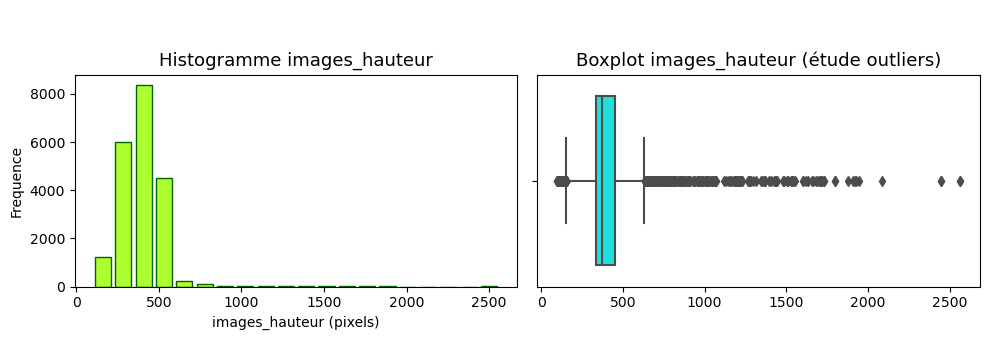

In [178]:
# Affichage statistiques et visualisation image
for liste, liste_name in [[images_largeur, 'images_largeur'], [images_hauteur, 'images_hauteur']]:
    IQR(liste_in = liste, liste_name_in = liste_name)
    IQR_plot(liste_in = liste, liste_name_in = liste_name)


 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@         images_bndbox_largeur         @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
---> Statistiques :
	- min				= 32 
	- max				= 2735
	- mean				= 442.5 

---> Quartiles :
	- Q1				= 200.0 
	- Q3				= 362.0 
	- IQR				= 162.0 

---> Limites :
	- upper_limit			= 605.0
	- lower_limit			= -43.0 

---> Outliers :
	- Nb outliers > upper_limit	= 203
	- Nb outliers < lower_limit	= 0


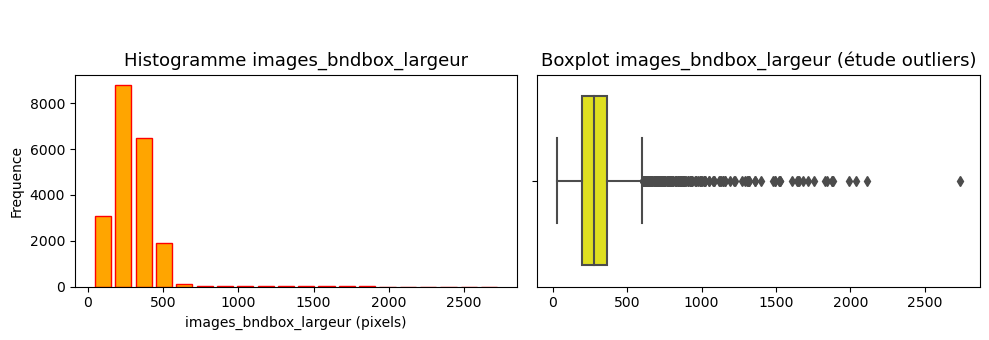








 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@         images_bndbox_hauteur         @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
---> Statistiques :
	- min				= 38 
	- max				= 2025
	- mean				= 442.5 

---> Quartiles :
	- Q1				= 220.0 
	- Q3				= 357.0 
	- IQR				= 137.0 

---> Limites :
	- upper_limit			= 562.5
	- lower_limit			= 14.5 

---> Outliers :
	- Nb outliers > upper_limit	= 285
	- Nb outliers < lower_limit	= 0


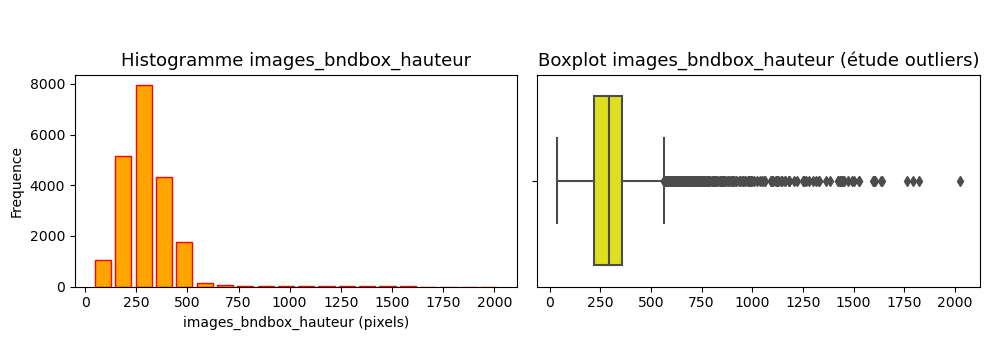

In [179]:
# Affichage statistiques et visualisation image bndbox
for liste, liste_name in [[images_bndbox_largeur, 'images_bndbox_largeur'], 
                          [images_bndbox_hauteur, 'images_bndbox_hauteur']]:
    IQR(liste_in = liste, liste_name_in = liste_name)
    IQR_plot(liste_in = liste, liste_name_in = liste_name)

# 2.1.2. Test redimensionnement images

In [180]:
# Choix de redimmensionner, non pas suivant la moyenne (442, 385) pour les images ou (289, 297) pour les images_bndbox,
# mais dans un carré plus petit (200, 200) pour limiter le nombre de features.
# Le carré permet aux algorithmes de fonctionner.
new_width         = 200
new_height        = 200

new_width_bndbox  = 200
new_height_bndbox = 200

In [ ]:
############################################
#            Pour une image                #
############################################

C:\Users\valdu\AppData\Local\Temp\ipykernel_4304\3026065665.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  resample = Image.LANCZOS)
C:\Users\valdu\AppData\Local\Temp\ipykernel_4304\3026065665.py:28: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  resample = Image.BICUBIC)


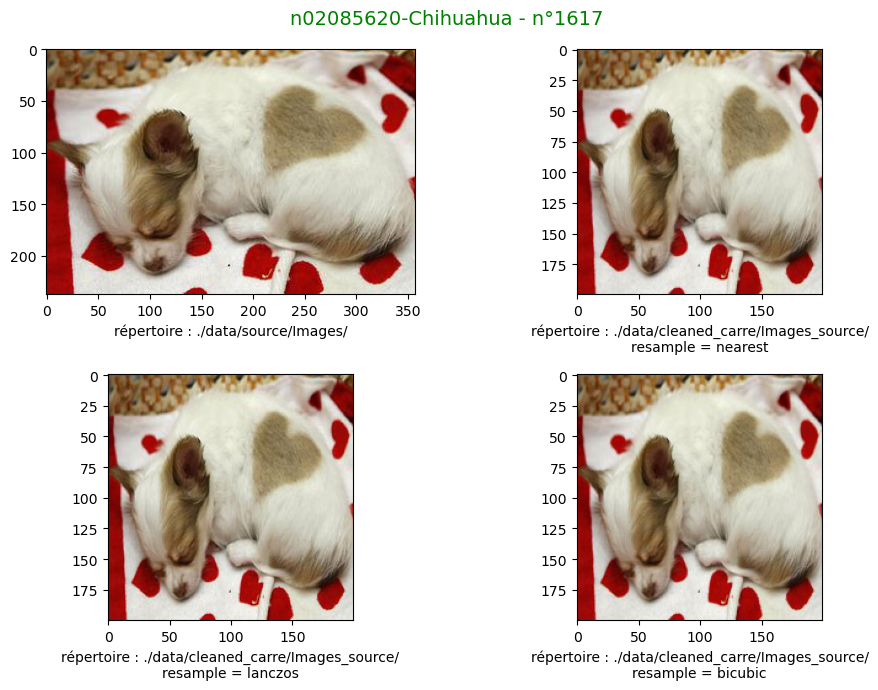

In [155]:
# Redimensionnement images
# https://apprendrepython.com/redimensionner-des-images-avec-python-pillow/
fig = plt.figure(figsize = (10, 7)) # longueur, hauteur
fig.suptitle(t = 'n02085620-Chihuahua - n°1617', fontsize = 14, color = 'green')

plt.subplot(2, 2, 1)
img = Image.open(folder_source + 'n02085620-Chihuahua/n02085620_1617.jpg')
plt.imshow(img)
plt.xlabel('répertoire : ' + folder_source)

# Define the new size (width, height) <=> mean largeur et hauteur
plt.subplot(2, 2, 2)
img_resize = img.resize(size = (new_width, new_height))
img_resize.save(folder_target + 'n02085620-Chihuahua/n02085620_1617_resize_nearest.jpg')
plt.imshow(img_resize)
plt.xlabel('répertoire : ' + folder_target + '\nresample = nearest')

plt.subplot(2, 2, 3)
img_resize_lanczos = img.resize(size     = (new_width, new_height), 
                                resample = Image.LANCZOS)
img_resize_lanczos.save(folder_target + 'n02085620-Chihuahua/n02085620_1617_resize_lanczos.jpg')
plt.imshow(img_resize_lanczos)
plt.xlabel('répertoire : ' + folder_target + '\nresample = lanczos')


plt.subplot(2, 2, 4)
img_resize_bicubic = img.resize(size     = (new_width, new_height), 
                                resample = Image.BICUBIC)
img_resize_bicubic.save(folder_target + 'n02085620-Chihuahua/n02085620_1617_resize_bicubic.jpg')
plt.imshow(img_resize_bicubic)
plt.xlabel('répertoire : ' + folder_target + '\nresample = bicubic')

fig.tight_layout()  # Espace entre les subplots
plt.show()

# Pas de différence entre les photos => nous appliquerons le resize avec la valeur par défaut.

In [156]:
# Suppression des 3 fichiers avant d'appliquer à tout le dataset.
os.remove(folder_target + 'n02085620-Chihuahua/n02085620_1617_resize_nearest.jpg')
os.remove(folder_target + 'n02085620-Chihuahua/n02085620_1617_resize_lanczos.jpg')
os.remove(folder_target + 'n02085620-Chihuahua/n02085620_1617_resize_bicubic.jpg')

# 2.1.3. Preprocessing taille images

In [ ]:
############################################
#         Pour toutes les images           #
############################################

In [159]:
# C_DATASET_SOURCE_IMAGES/xxx_subfoldername/xxx_yyy.jpg --> 
# C_DATASET_CLEANED_CARRE_IMAGES_SOURCE/xxx_subfoldername/xxx_yyy_carre.jpg

def preprocessing_taille_images(folder_source_in, folder_target_in, suffixe_in, new_width_in, new_height_in):
    # Calcul largeur, hauteur, mode pour chaque image et stockage dans des listes.
    images_cleaned_largeur = []
    images_cleaned_hauteur = []
    count                  = 0

    print('folder_source =', folder_source_in,
          '\nfolder_target =', folder_target_in, '\n')

    for dir_image in os.listdir(folder_source_in):
        # sous-répertoire du folder 'Images'
        path_subfolder_images = folder_source_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
    
        # affichage uniquement des 5 premières lignes
        if (count < 5):    
             print('path_subfolder_images =', path_subfolder_images, '\n')

        for img in liste_images:
            img_       = Image.open(path_subfolder_images + '/' + img)
            length_img = len(img)
        
            # Conversion image RGBA en image RGB (1 seule image / 21281)
            # https://stackoverflow.com/questions/50331463/convert-rgba-to-rgb-in-python
            if (img_.mode == 'RGBA'):
                rgba_image = img_
                rgb_image  = rgba_image.convert('RGB')
                img_       = rgb_image
                print(img, ' : conversion RGBA --> RGB')
        
            img_resize = img_.resize(size = (new_width_in, new_height_in))
            largeur_resize, hauteur_resize = img_resize.size 
            # On enlève les 4 derniers caractères : '.jpg' pour remplacer par '_carre.jpg'
            img_resize.save(folder_target_in + dir_image + '/' + img[0:length_img - 4] + suffixe_in)
        
            # affichage uniquement des 5 premières lignes
            if (count < 5):
                print(img, '\t: (largeur, hauteur) avant =', img_.size, '--> (largeur, hauteur) après =', img_resize.size)
            
            images_cleaned_largeur.append(largeur_resize)
            images_cleaned_hauteur.append(hauteur_resize)
        
            count = count + 1
    
        # affichage uniquement des 5 premières lignes
        if (count < 5): 
            print('\n\n')    
            print('@' * 100)
        
    print('.' * 3) 

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @              Images rectangulaires               @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [3]:
preprocessing_taille_images(folder_source_in = folder_source_rect, 
                            folder_target_in = folder_target_carre,
                            suffixe_in       = '_carre.jpg',
                            new_width_in     = new_width,
                            new_height_in    = new_height)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#folder_source = ./data/source/Images/ 
#folder_target = ./data/cleaned_carre/Images_source/ 
#
#path_subfolder_images = ./data/source/Images/n02085620-Chihuahua 
#
#n02085620_10074.jpg 	: (largeur, hauteur) avant = (333, 500) --> (largeur, hauteur) après = (200, 200)
#n02085620_10131.jpg 	: (largeur, hauteur) avant = (395, 495) --> (largeur, hauteur) après = (200, 200)
#n02085620_10621.jpg 	: (largeur, hauteur) avant = (500, 298) --> (largeur, hauteur) après = (200, 200)
#[...]

In [45]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_rect,
                                    folder_target_in      = folder_target_carre,
                                    suffixe_in            = '_carre.jpg',
                                    afficher_subfolder_in = True)

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# ==> source % suffixe _carre.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE

==> source % suffixe _carre.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @          Images rectangulaires bndbox            @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [4]:
preprocessing_taille_images(folder_source_in = folder_bndbox_source_rect, 
                            folder_target_in = folder_bndbox_target_carre,
                            suffixe_in       = '_carre.jpg',
                            new_width_in     = new_width_bndbox,
                            new_height_in    = new_height_bndbox)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#folder_source = ./data/bndbox_cleaned_rect/Images_source/ 
#folder_target = ./data/bndbox_cleaned_carre/Images_source/ 
#
#path_subfolder_images = ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua 
#
#n02085620_10074.jpg 	: (largeur, hauteur) avant = (251, 488) --> (largeur, hauteur) après = (200, 200)
#n02085620_10131.jpg 	: (largeur, hauteur) avant = (344, 484) --> (largeur, hauteur) après = (200, 200)
#n02085620_10621.jpg 	: (largeur, hauteur) avant = (193, 207) --> (largeur, hauteur) après = (200, 200)
#[...]

In [182]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_rect,
                                    folder_target_in      = folder_bndbox_target_carre,
                                    suffixe_in            = '_carre.jpg',
                                    afficher_subfolder_in = False)


==> source % suffixe _carre.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


# 2.1.4. Affichage % taille image

In [218]:
def affichage_image_taille(folder_source_in, 
                           folder_target_in,
                           folder_number_in,
                           breed_in,
                           dog_number_in):
    
    image_name = folder_number_in + '-' + breed_in + '/' + folder_number_in + '_' + dog_number_in
    
          
    # Maj couleur suivant caractéristiques de l'image
    # Palette couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html    
    # Image carrée  
    if ('carre' in folder_source_in):
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            type_image = 'carrée & bndbox'
            color      = 'red'
        else:
            type_image = 'carrée'
            color      = 'fuchsia'

    # Image rectangulaire
    elif ('rect' in folder_source_in):
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            type_image = 'rectangulaire & bndbox'
            color      = 'green'
        else:
            type_image = 'rectangulaire'
            color      = 'dodgerblue'
            

    
    # Affichage d'une image avant et après changement de luminosité pour vérifier
    fig = plt.figure(figsize = (10, 3.3)) # longueur, hauteur
    fig.suptitle(t        =  '[Image ' + type_image + '] ' + folder_number_in + '-' + breed_in + ' - n°' + dog_number_in,
                 fontsize = 14, 
                 color    = color)
             
    plt.subplot(1, 2, 1)
    # image_name = 'n02085620-Chihuahua/n02085620_2937.jpg'
    im_origine = Image.open(folder_source_in + image_name + '.jpg')         
    plt.imshow(im_origine)
    plt.xlabel('Répertoire ' + folder_source_in + ' :\norigine')
    
    plt.subplot(1, 2, 2)
    # image_name = 'n02085620-Chihuahua/n02085620_2937_carre.jpg'
    im_carre = Image.open(folder_target_in + image_name + '_carre.jpg')
    plt.imshow(im_carre)
    plt.xlabel('Répertoire ' + folder_target_in + ' :\ncarré')

    plt.tight_layout()
    plt.show()
    
    # Saut de ligne pour image suivante
    print('\n')

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @         n02085620-Chihuahua - n°2937            @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

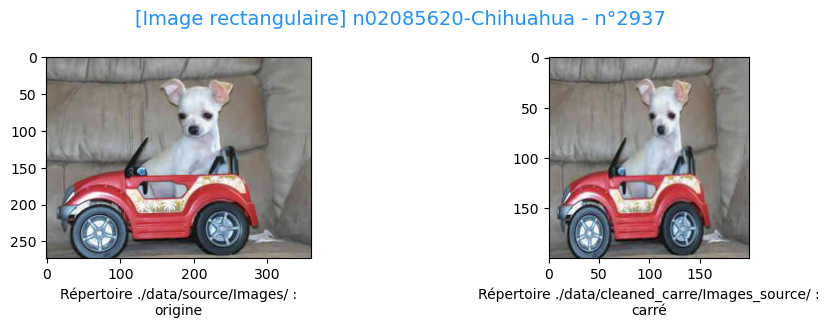

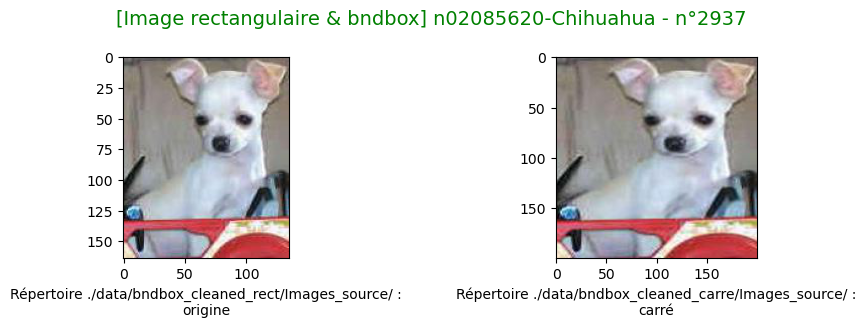

In [219]:
folder_number = 'n02085620'
breed         = 'Chihuahua'
dog_number    = '2937'
        
# Image rectangulaire
affichage_image_taille(folder_source_in = folder_source_rect, 
                       folder_target_in = folder_target_carre,
                       folder_number_in = folder_number,
                       breed_in         = breed,
                       dog_number_in    = dog_number)

# Image rectangulaire & bndbox
affichage_image_taille(folder_source_in = folder_bndbox_source_rect, 
                       folder_target_in = folder_bndbox_target_carre,
                       folder_number_in = folder_number,
                       breed_in         = breed,
                       dog_number_in    = dog_number)

# 2.2. Luminosité

In [376]:
# Maj nom folders
folder_source_rect  = C_DATASET_SOURCE_IMAGES
folder_target_rect  = C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE

folder_source_carre = C_DATASET_CLEANED_CARRE_IMAGES_SOURCE
folder_target_carre = C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_source_rect\t=', folder_source_rect,
      '\n\tfolder_target_rect\t=', folder_target_rect, '\n')

print('>>>>>>> Images carrées (source) :'
      '\n\tfolder_source_carre\t=', folder_source_carre,
      '\n\tfolder_target_carre\t=', folder_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_source_rect	= ./data/source/Images/ 
	folder_target_rect	= ./data/cleaned_rect/Images_luminosite/ 

>>>>>>> Images carrées (source) :
	folder_source_carre	= ./data/cleaned_carre/Images_source/ 
	folder_target_carre	= ./data/cleaned_carre/Images_luminosite/


In [377]:
# Maj nom folders bndbox
folder_bndbox_source_rect = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE
folder_bndbox_target_rect = C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE

folder_bndbox_source_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE
folder_bndbox_target_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE

print('>>>>>>> Images rectangulaires & bndbox (source) :'
      '\n\tfolder_bndbox_source_rect\t=', folder_bndbox_source_rect,
      '\n\tfolder_bndbox_target_rect\t=', folder_bndbox_target_rect, '\n')

print('>>>>>>> Images carrées & bndbox (source) :'
      '\n\tfolder_bndbox_source_carre\t=', folder_bndbox_source_carre,
      '\n\tfolder_bndbox_target_carre\t=', folder_bndbox_target_carre)

>>>>>>> Images rectangulaires & bndbox (source) :
	folder_bndbox_source_rect	= ./data/bndbox_cleaned_rect/Images_source/ 
	folder_bndbox_target_rect	= ./data/bndbox_cleaned_rect/Images_luminosite/ 

>>>>>>> Images carrées & bndbox (source) :
	folder_bndbox_source_carre	= ./data/bndbox_cleaned_carre/Images_source/ 
	folder_bndbox_target_carre	= ./data/bndbox_cleaned_carre/Images_luminosite/


# 2.2.1. Etude luminosité

In [ ]:
############################################
#            Pour une image                #
############################################

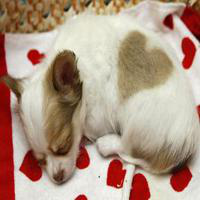

In [256]:
img = Image.open(folder_source_carre + 'n02085620-Chihuahua/n02085620_1617_carre.jpg')
img

In [257]:
# Afficher format de pixel utilisé / mode de quantification
print("Format des pixels : {}".format(img.mode))

# Intensité associée au pixel à une position donnée.
# Par convention dans Pillow, le repère cartésien a pour origine le pixel le plus en haut à gauche de l'image, 
# et l'axe des ordonnées est orienté vers le bas. 
# https://pillow.readthedocs.io/en/stable/handbook/concepts.html
px_value = img.getpixel((20, 100)) # (abscisse, ordonnée)
print("Valeur du pixel situé en (20,100) : {}".format(px_value))

Format des pixels : RGB
Valeur du pixel situé en (20,100) : (135, 118, 100)


In [258]:
# Valeurs de tous les pixels de l'image à l'aide de la bibliothèque numpy.

# Récupérer les valeurs de tous les pixels sous forme d'une matrice
mat = np.array(img)
print('mat =\n', mat, '\n')

# Afficher la taille de la matrice de pixels
print('taille de la matrice de pixels : {}'.format(mat.shape))

mat =
 [[[120  91  49]
  [128  99  57]
  [125  93  54]
  ...
  [113  71  29]
  [111  66  25]
  [127  80  38]]

 [[110  81  39]
  [123  94  52]
  [126  94  55]
  ...
  [ 99  57  17]
  [116  73  31]
  [142  95  53]]

 [[100  71  29]
  [120  88  49]
  [127  95  56]
  ...
  [ 90  51  10]
  [120  77  35]
  [145 100  58]]

 ...

 [[159  12   2]
  [150  16   4]
  [147  14   5]
  ...
  [231 232 226]
  [233 234 228]
  [234 235 229]]

 [[157  10   0]
  [148  14   2]
  [146  13   4]
  ...
  [232 233 227]
  [232 233 227]
  [232 233 227]]

 [[155   8   0]
  [146  12   0]
  [145  12   3]
  ...
  [232 233 227]
  [232 233 227]
  [230 231 225]]] 

taille de la matrice de pixels : (200, 200, 3)


In [259]:
##########################################
# Extraction canaux de couleurs (RGB)    #
##########################################
# https://stackoverflow.com/questions/61921718/how-to-plot-image-color-histogram
# Remarque : l'image est fournie soit par son chemin, soit directement.
def process_RGB_channels(file_path_in, image_in):
    
    # Load the image into an array
    if (file_path_in != ''): # paramètre d'entrée = chemin
        image_ndarray = plt.imread(file_path_in) 
    else: # paramètre d'entrée = image => conversion en ndarray
        # https://stacklima.com/comment-convertir-des-images-en-tableau-numpy/        
        image_ndarray = asarray(image_in)
    print('image type\t=', type(image_ndarray))
    print('image shape\t=', image_ndarray.shape)


    # Extract 2-D arrays of the RGB channels : red, green, blue
    red, green, blue = image_ndarray[:,:,0], image_ndarray[:,:,1], image_ndarray[:,:,2]
    print('red shape\t=', red.shape)
    print('green shape\t=', green.shape)
    print('blue shape\t=', blue.shape)

    # Flatten the 2-D arrays of the RGB channels into 1-D
    red_pixels   = red.flatten()
    green_pixels = green.flatten()
    blue_pixels  = blue.flatten()

    return red_pixels, green_pixels, blue_pixels

In [260]:
##############################################
# Tracé 1 : histogrammes RGB cumulés         #
##############################################
# https://stackoverflow.com/questions/61921718/how-to-plot-image-color-histogram
# Remarque : l'image est fournie soit par son chemin, soit directement.
def visualisation_histogrammes_cumules(file_path_in, image_in, titre_in, xlabel_image_in, 
                                       red_pixels_in, green_pixels_in, blue_pixels_in):
    
    fig = plt.figure(figsize = (10, 3.5)) # longueur, hauteur
    fig.suptitle(t = titre_in, fontsize = 14, color = 'green')

    # Image
    plt.subplot(1, 2, 1)
    if (file_path_in != ''): # paramètre d'entrée = chemin
        img = Image.open(file_path_in)
    else: # paramètre d'entrée = image
        img = image_in
    plt.imshow(img)
    plt.xlabel(xlabel_image_in)

    # Histogramme unique : superposition des histogrammes des pixels de chaque couleur
    plt.subplot(1, 2, 2)
    plt.hist(red_pixels_in,   bins = 256, density = False, color = 'red',   alpha = 0.5)
    plt.hist(green_pixels_in, bins = 256, density = False, color = 'green', alpha = 0.4)
    plt.hist(blue_pixels_in,  bins = 256, density = False, color = 'blue',  alpha = 0.3)

    # set labels and ticks
    plt.xticks(ticks = np.linspace(0, 1, 17), labels = range(0, 257, 16))

    # Cosmetics
    plt.title('Histogramme de l\'image en couleur')
    plt.ylabel('Nombre de pixels')
    plt.xlabel('Intensité')

    fig.tight_layout()  # Espace entre les subplots
    # Display the plot
    plt.show()

In [261]:
##############################################
# Tracé 2 : 1 histogramme / couleur          #
##############################################
def visualisation_histogrammes_par_couleur(titre_in, red_pixels_in, green_pixels_in, blue_pixels_in):
    
    fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (18, 5)) # longueur, hauteur
    fig.suptitle(t = titre_in, fontsize = 25, color = 'green')    
    axes = axes.ravel()

    for pix, color, ax in zip([red_pixels_in, green_pixels_in, blue_pixels_in], ['red', 'green', 'blue'], axes):
    
        ax.hist(pix, bins = 256, density = False, color = color, alpha = 0.5)

        # Cosmetics
        ax.set_title(f'Histogramme de la couleur {color}')
        ax.set_ylabel('Nombre de pixels')
        ax.set_xlabel('Intensité')

    # Display the plot
    plt.tight_layout()
    plt.show()

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @         n02085620-Chihuahua - n°1617             @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [249]:
# Extraction canaux de couleurs (RGB)
red_pixels_chihuahua_1617, green_pixels_chihuahua_1617, blue_pixels_chihuahua_1617 = \
process_RGB_channels(file_path_in = folder_source_carre + 'n02085620-Chihuahua/n02085620_1617_carre.jpg',
                     image_in     = '')

image type	= <class 'numpy.ndarray'>
image shape	= (200, 200, 3)
red shape	= (200, 200)
green shape	= (200, 200)
blue shape	= (200, 200)


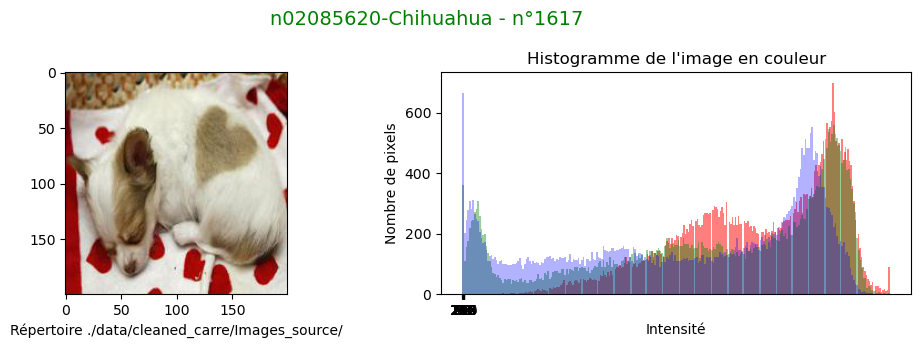

In [262]:
# Visualisation histogrammes RGB cumulés
visualisation_histogrammes_cumules(file_path_in    = folder_source_carre + 'n02085620-Chihuahua/n02085620_1617_carre.jpg',
                                   image_in        = '',
                                   titre_in        = 'n02085620-Chihuahua - n°1617', 
                                   xlabel_image_in = 'Répertoire ' + folder_source_carre,
                                   red_pixels_in   = red_pixels_chihuahua_1617,
                                   green_pixels_in = green_pixels_chihuahua_1617, 
                                   blue_pixels_in  = blue_pixels_chihuahua_1617)

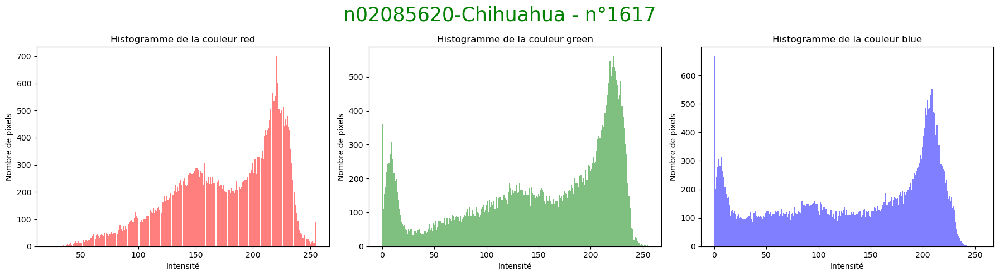

In [263]:
# Visualisation 1 histogramme / couleur
visualisation_histogrammes_par_couleur(titre_in        = 'n02085620-Chihuahua - n°1617',
                                       red_pixels_in   = red_pixels_chihuahua_1617, 
                                       green_pixels_in = green_pixels_chihuahua_1617, 
                                       blue_pixels_in  = blue_pixels_chihuahua_1617)

# 2.2.2. Test luminosité

In [ ]:
############################################
#            Pour une image                #
############################################

In [ ]:
######################################################################
#   La luminosité se corrige grâce à un étirement de l’histogramme   #
#   (méthode autocontrast)                                           #
######################################################################

In [309]:
def test_luminosite(file_path_in, is_histogramme_in, titre_in, xlabel_image_in):
    
    # Image d'origine
    im_origine = Image.open(file_path_in) 
    
    xlabel_image = xlabel_image_in + ',\nimage d\'origine\n'
    if (is_histogramme_in):        
        # Extraction canaux de couleurs (RGB)
        red_pixels_origine, green_pixels_origine, blue_pixels_origine = \
        process_RGB_channels(file_path_in = file_path_in,
                             image_in     = '')    
    
        # Visualisation histogrammes RGB cumulés
        visualisation_histogrammes_cumules(file_path_in    = file_path_in,
                                           titre_in        = titre_in, 
                                           xlabel_image_in = xlabel_image,                                           
                                           image_in        = '',
                                           red_pixels_in   = red_pixels_origine,
                                           green_pixels_in = green_pixels_origine, 
                                           blue_pixels_in  = blue_pixels_origine)
    else:   
        fig = plt.figure(figsize = (12, 3)) # longueur, hauteur
        fig.suptitle(t = titre_in, fontsize = 14, color = 'green')             
        plt.subplot(1, 4, 1)        
        plt.xlabel(xlabel_image)
        plt.imshow(im_origine)



    # -------------------------------------#
    # Application méthode autocontraste :  #
    # -------------------------------------#
    # La méthode maximise (normalise) le contraste de l'image. Cette fonction calcule un histogramme de l'image d'entrée, 
    # supprime le pourcentage de coupure des pixels les plus clairs et les plus sombres de l'histogramme et remappe 
    # l'image de sorte que le pixel le plus sombre devienne noir (0) et le plus clair devienne blanc (255).
    # https://www.geeksforgeeks.org/python-imageops-autocontrastmethod/
    # PIL.ImageOps.autocontrast(image, cutoff = 0, ignore = None)
    
    indice = 2
    
    # Essai avec 3 jeux d'hyperparamètres
    for cutoff, ignore in [[0, None], # Valeurs par défaut
                           [2, 2], 
                           [5, 5]]:
        
        im_luminosite = ImageOps.autocontrast(im_origine, cutoff = cutoff, ignore = ignore)
        xlabel_image  = xlabel_image_in + ',\ncutoff = ' + str(cutoff) + ', ignore =' + str(ignore) + '\n'
        
        if (is_histogramme_in):
            print('@' * 40, 'cutoff =', cutoff, ', ignore =', ignore, '@' * 40)
        
            # Extraction canaux de couleurs (RGB)
            red_pixels_luminosite, green_pixels_luminosite, blue_pixels_luminosite = \
            process_RGB_channels(file_path_in = '',
                                 image_in     = im_luminosite)    
    
            # Visualisation histogrammes RGB cumulés
            visualisation_histogrammes_cumules(file_path_in    = '',
                                               image_in        = im_luminosite,
                                               titre_in        = titre_in, 
                                               xlabel_image_in = xlabel_image,
                                               red_pixels_in   = red_pixels_luminosite,
                                               green_pixels_in = green_pixels_luminosite, 
                                               blue_pixels_in  = blue_pixels_luminosite)
            
            print('\n\n')            
        
        else:
            plt.subplot(1, 4, indice)            
            plt.imshow(im_luminosite)
            # Ajout retour chariot pour espacer les légendes des images
            if ((indice == 2) | (indice == 4)):
                xlabel_image = '\n\n' + xlabel_image
            plt.xlabel(xlabel_image)    
            indice = indice + 1

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @         n02085620-Chihuahua - n°1617             @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

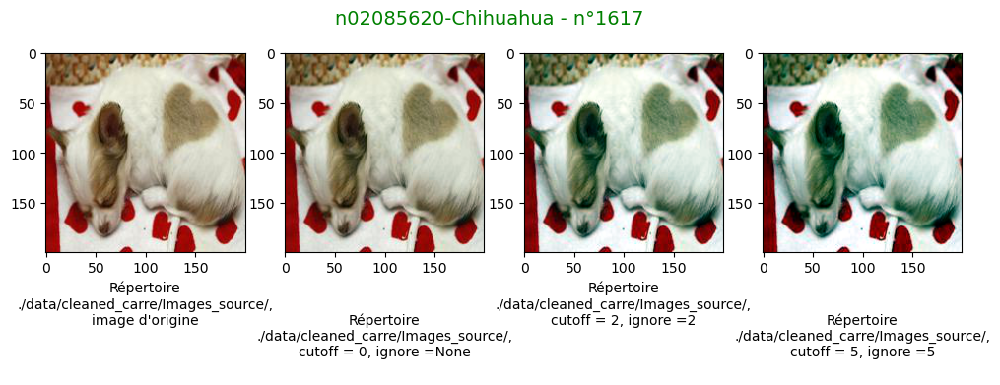

In [311]:
test_luminosite(file_path_in      = folder_source_carre + 'n02085620-Chihuahua/n02085620_1617_carre.jpg',
                titre_in          = 'n02085620-Chihuahua - n°1617',
                xlabel_image_in   = 'Répertoire\n' + folder_source_carre,
                is_histogramme_in = False)

# ==> On prend les hyperparamètres par défaut : cutoff = 0, ignore = None.

image type	= <class 'numpy.ndarray'>
image shape	= (200, 200, 3)
red shape	= (200, 200)
green shape	= (200, 200)
blue shape	= (200, 200)


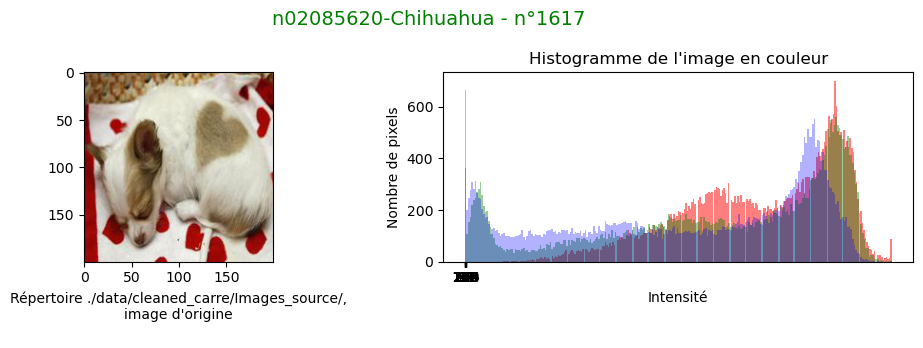

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ cutoff = 0 , ignore = None @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
image type	= <class 'numpy.ndarray'>
image shape	= (200, 200, 3)
red shape	= (200, 200)
green shape	= (200, 200)
blue shape	= (200, 200)


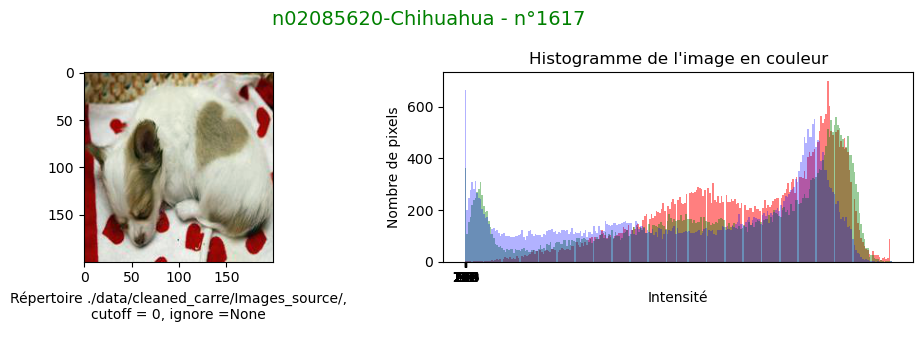




@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ cutoff = 2 , ignore = 2 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
image type	= <class 'numpy.ndarray'>
image shape	= (200, 200, 3)
red shape	= (200, 200)
green shape	= (200, 200)
blue shape	= (200, 200)


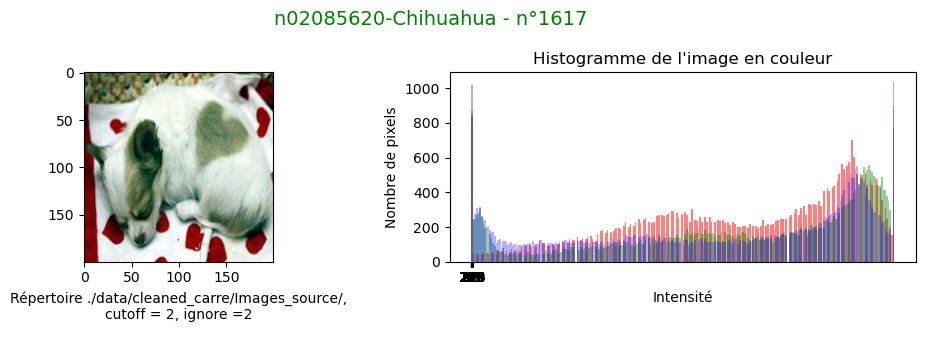




@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ cutoff = 5 , ignore = 5 @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
image type	= <class 'numpy.ndarray'>
image shape	= (200, 200, 3)
red shape	= (200, 200)
green shape	= (200, 200)
blue shape	= (200, 200)


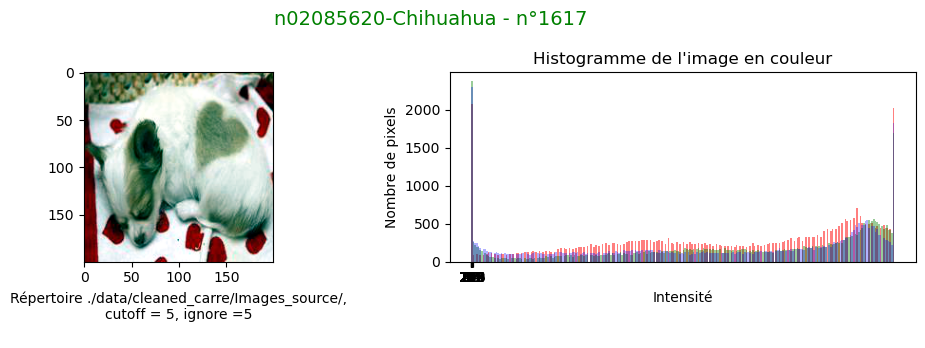

In [313]:
test_luminosite(file_path_in      = folder_source_carre + 'n02085620-Chihuahua/n02085620_1617_carre.jpg',
                titre_in          = 'n02085620-Chihuahua - n°1617',
                xlabel_image_in   = 'Répertoire ' + folder_source_carre,
                is_histogramme_in = True)

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @        n02109525-Saint_Bernard - n°2737          @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [9]:
test_luminosite(file_path_in      = folder_source_rect + 'n02109525-Saint_Bernard/n02109525_2737.jpg',
                titre_in          = 'n02109525-Saint_Bernard - n°2737',
                xlabel_image_in   = 'Répertoire\n' + folder_source_rect,                
                is_histogramme_in = False)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [10]:
test_luminosite(file_path_in      = folder_source_rect + 'n02109525-Saint_Bernard/n02109525_2737.jpg',
                titre_in          = 'n02109525-Saint_Bernard - n°2737',
                xlabel_image_in   = 'Répertoire ' + folder_source_rect,                
                is_histogramme_in = True)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

# 2.2.3. Preprocessing luminosité

In [ ]:
############################################
#         Pour toutes les images           #
############################################

In [318]:
# C_DATASET_CLEANED_CARRE_IMAGES_SOURCE/xxx_subfoldername/xxx_yyy_carre.jpg ---------------> 
# C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE/xxx_subfoldername/xxx_yyy_luminosite.jpg

def preprocessing_luminosite(folder_source_in, folder_target_in, suffixe_in):
    
    count = 0

    for dir_image in os.listdir(folder_source_in):
        # sous-répertoire du folder 'Images'
        path_subfolder_images = folder_source_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
    
        # affichage uniquement des 5 premières lignes
        if (count < 5):    
             print('path_subfolder_images =', path_subfolder_images, '\n')

        for img in liste_images:
            # Création image à partir de image retaillée
            im_origine_name = path_subfolder_images + '/' + img
            im_origine      = Image.open(im_origine_name)
                        
            # Cas images carrées : on enlève les 10 derniers caractères : '_carre.jpg' pour remplacer par '_luminosite.jpg'
            if ('_carre.jpg' in img):
                length_img = len(img) - 10
            # Cas images rectangulaires : on enlève les 4 derniers caractères : '.jpg' pour remplacer par '_luminosite.jpg'
            else:
                length_img = len(img) - 4
        
            # Conversion image RGBA en image RGB (1 seule image / 21281)
            # https://stackoverflow.com/questions/50331463/convert-rgba-to-rgb-in-python
            if (im_origine.mode == 'RGBA'):
                rgba_image = im_origine
                rgb_image  = rgba_image.convert('RGB')
                im_origine = rgb_image
                print(img, ' : conversion RGBA --> RGB')
        
            # Image créée suffixée par luminosité.
            im_luminosite = ImageOps.autocontrast(im_origine, cutoff = 0, ignore = None)
            im_luminosite_name = folder_target_in + dir_image + '/' + img[0:length_img] + suffixe_in
            im_luminosite.save(im_luminosite_name)
            
            # affichage uniquement des 5 premières lignes
            if (count < 5):
                print(im_origine_name, '-' * 30, '>')
                print(im_luminosite_name, '\n')     
            count = count + 1
          
        # affichage uniquement des 5 premières lignes
        if (count < 5):         
            print('\n\n')    
            print('@' * 100)
         
    print('.' * 3)

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @              Images rectangulaires               @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [5]:
preprocessing_luminosite(folder_source_in = folder_source_rect,
                         folder_target_in = folder_target_rect, 
                         suffixe_in       = '_luminosite.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/source/Images/n02085620-Chihuahua 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/cleaned_rect/Images_luminosite/n02085620-Chihuahua/n02085620_10074_luminosite.jpg 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/cleaned_rect/Images_luminosite/n02085620-Chihuahua/n02085620_10131_luminosite.jpg 
#[...]

In [332]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_rect,
                                    folder_target_in      = folder_target_rect,    
                                    suffixe_in            = '_luminosite.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _luminosite.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @                Images carrées                    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [6]:
preprocessing_luminosite(folder_source_in = folder_source_carre,
                         folder_target_in = folder_target_carre, 
                         suffixe_in       = '_luminosite.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_contraste/n02085620-Chihuahua/n02085620_10074_luminosite.jpg 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_contraste/n02085620-Chihuahua/n02085620_10131_luminosite.jpg 
#[...]

In [371]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_carre,
                                    folder_target_in      = folder_target_carre,    
                                    suffixe_in            = '_luminosite.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _luminosite.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @          Images rectangulaires bndbox            @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [7]:
preprocessing_luminosite(folder_source_in = folder_bndbox_source_rect,
                         folder_target_in = folder_bndbox_target_rect, 
                         suffixe_in       = '_luminosite.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_luminosite/n02085620-Chihuahua/n02085620_10074_luminosite.jpg 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_luminosite/n02085620-Chihuahua/n02085620_10131_luminosite.jpg 
#[...]

In [336]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_rect,
                                    folder_target_in      = folder_bndbox_target_rect,    
                                    suffixe_in            = '_luminosite.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _luminosite.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @             Images carrées bndbox                @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [8]:
preprocessing_luminosite(folder_source_in = folder_bndbox_source_carre,
                         folder_target_in = folder_bndbox_target_carre, 
                         suffixe_in       = '_luminosite.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_luminosite/n02085620-Chihuahua/n02085620_10074_luminosite.jpg 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_luminosite/n02085620-Chihuahua/n02085620_10131_luminosite.jpg 
#[...]

In [373]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_carre,
                                    folder_target_in      = folder_bndbox_target_carre,    
                                    suffixe_in            = '_luminosite.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _luminosite.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


# 2.2.4. Affichage % luminosité

In [378]:
def affichage_image_luminosite(folder_source_in, 
                               folder_target_in,
                               folder_number_in,
                               breed_in,
                               dog_number_in):
    
    image_name = folder_number_in + '-' + breed_in + '/' + folder_number_in + '_' + dog_number_in
    
          
    # Maj couleur suivant caractéristiques de l'image
    # Palette couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html    
    # Image carrée  
    if ('carre' in folder_source_in):
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            type_image = 'carrée & bndbox'
            color      = 'red'
        else:
            type_image = 'carrée'
            color      = 'fuchsia'

    # Image rectangulaire
    else:
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            type_image = 'rectangulaire & bndbox'
            color      = 'green'
        else:
            type_image = 'rectangulaire'
            color      = 'dodgerblue'

    
    
    # Affichage d'une image avant et après changement de luminosité pour vérifier
    fig = plt.figure(figsize = (10, 3.3)) # longueur, hauteur
    fig.suptitle(t        =  '[Image ' + type_image + '] : ' + folder_number_in + '-' + breed_in + ' - n°' + dog_number_in,
                 fontsize = 14, 
                 color    = color)
             
    plt.subplot(1, 2, 1)
    # image_name = 'n02085936-Maltese_dog/n02085936_3108.jpg'
    # Cas image source rectangulaire (avec / sans bndbox) : le nom ne contient pas '_carre'
    if ((folder_source_in == C_DATASET_SOURCE_IMAGES) |
        (folder_source_in == C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE)):
        im_origine = Image.open(folder_source_in + image_name + '.jpg')         
    else:
        im_origine = Image.open(folder_source_in + image_name + '_carre.jpg') 
    plt.imshow(im_origine)
    plt.xlabel('Répertoire ' + folder_source_in + ' :\norigine')
    
    plt.subplot(1, 2, 2)
    # image_name = 'n02085936-Maltese_dog/n02085936_3108_luminosite.jpg'
    im_luminosite = Image.open(folder_target_in + image_name + '_luminosite.jpg')
    plt.imshow(im_luminosite)
    plt.xlabel('Répertoire ' + folder_target_in + ' :\nluminosité')

    plt.tight_layout()
    plt.show()
    
    # Saut de ligne pour image suivante
    print('\n')    

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @         n02085936-Maltese_dog - n°3108           @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [2]:
folder_number = 'n02085936'
breed         = 'Maltese_dog'
dog_number    = '3108'

# Image rectangulaire
affichage_image_luminosite(folder_source_in = folder_source_rect, 
                           folder_target_in = folder_target_rect,
                           folder_number_in = folder_number,
                           breed_in         = breed,
                           dog_number_in    = dog_number)

# Image rectangulaire & bndbox
affichage_image_luminosite(folder_source_in = folder_bndbox_source_rect, 
                           folder_target_in = folder_bndbox_target_rect,
                           folder_number_in = folder_number,
                           breed_in         = breed,
                           dog_number_in    = dog_number)

# Image carrée
affichage_image_luminosite(folder_source_in = folder_source_carre, 
                           folder_target_in = folder_target_carre,
                           folder_number_in = folder_number,
                           breed_in         = breed,
                           dog_number_in    = dog_number)

# Image carrée & bndbox
affichage_image_luminosite(folder_source_in = folder_bndbox_source_carre, 
                           folder_target_in = folder_bndbox_target_carre,
                           folder_number_in = folder_number,
                           breed_in         = breed,
                           dog_number_in    = dog_number)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Graphiques & traces supprimées.
# [...]

# 2.3. Contraste

In [495]:
# Maj nom folders
folder_source_rect  = C_DATASET_SOURCE_IMAGES
folder_target_rect  = C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE

folder_source_carre = C_DATASET_CLEANED_CARRE_IMAGES_SOURCE
folder_target_carre = C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_source_rect\t=', folder_source_rect,
      '\n\tfolder_target_rect\t=', folder_target_rect, '\n')

print('>>>>>>> Images carrées (source):'
      '\n\tfolder_source_carre\t=', folder_source_carre,
      '\n\tfolder_target_carre\t=', folder_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_source_rect	= ./data/source/Images/ 
	folder_target_rect	= ./data/cleaned_rect/Images_contraste/ 

>>>>>>> Images carrées (source):
	folder_source_carre	= ./data/cleaned_carre/Images_source/ 
	folder_target_carre	= ./data/cleaned_carre/Images_contraste/


In [496]:
# Maj nom folders bndbox
folder_bndbox_source_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE
folder_bndbox_target_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE

folder_bndbox_source_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE
folder_bndbox_target_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_bndbox_source_rect\t=', folder_bndbox_source_rect,
      '\n\tfolder_bndbox_target_rect\t=', folder_bndbox_target_rect, '\n')

print('>>>>>>> Images carrées (source) :'
      '\n\tfolder_bndbox_source_carre\t=', folder_bndbox_source_carre,
      '\n\tfolder_bndbox_target_carre\t=', folder_bndbox_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_bndbox_source_rect	= ./data/bndbox_cleaned_rect/Images_source/ 
	folder_bndbox_target_rect	= ./data/bndbox_cleaned_rect/Images_contraste/ 

>>>>>>> Images carrées (source) :
	folder_bndbox_source_carre	= ./data/bndbox_cleaned_carre/Images_source/ 
	folder_bndbox_target_carre	= ./data/bndbox_cleaned_carre/Images_contraste/


# 2.3.1. Test contraste

In [ ]:
############################################
#            Pour une image                #
############################################

In [ ]:
#########################################################################
#   Le constraste se corrige grâce à une égalisation de l’histogramme   #
#   (méthode equalize)                                                  #
#########################################################################

In [390]:
def test_contraste(file_path_in, is_histogramme_in, titre_in, xlabel_image_in):
    
    # Image d'origine
    im_origine = Image.open(file_path_in) 
    
    xlabel_image = xlabel_image_in + ',\nimage d\'origine'
    if (is_histogramme_in):        
        # Extraction canaux de couleurs (RGB)
        red_pixels_origine, green_pixels_origine, blue_pixels_origine = \
        process_RGB_channels(file_path_in = file_path_in,
                             image_in     = '')    
    
        # Visualisation histogrammes RGB cumulés
        visualisation_histogrammes_cumules(file_path_in    = file_path_in,
                                           titre_in        = titre_in, 
                                           xlabel_image_in = xlabel_image,                                           
                                           image_in        = '',
                                           red_pixels_in   = red_pixels_origine,
                                           green_pixels_in = green_pixels_origine, 
                                           blue_pixels_in  = blue_pixels_origine)
    else:   
        fig = plt.figure(figsize = (12, 3)) # longueur, hauteur
        fig.suptitle(t = titre_in, fontsize = 14, color = 'green')             
        plt.subplot(1, 3, 1)   
        plt.xlabel(xlabel_image)
        plt.imshow(im_origine)



    # -------------------------------------#
    # Application méthode equalize :       #
    # -------------------------------------#
    # La méthode maximise (normalise) le contraste de l'image. Cette fonction calcule un histogramme de l'image d'entrée, 
    # supprime le pourcentage de coupure des pixels les plus clairs et les plus sombres de l'histogramme et remappe 
    # l'image de sorte que le pixel le plus sombre devienne noir (0) et le plus clair devienne blanc (255).
    # https://www.geeksforgeeks.org/python-imageops-autocontrastmethod/
    # PIL.ImageOps.autocontrast(image, cutoff = 0, ignore = None)
    
    indice = 2
    
    # ------------------------------------------------------- #
    # Méthode 1 : égalise les bandes collectivement           #
    # ------------------------------------------------------- #    
    for mask in [None]: # Valeurs par défaut
        
        # https://pillow.readthedocs.io/en/latest/reference/ImageOps.html#PIL.ImageOps.autocontrast
        im_luminosite = ImageOps.equalize(im_origine, mask = mask)
        xlabel_image  = xlabel_image_in + ',\négalisation collective, mask = ' + str(mask)
        
        if (is_histogramme_in):
            print('@' * 45, 'mask =', mask, '@' * 45)
        
            # Extraction canaux de couleurs (RGB)
            red_pixels_luminosite, green_pixels_luminosite, blue_pixels_luminosite = \
            process_RGB_channels(file_path_in = '',
                                 image_in     = im_luminosite)    
    
            # Visualisation histogrammes RGB cumulés
            visualisation_histogrammes_cumules(file_path_in    = '',
                                               image_in        = im_luminosite,
                                               titre_in        = titre_in, 
                                               xlabel_image_in = xlabel_image,
                                               red_pixels_in   = red_pixels_luminosite,
                                               green_pixels_in = green_pixels_luminosite, 
                                               blue_pixels_in  = blue_pixels_luminosite)
            
            print('\n\n')            
        

        else:
            plt.subplot(1, 3, indice)
            plt.imshow(im_luminosite)
            plt.xlabel(xlabel_image)
            indice = indice + 1
            
        
        
    # ------------------------------------------------------- #
    # Méthode 2 : égalise les bandes individuellement         #
    # ------------------------------------------------------- #
    # https://python.hotexamples.com/examples/PIL/ImageOps/equalize/python-imageops-equalize-method-examples.html
    r, g, b = im_origine.split()
    r          = ImageOps.equalize(r)
    g          = ImageOps.equalize(g)
    b          = ImageOps.equalize(b)
    im_eq      = Image.merge('RGB', (r, g, b))    
    xlabel_image = xlabel_image_in + ',\négalisation individuelle'
        
    if (is_histogramme_in):
        # Extraction canaux de couleurs (RGB)
        red_pixels_luminosite, green_pixels_luminosite, blue_pixels_luminosite = \
        process_RGB_channels(file_path_in = '',
                             image_in     = im_eq)    
            
        # Visualisation histogrammes RGB cumulés
        visualisation_histogrammes_cumules(file_path_in    = '',
                                           image_in        = im_luminosite,
                                           titre_in        = titre_in, 
                                           xlabel_image_in = xlabel_image,
                                           red_pixels_in   = red_pixels_luminosite,
                                           green_pixels_in = green_pixels_luminosite, 
                                           blue_pixels_in  = blue_pixels_luminosite)
            
        print('\n\n')    
        
    else:
        plt.subplot(1, 3, indice)
        plt.imshow(im_eq)
        plt.xlabel(xlabel_image)
        indice = indice + 1        

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @         n02085620-Chihuahua - n°1617             @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

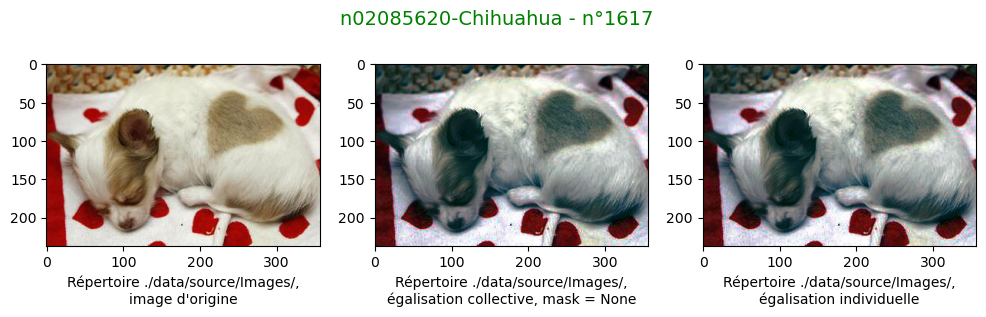

In [391]:
test_contraste(file_path_in      = folder_source_rect + 'n02085620-Chihuahua/n02085620_1617.jpg',
               titre_in          = 'n02085620-Chihuahua - n°1617',
               xlabel_image_in   = 'Répertoire ' + folder_source_rect,
               is_histogramme_in = False)

# ==> On prend la méthode 1 : équalisation collective.

image type	= <class 'numpy.ndarray'>
image shape	= (238, 357, 3)
red shape	= (238, 357)
green shape	= (238, 357)
blue shape	= (238, 357)


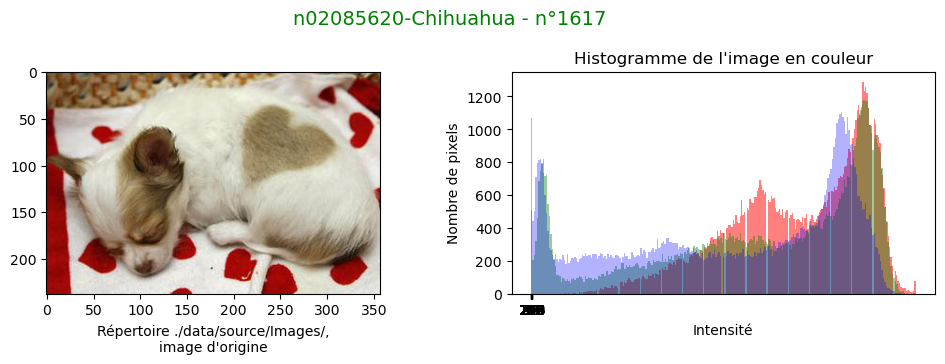

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ mask = None @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
image type	= <class 'numpy.ndarray'>
image shape	= (238, 357, 3)
red shape	= (238, 357)
green shape	= (238, 357)
blue shape	= (238, 357)


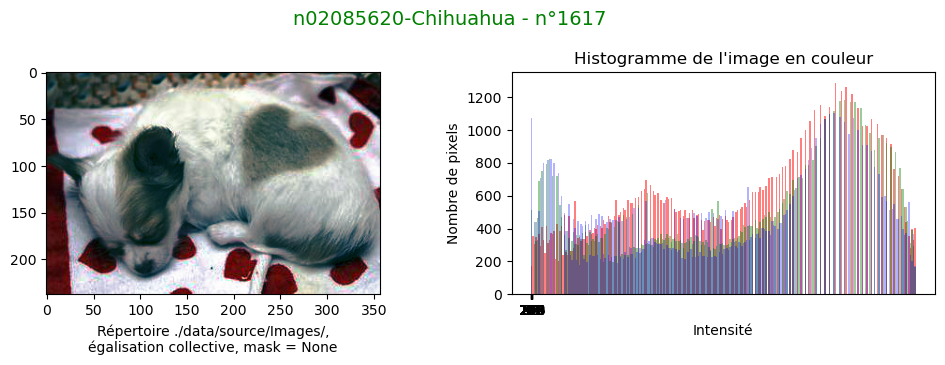




image type	= <class 'numpy.ndarray'>
image shape	= (238, 357, 3)
red shape	= (238, 357)
green shape	= (238, 357)
blue shape	= (238, 357)


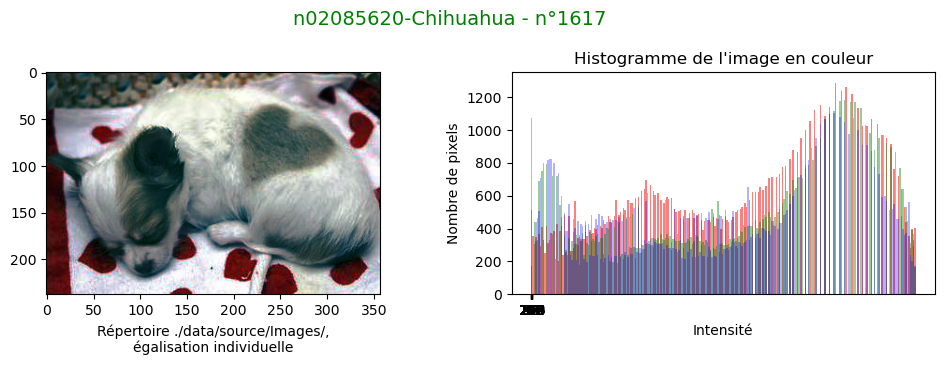

In [392]:
test_contraste(file_path_in      = folder_source_rect + 'n02085620-Chihuahua/n02085620_1617.jpg',
               titre_in          = 'n02085620-Chihuahua - n°1617',
               xlabel_image_in   = 'Répertoire ' + folder_source_rect,
               is_histogramme_in = True)

# 2.3.2. Preprocessing contraste

In [ ]:
############################################
#         Pour toutes les images           #
############################################

In [393]:
# C_DATASET_CLEANED_CARRE_IMAGES_SOURCE/xxx_subfoldername/xxx_yyy_carre.jpg ---------------> 
# C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE/xxx_subfoldername/xxx_yyy_contraste.jpg

def preprocessing_contraste(folder_source_in, folder_target_in, suffixe_in):
    
    count = 0

    for dir_image in os.listdir(folder_source_in):
        # sous-répertoire du folder 'Images'
        path_subfolder_images = folder_source_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
    
        # affichage uniquement des 5 premières lignes
        if (count < 5):     
            print('path_subfolder_images =', path_subfolder_images, '\n')

        for img in liste_images:
            # Création image à partir de image retaillée   
            im_origine_name = path_subfolder_images + '/' + img
            im_origine = Image.open(im_origine_name)    
            
            # Cas images carrées : on enlève les 10 derniers caractères : '_carre.jpg' pour remplacer par '_contraste.jpg'
            if ('_carre.jpg' in img):
                length_img = len(img) - 10
            # Cas images rectangulaires : on enlève les 4 derniers caractères : '.jpg' pour remplacer par '_contraste.jpg'
            else:
                length_img = len(img) - 4

                
            # Conversion image RGBA en image RGB (1 seule image / 21281)
            # https://stackoverflow.com/questions/50331463/convert-rgba-to-rgb-in-python
            if (im_origine.mode == 'RGBA'):
                rgba_image = im_origine
                rgb_image  = rgba_image.convert('RGB')
                im_origine = rgb_image
                print(img, ' : conversion RGBA --> RGB')
        
            # Image créée suffixée par contraste.
            im_contraste = ImageOps.equalize(im_origine, mask = None)
            
                
            im_contraste_name = folder_target_in + dir_image + '/' + img[0:length_img] + suffixe_in
            im_contraste.save(im_contraste_name)
            
            # affichage uniquement des 5 premières lignes
            if (count < 5):
                print(im_origine_name, '-' * 30, '>')
                print(im_contraste_name, '\n')     
            count = count + 1
        
        # affichage uniquement des 5 premières lignes
        if (count < 5):         
            print('\n\n')    
            print('@' * 100) 
        
    print('.' * 3)        

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @             Images rectangulaires                @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [9]:
preprocessing_contraste(folder_source_in = folder_source_rect,
                        folder_target_in = folder_target_rect,
                        suffixe_in       = '_contraste.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/source/Images/n02085620-Chihuahua 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/cleaned_rect/Images_contraste/n02085620-Chihuahua/n02085620_10074_contraste.jpg 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/cleaned_rect/Images_contraste/n02085620-Chihuahua/n02085620_10131_contraste.jpg 
#[...]

In [497]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_rect,
                                    folder_target_in      = folder_target_rect,
                                    suffixe_in            = '_contraste.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _contraste.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @                Images carrées                    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [10]:
preprocessing_contraste(folder_source_in = folder_source_carre,
                        folder_target_in = folder_target_carre,
                        suffixe_in       = '_contraste.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_contraste/n02085620-Chihuahua/n02085620_10074_contraste.jpg 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_contraste/n02085620-Chihuahua/n02085620_10131_contraste.jpg 
#[...]

In [397]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_carre,
                                    folder_target_in      = folder_target_carre,
                                    suffixe_in            = '_contraste.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _contraste.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @           Images rectangulaires bndbox           @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [11]:
preprocessing_contraste(folder_source_in = folder_bndbox_source_rect,
                        folder_target_in = folder_bndbox_target_rect,
                        suffixe_in       = '_contraste.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_contraste/n02085620-Chihuahua/n02085620_10074_contraste.jpg 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_contraste/n02085620-Chihuahua/n02085620_10131_contraste.jpg 
#[...]

In [399]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_rect,
                                    folder_target_in      = folder_bndbox_target_rect,
                                    suffixe_in            = '_contraste.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _contraste.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @            Images carrées bndbox                 @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [12]:
preprocessing_contraste(folder_source_in = folder_bndbox_source_carre,
                        folder_target_in = folder_bndbox_target_carre,
                        suffixe_in       = '_contraste.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_contraste/n02085620-Chihuahua/n02085620_10074_contraste.jpg 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_contraste/n02085620-Chihuahua/n02085620_10131_contraste.jpg 
#[...]

In [500]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_carre,
                                    folder_target_in      = folder_bndbox_target_carre,
                                    suffixe_in            = '_contraste.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _contraste.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


# 2.3.3. Affichage % contraste

In [441]:
def affichage_image_contraste(folder_source_in, 
                              folder_target_in,
                              folder_number_in,
                              breed_in,
                              dog_number_in):
    
    image_name = folder_number_in + '-' + breed_in + '/' + folder_number_in + '_' + dog_number_in

    # Maj couleur suivant caractéristiques de l'image
    # Palette couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html    
    # Image carrée  
    if ('carre' in folder_source_in):
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            folder_luminosite = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE
            type_image        = 'carrée & bndbox'
            color             = 'red'
        else:
            folder_luminosite = C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE 
            type_image        = 'carrée'
            color             = 'fuchsia'

    # Image rectangulaire
    else:
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            folder_luminosite = C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE
            type_image        = 'rectangulaire & bndbox'
            color             = 'green'
           
        else:
            folder_luminosite = C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE
            type_image        = 'rectangulaire'
            color             = 'dodgerblue'


            
    # Affichage d'une image avant et après changement de luminosité pour vérifier
    fig = plt.figure(figsize = (11, 3.5)) # longueur, hauteur
    fig.suptitle(t        =  '[Image ' + type_image + '] : ' + folder_number_in + '-' + breed_in + ' - n°' + dog_number_in,
                 fontsize = 14, 
                 color    = color)
             
    plt.subplot(1, 3, 1)
    # image_name = 'n02086646-Blenheim_spaniel/n02086646_326.jpg'
    # Cas image source rectangulaire (avec / sans bndbox) : le nom ne contient pas '_carre'
    if ((folder_source_in == C_DATASET_SOURCE_IMAGES) |
        (folder_source_in == C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE)):
        im_origine = Image.open(folder_source_in + image_name + '.jpg')         
    else:
        im_origine = Image.open(folder_source_in + image_name + '_carre.jpg') 
    plt.imshow(im_origine)
    plt.xlabel('Répertoire\n' + folder_source_in + ' :\norigine')
    
    plt.subplot(1, 3, 2)
    # image_name = 'n02086646-Blenheim_spaniel/n02086646_326_luminosite.jpg'
    im_luminosite = Image.open(folder_luminosite + image_name + '_luminosite.jpg')
    plt.imshow(im_luminosite)
    plt.xlabel('Répertoire\n' + folder_luminosite + ' :\nluminosité')
    
    plt.subplot(1, 3, 3)
    # image_name = 'n02086646-Blenheim_spaniel/n02086646_326_contraste.jpg'
    im_contraste = Image.open(folder_target_in + image_name + '_contraste.jpg')
    plt.imshow(im_contraste)
    plt.xlabel('Répertoire\n' + folder_target_in + ' :\ncontraste')    

    plt.tight_layout()
    plt.show()
    
    # Saut de ligne pour image suivante
    print('\n')    

In [415]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @         n02086646-Blenheim_spaniel - n°2959      @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

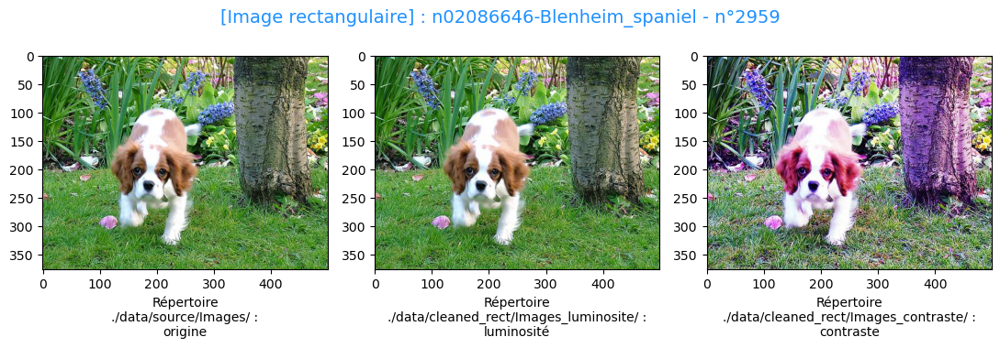

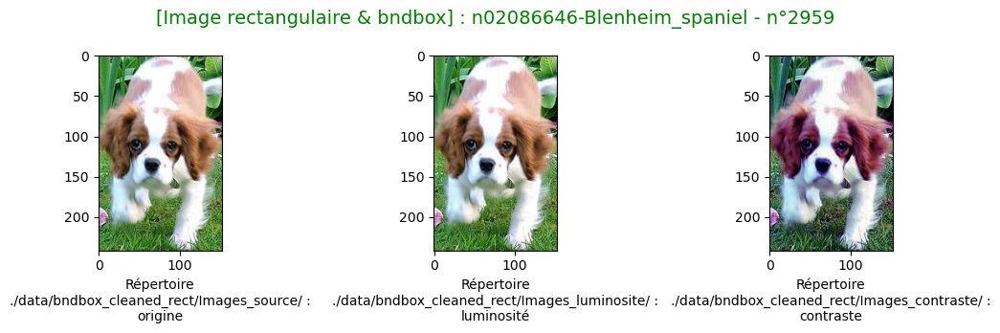

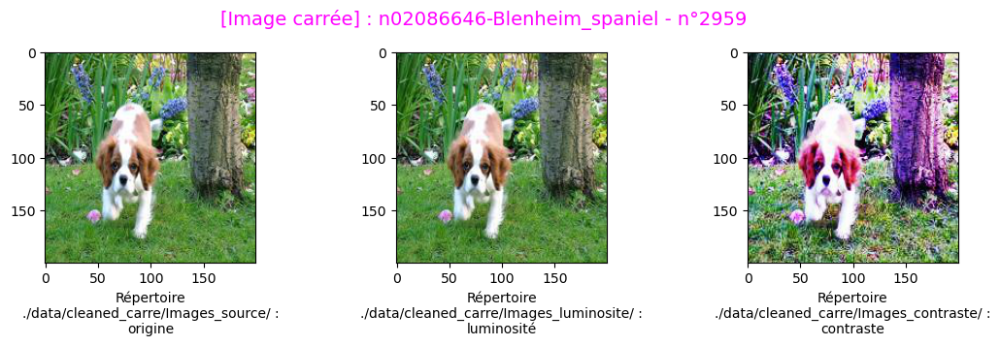

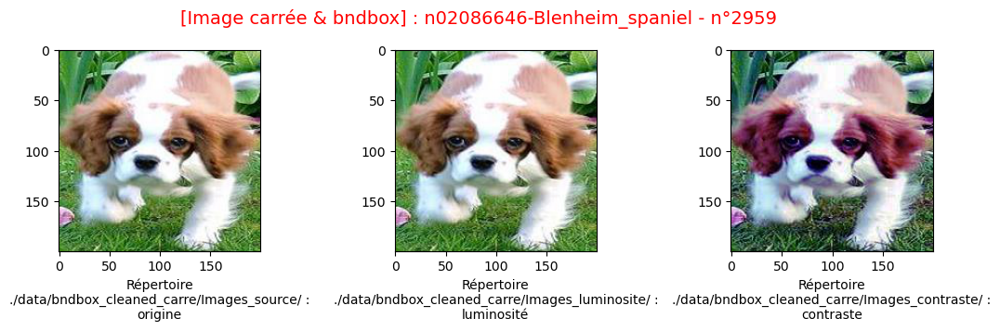

In [442]:
folder_number = 'n02086646'
breed         = 'Blenheim_spaniel'
dog_number    = '2959'

# Image rectangulaire
affichage_image_contraste(folder_source_in = folder_source_rect, 
                          folder_target_in = folder_target_rect,
                          folder_number_in = folder_number,
                          breed_in         = breed,
                          dog_number_in    = dog_number)

# Image rectangulaire & bndbox
affichage_image_contraste(folder_source_in = folder_bndbox_source_rect, 
                          folder_target_in = folder_bndbox_target_rect,
                          folder_number_in = folder_number,
                          breed_in         = breed,
                          dog_number_in    = dog_number)

# Image carrée
affichage_image_contraste(folder_source_in = folder_source_carre, 
                          folder_target_in = folder_target_carre,
                          folder_number_in = folder_number,
                          breed_in         = breed,
                          dog_number_in    = dog_number)

# Image carrée & bndbox
affichage_image_contraste(folder_source_in = folder_bndbox_source_carre, 
                          folder_target_in = folder_bndbox_target_carre,
                          folder_number_in = folder_number,
                          breed_in         = breed,
                          dog_number_in    = dog_number)

# 2.4. Rotation

In [443]:
# Maj nom folders
folder_source_rect  = C_DATASET_SOURCE_IMAGES
folder_target_rect  = C_DATASET_CLEANED_RECT_IMAGES_ROTATION_45

folder_source_carre = C_DATASET_CLEANED_CARRE_IMAGES_SOURCE
folder_target_carre = C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_source_rect\t=', folder_source_rect,
      '\n\tfolder_target_rect\t=', folder_target_rect, '\n')

print('>>>>>>> Images carrées (sources) :'
      '\n\tfolder_source_carre\t=', folder_source_carre,
      '\n\tfolder_target_carre\t=', folder_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_source_rect	= ./data/source/Images/ 
	folder_target_rect	= ./data/cleaned_rect/Images_rotation_45/ 

>>>>>>> Images carrées (sources) :
	folder_source_carre	= ./data/cleaned_carre/Images_source/ 
	folder_target_carre	= ./data/cleaned_carre/Images_rotation_45/


In [444]:
# Maj nom folders bndbox
folder_bndbox_source_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE
folder_bndbox_target_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_ROTATION_45

folder_bndbox_source_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE
folder_bndbox_target_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_ROTATION_45

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_bndbox_source_rect\t=', folder_bndbox_source_rect,
      '\n\tfolder_bndbox_target_rect\t=', folder_bndbox_target_rect, '\n')

print('>>>>>>> Images carrées (source) :'
      '\n\tfolder_bndbox_source_carre\t=', folder_bndbox_source_carre,
      '\n\tfolder_bndbox_target_carre\t=', folder_bndbox_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_bndbox_source_rect	= ./data/bndbox_cleaned_rect/Images_source/ 
	folder_bndbox_target_rect	= ./data/bndbox_cleaned_rect/Images_rotation_45/ 

>>>>>>> Images carrées (source) :
	folder_bndbox_source_carre	= ./data/bndbox_cleaned_carre/Images_source/ 
	folder_bndbox_target_carre	= ./data/bndbox_cleaned_carre/Images_rotation_45/


# 2.4.1. Test rotation

In [ ]:
############################################
#            Pour une image                #
############################################

In [428]:
def test_rotation(file_path_in, titre_in, xlabel_image_in):
    
    # Image d'origine
    im_origine = Image.open(file_path_in) 
    
    xlabel_image = xlabel_image_in + ',\nimage d\'origine' 
    fig = plt.figure(figsize = (12, 3)) # longueur, hauteur
    fig.suptitle(t = titre_in, fontsize = 14, color = 'green')             
    plt.subplot(1, 4, 1)   
    plt.xlabel(xlabel_image)
    plt.imshow(im_origine)



    # -------------------------------------#
    # Application méthode rotate :         #
    # -------------------------------------#
    indice = 2
    
    # Essai avec 3 jeux d'hyperparamètres
    for angle in [45, 90, 180]:        

        im_rotation = im_origine.rotate(angle = angle, expand = True)   
        xlabel_image  = xlabel_image_in + ',\nangle = ' + str(angle)     
        
        plt.subplot(1, 4, indice)
        plt.imshow(im_rotation)
        # Ajout retour chariot pour espacer les légendes des images
        if ((indice == 2) | (indice == 4)):
            xlabel_image = '\n\n' + xlabel_image        
        plt.xlabel(xlabel_image)
        indice = indice + 1

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @           n02086910-papillon - n°4330            @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

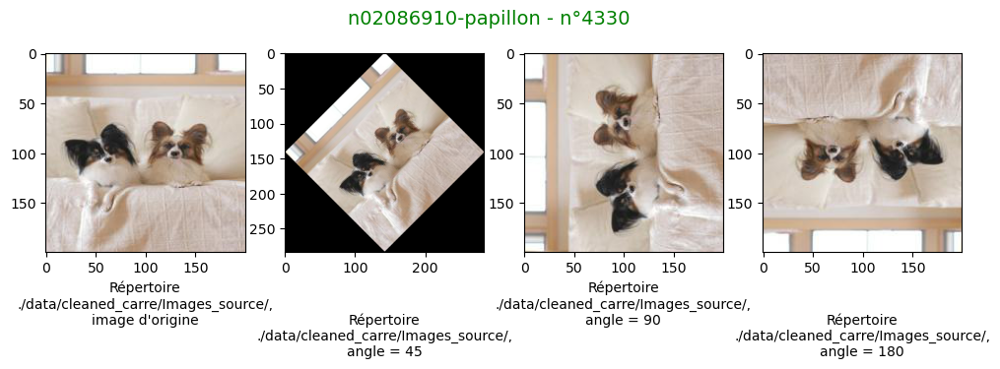

In [429]:
test_rotation(file_path_in      = folder_source_carre + 'n02086910-papillon/n02086910_4330_carre.jpg',
              titre_in          = 'n02086910-papillon - n°4330',
              xlabel_image_in   = 'Répertoire\n' + folder_source_carre)

# 2.4.2. Preprocessing rotation

In [ ]:
############################################
#         Pour toutes les images           #
############################################

In [430]:
# C_DATASET_CLEANED_CARRE_IMAGES_SOURCE/xxx_subfoldername/xxx_yyy_carre.jpg ---------------> 
# C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45/xxx_subfoldername/xxx_yyy_rotation_45.jpg

def preprocessing_rotation(folder_source_in, folder_target_in, suffixe_in):
    
    count = 0

    for dir_image in os.listdir(folder_source_in):
        # sous-répertoire du folder 'Images'
        path_subfolder_images = folder_source_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
    
        # affichage uniquement des 5 premières lignes
        if (count < 5):     
            print('path_subfolder_images =', path_subfolder_images, '\n')

        for img in liste_images:
            # Création image à partir de image retaillée      
            im_origine_name = path_subfolder_images + '/' + img
            im_origine      = Image.open(im_origine_name)            
            
            # Cas images carrées : on enlève les 10 derniers caractères : '_carre.jpg' pour remplacer par '_rotation_xx.jpg'
            if ('_carre.jpg' in img):
                length_img = len(img) - 10
            # Cas images rectangulaires : on enlève les 4 derniers caractères : '.jpg' pour remplacer par '_rotation_xx.jpg'
            else:
                length_img = len(img) - 4

        
            # Conversion image RGBA en image RGB (1 seule image / 21281)
            # https://stackoverflow.com/questions/50331463/convert-rgba-to-rgb-in-python
            if (im_origine.mode == 'RGBA'):
                rgba_image = im_origine
                rgb_image  = rgba_image.convert('RGB')
                im_origine = rgb_image
                print(img, ' : conversion RGBA --> RGB')
        
            # Image créée suffixée par rotation_45 pour angle à 45 degré et rotation_90 pour angle à 90 degrés.
            # Remarque : l'interpolation bilinéaire donne une image de meilleure qualité que l'interpolation au plus proche voisin.
            # https://www.pythonpool.com/python-rotate-image/
            #  > expand (optional) : True ---> the images expand and become large enough to hold the entire rotated image. 
            #                      : False --> the output image is of the same size as of input image.
            #  > resample (optional) : PIL.Image.NEAREST (use the nearest neighbor), 
            #                        : PIL.Image.BILINEAR (linear interpolation in a 2×2 environment), 
            #                        : PIL.Image.BICUBIC (cubic spline interpolation in a 4×4 environment).
            im_rotation_45 = im_origine.rotate(angle = 45, expand = True)        

            # On enlève les 10 derniers caractères : '_carre.jpg' pour remplacer par '_rotation_xx.jpg'            
            im_rotation_name_45 = folder_target_in + dir_image + '/' + img[0:length_img] + suffixe_in
            im_rotation_45.save(im_rotation_name_45)
            
            # affichage uniquement des 5 premières lignes
            if (count < 5):
                print(im_origine_name, '-' * 30, '>')
                print(im_rotation_name_45, '\n')     
            count = count + 1
           
        # affichage uniquement des 5 premières lignes
        if (count < 5):         
            print('\n\n')    
            print('@' * 100)
        
    print('.' * 3)    

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @              Images rectangulaires               @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [13]:
preprocessing_rotation(folder_source_in = folder_source_rect,
                       folder_target_in = folder_target_rect, 
                       suffixe_in       = '_rotation_45.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/source/Images/n02085620-Chihuahua 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/cleaned_rect/Images_rotation_45/n02085620-Chihuahua/n02085620_10074_rotation_45.jpg 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/cleaned_rect/Images_rotation_45/n02085620-Chihuahua/n02085620_10131_rotation_45.jpg 
#[...]

In [432]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_rect,
                                    folder_target_in      = folder_target_rect,
                                    suffixe_in            = '_rotation_45.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _rotation_45.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @                Images carrées                    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [14]:
preprocessing_rotation(folder_source_in = folder_source_carre,
                       folder_target_in = folder_target_carre, 
                       suffixe_in       = '_rotation_45.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_rotation_45/n02085620-Chihuahua/n02085620_10074_rotation_45.jpg 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_rotation_45/n02085620-Chihuahua/n02085620_10131_rotation_45.jpg 
#[...]

In [434]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_carre,
                                    folder_target_in      = folder_target_carre,
                                    suffixe_in            = '_rotation_45.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _rotation_45.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @           Images rectangulaires bndbox           @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [15]:
preprocessing_rotation(folder_source_in = folder_bndbox_source_rect,
                       folder_target_in = folder_bndbox_target_rect, 
                       suffixe_in       = '_rotation_45.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_rotation_45/n02085620-Chihuahua/n02085620_10074_rotation_45.jpg 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_rotation_45/n02085620-Chihuahua/n02085620_10131_rotation_45.jpg 
#[...]

In [436]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_rect,
                                    folder_target_in      = folder_bndbox_target_rect,
                                    suffixe_in            = '_rotation_45.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _rotation_45.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @              Images carrées bndbox               @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [16]:
preprocessing_rotation(folder_source_in = folder_bndbox_source_carre,
                       folder_target_in = folder_bndbox_target_carre, 
                       suffixe_in       = '_rotation_45.jpg')

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_rotation_45/n02085620-Chihuahua/n02085620_10074_rotation_45.jpg 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_rotation_45/n02085620-Chihuahua/n02085620_10131_rotation_45.jpg 
#[...]

In [445]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_carre,
                                    folder_target_in      = folder_bndbox_target_carre,
                                    suffixe_in            = '_rotation_45.jpg',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _rotation_45.jpg : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


# 2.4.3. Affichage % rotation

In [458]:
def affichage_image_rotation(folder_source_in, 
                             folder_target_in,
                             folder_number_in,
                             breed_in,
                             dog_number_in):
    
    image_name = folder_number_in + '-' + breed_in + '/' + folder_number_in + '_' + dog_number_in

    # Maj couleur suivant caractéristiques de l'image
    # Palette couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html    
    # Image carrée  
    if ('carre' in folder_source_in):
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            folder_luminosite = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE
            folder_contraste  = C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE
            type_image        = 'carrée & bndbox'
            color             = 'red'
        else:
            folder_luminosite = C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE 
            folder_contraste  = C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE
            type_image        = 'carrée'
            color             = 'fuchsia'

    # Image rectangulaire
    else:
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            folder_luminosite = C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE
            folder_contraste  = C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE
            type_image        = 'rectangulaire & bndbox'
            color             = 'green'
           
        else:
            folder_luminosite = C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE
            folder_contraste  = C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE
            type_image        = 'rectangulaire'
            color             = 'dodgerblue'

            
    
    # Affichage d'une image avant et après changement de luminosité pour vérifier
    fig = plt.figure(figsize = (12.5, 3.5)) # longueur, hauteur
    fig.suptitle(t        =  '[Image ' + type_image + '] : ' + folder_number_in + '-' + breed_in + ' - n°' + dog_number_in,
                 fontsize = 14, 
                 color    = color)
             
    plt.subplot(1, 4, 1)
    # image_name = 'n02099601-golden_retriever/n02099601_67_carre.jpg'
    if ((folder_source_in == C_DATASET_SOURCE_IMAGES) |
        (folder_source_in == C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE)):
        im_origine = Image.open(folder_source_in + image_name + '.jpg')         
    else:
        im_origine = Image.open(folder_source_in + image_name + '_carre.jpg') 
    plt.imshow(im_origine)
    plt.xlabel('Répertoire\n' + folder_source_in + ' :\norigine')
    
    plt.subplot(1, 4, 2)
    # image_name = 'n02099601-golden_retriever/n02099601_67_luminosite.jpg'
    im_luminosite = Image.open(folder_luminosite + image_name + '_luminosite.jpg')
    plt.imshow(im_luminosite)
    plt.xlabel('\n\nRépertoire\n' + folder_luminosite + ' :\nluminosité')
    
    plt.subplot(1, 4, 3)
    # image_name = 'n02099601-golden_retriever/n02099601_67_contraste.jpg'
    im_contraste = Image.open(folder_contraste + image_name + '_contraste.jpg')
    plt.imshow(im_contraste)
    plt.xlabel('Répertoire\n' + folder_contraste + ' :\ncontraste')
    
    plt.subplot(1, 4, 4)
    # image_name = 'n02099601-golden_retriever/n02099601_67_rotation_45.jpg'
    im_rotation_45 = Image.open(folder_target_in + image_name + '_rotation_45.jpg')
    plt.imshow(im_rotation_45)
    plt.xlabel('\n\nRépertoire\n' + folder_target_in + ' :\nrotation 45 degrés')        

    plt.tight_layout()
    plt.show()
    
    # Saut de ligne pour image suivante
    print('\n')    

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @           n02107908-Appenzeller - n°4895         @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [27]:
folder_number = 'n02107908'
breed         = 'Appenzeller'
dog_number    = '4895'

# Image rectangulaire
affichage_image_rotation(folder_source_in = folder_source_rect, 
                         folder_target_in = folder_target_rect,
                         folder_number_in = folder_number,
                         breed_in         = breed,
                         dog_number_in    = dog_number)

# Image rectangulaire & bndbox
affichage_image_rotation(folder_source_in = folder_bndbox_source_rect, 
                         folder_target_in = folder_bndbox_target_rect,
                         folder_number_in = folder_number,
                         breed_in         = breed,
                         dog_number_in    = dog_number)

# Image carrée
affichage_image_rotation(folder_source_in = folder_source_carre, 
                         folder_target_in = folder_target_carre,
                         folder_number_in = folder_number,
                         breed_in         = breed,
                         dog_number_in    = dog_number)

# Image carrée & bndbox
affichage_image_rotation(folder_source_in = folder_bndbox_source_carre, 
                         folder_target_in = folder_bndbox_target_carre,
                         folder_number_in = folder_number,
                         breed_in         = breed,
                         dog_number_in    = dog_number)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Graphiques & traces supprimées.
# [...]

# 2.5. Bruit

In [479]:
# Maj nom folders
folder_source_rect  = C_DATASET_SOURCE_IMAGES
folder_target_rect  = C_DATASET_CLEANED_RECT_IMAGES_BRUIT

folder_source_carre = C_DATASET_CLEANED_CARRE_IMAGES_SOURCE
folder_target_carre = C_DATASET_CLEANED_CARRE_IMAGES_BRUIT

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_source_rect\t=', folder_source_rect,
      '\n\tfolder_target_rect\t=', folder_target_rect, '\n')

print('>>>>>>> Images carrées (source) :'
      '\n\tfolder_source_carre\t=', folder_source_carre,
      '\n\tfolder_target_carre\t=', folder_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_source_rect	= ./data/source/Images/ 
	folder_target_rect	= ./data/cleaned_rect/Images_bruit/ 

>>>>>>> Images carrées (source) :
	folder_source_carre	= ./data/cleaned_carre/Images_source/ 
	folder_target_carre	= ./data/cleaned_carre/Images_bruit/


In [480]:
# Maj nom folders bndbox
folder_bndbox_source_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE
folder_bndbox_target_rect  = C_BNDBOX_CLEANED_RECT_IMAGES_BRUIT

folder_bndbox_source_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE
folder_bndbox_target_carre = C_BNDBOX_CLEANED_CARRE_IMAGES_BRUIT

print('>>>>>>> Images rectangulaires (source) :'
      '\n\tfolder_bndbox_source_rect\t=', folder_bndbox_source_rect,
      '\n\tfolder_bndbox_target_rect\t=', folder_bndbox_target_rect, '\n')

print('>>>>>>> Images carrées (source) :'
      '\n\tfolder_bndbox_source_carre\t=', folder_bndbox_source_carre,
      '\n\tfolder_bndbox_target_carre\t=', folder_bndbox_target_carre)

>>>>>>> Images rectangulaires (source) :
	folder_bndbox_source_rect	= ./data/bndbox_cleaned_rect/Images_source/ 
	folder_bndbox_target_rect	= ./data/bndbox_cleaned_rect/Images_bruit/ 

>>>>>>> Images carrées (source) :
	folder_bndbox_source_carre	= ./data/bndbox_cleaned_carre/Images_source/ 
	folder_bndbox_target_carre	= ./data/bndbox_cleaned_carre/Images_bruit/


# 2.5.1. Test bruit

In [ ]:
############################################
#            Pour une image                #
############################################

In [474]:
def test_bruit(file_path_in, titre_in, xlabel_image_in):
    
    # Image d'origine
    im_origine = Image.open(file_path_in) 
    
    xlabel_image = xlabel_image_in + ',\nimage d\'origine'
    fig = plt.figure(figsize = (13, 3)) # longueur, hauteur
    fig.suptitle(t = titre_in, fontsize = 14, color = 'green')             
    plt.subplot(1, 4, 1)   
    plt.xlabel(xlabel_image)
    plt.imshow(im_origine)



    # -------------------------------------#
    # Application méthode autocontraste :  #
    # -------------------------------------#
    # La méthode maximise (normalise) le contraste de l'image. Cette fonction calcule un histogramme de l'image d'entrée, 
    # supprime le pourcentage de coupure des pixels les plus clairs et les plus sombres de l'histogramme et remappe 
    # l'image de sorte que le pixel le plus sombre devienne noir (0) et le plus clair devienne blanc (255).
    # https://www.geeksforgeeks.org/python-imageops-autocontrastmethod/
    # PIL.ImageOps.autocontrast(image, cutoff = 0, ignore = None)
    
    indice = 2
    
    # Essai avec 3 jeux d'hyperparamètres
    # https://www.geeksforgeeks.org/python-pil-boxblur-method/
    # radius : Size of the box in one direction :
    #   > Radius 0 does not blur, returns an identical image. 
    #   > Radius 1 takes 1 pixel in each direction, i.e. 9 pixels in total.    
    for radius in [1, 2, 3]:
        
        im_bruit = im_origine.filter(ImageFilter.BoxBlur(radius))
        
        xlabel_image  = xlabel_image_in + ',\nradius = ' + str(radius)        
        plt.subplot(1, 4, indice)
        plt.imshow(im_bruit)
        plt.xlabel(xlabel_image)
        indice = indice + 1

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @           n02091831-Saluki - n°3616              @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

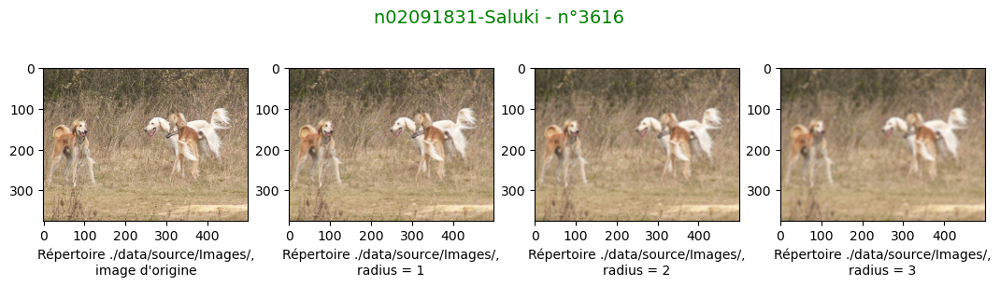

In [475]:
test_bruit(file_path_in    = folder_source_rect + 'n02091831-Saluki/n02091831_3616.jpg',
           titre_in        = 'n02091831-Saluki - n°3616',
           xlabel_image_in = 'Répertoire ' + folder_source_rect)

# 2.5.2. Preprocessing bruit

In [ ]:
############################################
#         Pour toutes les images           #
############################################

In [477]:
# C_DATASET_CLEANED_CARRE_IMAGES_SOURCE/xxx_subfoldername/xxx_yyy_carre.jpg ---------------> 
# C_DATASET_CLEANED_CARRE_IMAGES_BRUIT/xxx_subfoldername/xxx_yyy_bruit.jpg

def preprocessing_bruit(folder_source_in, folder_target_in, suffixe_in):
    
    radius = 1
    count  = 0

    for dir_image in os.listdir(folder_source_in):
        # sous-répertoire du folder 'Images'
        path_subfolder_images = folder_source_in + dir_image
        liste_images = os.listdir(path_subfolder_images)
    
        # affichage uniquement des 5 premières lignes
        if (count < 5):     
            print('path_subfolder_images =', path_subfolder_images, '\n')

        for img in liste_images:
            # Création image à partir de image retaillée  
            im_origine_name = path_subfolder_images + '/' + img
            im_origine      = Image.open(im_origine_name)            
            
            # Cas images carrées : on enlève les 10 derniers caractères : '_carre.jpg' pour remplacer par '_bruit.jpg'            
            if ('_carre.jpg' in img):
                length_img = len(img) - 10
            # Cas images rectangulaires : on enlève les 4 derniers caractères : '.jpg' pour remplacer par '_bruit.jpg'
            else:
                length_img = len(img) - 4     
            
        
            # Conversion image RGBA en image RGB (1 seule image / 21281)
            # https://stackoverflow.com/questions/50331463/convert-rgba-to-rgb-in-python
            if (im_origine.mode == 'RGBA'):
                rgba_image = im_origine
                rgb_image  = rgba_image.convert('RGB')
                im_origine = rgb_image
                print(img, ' : conversion RGBA --> RGB')
        
            # Image créée suffixée par bruit.
            # https://www.geeksforgeeks.org/python-pil-boxblur-method/
            im_bruit = im_origine.filter(ImageFilter.BoxBlur(radius))

            # On enlève les 10 derniers caractères : '_carre.jpg' pour remplacer par '_bruit.jpg'
            im_bruit_name = folder_target_in + dir_image + '/' + img[0:length_img] + suffixe_in
            im_bruit.save(im_bruit_name)
            
            # affichage uniquement des 5 premières lignes
            if (count < 5):
                print(im_origine_name, '-' * 30, '>')
                print(im_bruit_name, '\n')     
            count = count + 1
        
        # affichage uniquement des 5 premières lignes
        if (count < 5):         
            print('\n\n')    
            print('@' * 100)
        
    print('.' * 3)

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @                Images rectangulaires             @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [17]:
preprocessing_bruit(folder_source_in = folder_source_rect,
                    folder_target_in = folder_target_rect,
                    suffixe_in       = '_bruit.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/source/Images/n02085620-Chihuahua 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/cleaned_rect/Images_bruit/n02085620-Chihuahua/n02085620_10074_bruit.jpg 
#
#./data/source/Images/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/cleaned_rect/Images_bruit/n02085620-Chihuahua/n02085620_10131_bruit.jpg 
#[...]

In [482]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_rect,
                                    folder_target_in      = folder_target_rect,
                                    suffixe_in            = '_bruit',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _bruit : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @                Images carrées                    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [18]:
preprocessing_bruit(folder_source_in = folder_source_carre,
                    folder_target_in = folder_target_carre,
                    suffixe_in       = '_bruit.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_bruit/n02085620-Chihuahua/n02085620_10074_bruit.jpg 
#
#./data/cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/cleaned_carre/Images_bruit/n02085620-Chihuahua/n02085620_10131_bruit.jpg 
#[...]

In [484]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_source_carre,
                                    folder_target_in      = folder_target_carre,
                                    suffixe_in            = '_bruit',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _bruit : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @           Images rectangulaires bndbox           @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [19]:
preprocessing_bruit(folder_source_in = folder_bndbox_source_rect,
                    folder_target_in = folder_bndbox_target_rect,
                    suffixe_in       = '_bruit.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10074.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_bruit/n02085620-Chihuahua/n02085620_10074_bruit.jpg 
#
#./data/bndbox_cleaned_rect/Images_source/n02085620-Chihuahua/n02085620_10131.jpg ------------------------------ >
#./data/bndbox_cleaned_rect/Images_bruit/n02085620-Chihuahua/n02085620_10131_bruit.jpg 
#[...]

In [486]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_rect,
                                    folder_target_in      = folder_bndbox_target_rect,
                                    suffixe_in            = '_bruit',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _bruit : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @                Images carrées                    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [20]:
preprocessing_bruit(folder_source_in = folder_bndbox_source_carre,
                    folder_target_in = folder_bndbox_target_carre,
                    suffixe_in       = '_bruit.jpg')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
#path_subfolder_images = ./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10074_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_bruit/n02085620-Chihuahua/n02085620_10074_bruit.jpg 
#
#./data/bndbox_cleaned_carre/Images_source/n02085620-Chihuahua/n02085620_10131_carre.jpg ------------------------------ >
#./data/bndbox_cleaned_carre/Images_bruit/n02085620-Chihuahua/n02085620_10131_bruit.jpg
#[...]

In [488]:
# Verification du nombre d'images avec suffixe % celle d'origine
verification_nb_images_avec_suffixe(folder_source_in      = folder_bndbox_source_carre,
                                    folder_target_in      = folder_bndbox_target_carre,
                                    suffixe_in            = '_bruit',
                                    afficher_subfolder_in = False)

 :-) ==> source % suffixe _bruit : TOUS LES FOLDERS ONT UN NOMBRE DE FICHIERS IDENTIQUE


# 2.5.3. Affichage % bruit

In [490]:
def affichage_image_bruit(folder_source_in, 
                          folder_target_in,
                          folder_number_in,
                          breed_in,
                          dog_number_in):
    
    image_name = folder_number_in + '-' + breed_in + '/' + folder_number_in + '_' + dog_number_in

    # Maj couleur suivant caractéristiques de l'image
    # Palette couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html    
    # Image carrée  
    if ('carre' in folder_source_in):
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            folder_luminosite  = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE
            folder_contraste   = C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE
            folder_rotation_45 = C_BNDBOX_CLEANED_CARRE_IMAGES_ROTATION_45
            type_image         = 'carrée & bndbox'
            color              = 'red'
        else:
            folder_luminosite  = C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE 
            folder_contraste   = C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE
            folder_rotation_45 = C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45
            type_image         = 'carrée'
            color              = 'fuchsia'

    # Image rectangulaire
    else:
        # Bounding box ?
        if ('bndbox' in folder_source_in):
            folder_luminosite  = C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE
            folder_contraste   = C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE
            folder_rotation_45 = C_BNDBOX_CLEANED_RECT_IMAGES_ROTATION_45
            type_image         = 'rectangulaire & bndbox'
            color              = 'green'
           
        else:
            folder_luminosite  = C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE
            folder_contraste   = C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE
            folder_rotation_45 = C_DATASET_CLEANED_RECT_IMAGES_ROTATION_45
            type_image         = 'rectangulaire'
            color              = 'dodgerblue'
            
        
    
    # Affichage d'une image avant et après changement de luminosité pour vérifier
    fig = plt.figure(figsize = (13.8, 3.5)) # longueur, hauteur
    fig.suptitle(t        =  '[Image ' + type_image + '] : ' + folder_number_in + '-' + breed_in + ' - n°' + dog_number_in,
                 fontsize = 14, 
                 color    = color)
             
    plt.subplot(1, 5, 1)
    # image_name = 'n02099601-golden_retriever/n02099601_67_carre.jpg'
    # Cas image source rectangulaire (avec / sans bndbox) : le nom ne contient pas '_carre'
    if ((folder_source_in == C_DATASET_SOURCE_IMAGES) |
        (folder_source_in == C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE)):
        im_origine = Image.open(folder_source_in + image_name + '.jpg')         
    else:
        im_origine = Image.open(folder_source_in + image_name + '_carre.jpg') 
    plt.imshow(im_origine)
    plt.xlabel('Répertoire\n' + folder_source_in + ' :\norigine')
    
    plt.subplot(1, 5, 2)
    # image_name = 'n02099601-golden_retriever/n02099601_67_luminosite.jpg'
    im_luminosite = Image.open(folder_luminosite + image_name + '_luminosite.jpg')
    plt.imshow(im_luminosite)
    plt.xlabel('\n\nRépertoire\n' + folder_luminosite + ' :\nluminosité')
    
    plt.subplot(1, 5, 3)
    # image_name = 'n02099601-golden_retriever/n02099601_67_contraste.jpg'
    im_contraste = Image.open(folder_contraste + image_name + '_contraste.jpg')
    plt.imshow(im_contraste)
    plt.xlabel('Répertoire\n' + folder_contraste + ' :\ncontraste')
    
    plt.subplot(1, 5, 4)
    # image_name = 'n02099601-golden_retriever/n02099601_67_rotation_45.jpg'
    im_rotation_45 = Image.open(folder_rotation_45 + image_name + '_rotation_45.jpg')
    plt.imshow(im_rotation_45)
    plt.xlabel('\n\nRépertoire\n' + folder_rotation_45 + ' :\nrotation 45 degrés')       
    
    plt.subplot(1, 5, 5)
    # image_name = 'n02099601-golden_retriever/n02099601_67_bruit.jpg'
    im_luminosite = Image.open(folder_target_in + image_name + '_bruit.jpg')
    plt.imshow(im_luminosite)
    plt.xlabel('Répertoire\n' + folder_target_in + ' :\nbruit')            

    plt.tight_layout()
    plt.show()
    
    # Saut de ligne pour image suivante
    print('\n')    

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @        n02099601-golden_retriever - n°67         @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

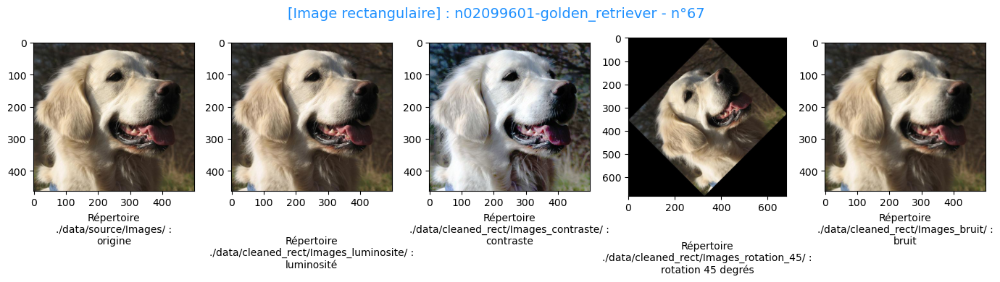

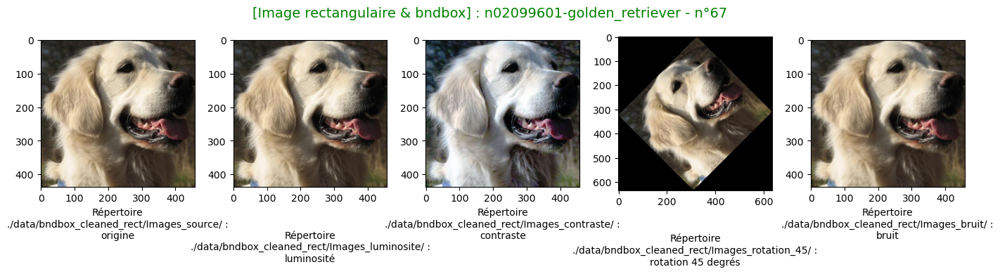

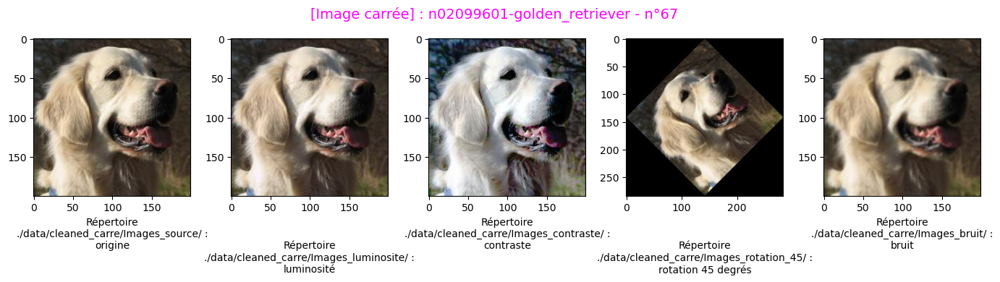

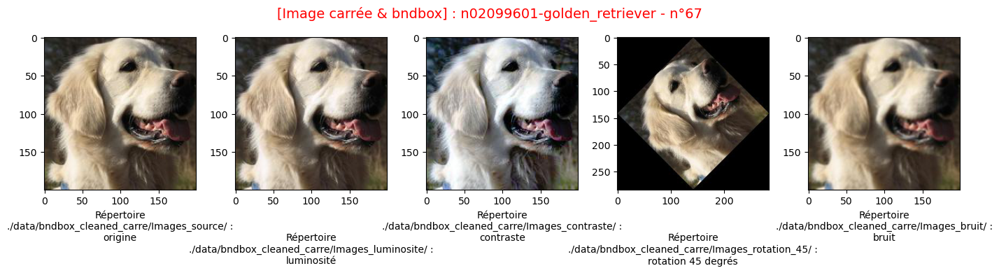

In [491]:
folder_number = 'n02099601'
breed         = 'golden_retriever'
dog_number    = '67'

# Image rectangulaire
affichage_image_bruit(folder_source_in = folder_source_rect, 
                      folder_target_in = folder_target_rect,
                      folder_number_in = folder_number,
                      breed_in         = breed,
                      dog_number_in    = dog_number)

# Image rectangulaire & bndbox
affichage_image_bruit(folder_source_in = folder_bndbox_source_rect, 
                      folder_target_in = folder_bndbox_target_rect,
                      folder_number_in = folder_number,
                      breed_in         = breed,
                      dog_number_in    = dog_number)

# Image carrée
affichage_image_bruit(folder_source_in = folder_source_carre, 
                      folder_target_in = folder_target_carre,
                      folder_number_in = folder_number,
                      breed_in         = breed,
                      dog_number_in    = dog_number)

# Image carrée & bndbox
affichage_image_bruit(folder_source_in = folder_bndbox_source_carre, 
                      folder_target_in = folder_bndbox_target_carre,
                      folder_number_in = folder_number,
                      breed_in         = breed,
                      dog_number_in    = dog_number)

# 2.6. Vérification nombre d'images

In [4]:
# Vérification nombre d'images total dans le répertoire source et dans chaque sous-répertoires cleaned (1 / race de chien)
for folder in [# >>>>>>> Images rectangulaires
               C_DATASET_SOURCE_IMAGES, # images source
               C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE, C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE,
               C_DATASET_CLEANED_RECT_IMAGES_ROTATION_45, C_DATASET_CLEANED_RECT_IMAGES_BRUIT,
    
               # >>>>>>> Images carrées
               C_DATASET_CLEANED_CARRE_IMAGES_SOURCE, 
               C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE, C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE,
               C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45, C_DATASET_CLEANED_CARRE_IMAGES_BRUIT,
    
               # >>>>>>> Images rectangulaires bndbox 
               C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE,
               C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE, C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE,
               C_BNDBOX_CLEANED_RECT_IMAGES_ROTATION_45, C_BNDBOX_CLEANED_RECT_IMAGES_BRUIT,
                              
               # >>>>>>> Images carrées bndbox
               C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE, 
               C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE, C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE,
               C_BNDBOX_CLEANED_CARRE_IMAGES_ROTATION_45, C_BNDBOX_CLEANED_CARRE_IMAGES_BRUIT]:

    nb_img_total = 0  # nb images total
    
    for dir_image in os.listdir(folder):
        path_subfolder_images = folder + dir_image
        nb_img = len(os.listdir(path_subfolder_images))
    
        # Maj nombre d'images total
        nb_img_total = nb_img_total + nb_img
        
    print(nb_img_total, 'images dans le répertoire', folder)

20580 images dans le répertoire ./data/source/Images/
20580 images dans le répertoire ./data/cleaned_rect/Images_luminosite/
20580 images dans le répertoire ./data/cleaned_rect/Images_contraste/
20580 images dans le répertoire ./data/cleaned_rect/Images_rotation_45/
20580 images dans le répertoire ./data/cleaned_rect/Images_bruit/
20580 images dans le répertoire ./data/cleaned_carre/Images_source/
20580 images dans le répertoire ./data/cleaned_carre/Images_luminosite/
20580 images dans le répertoire ./data/cleaned_carre/Images_contraste/
20580 images dans le répertoire ./data/cleaned_carre/Images_rotation_45/
20580 images dans le répertoire ./data/cleaned_carre/Images_bruit/
20580 images dans le répertoire ./data/bndbox_cleaned_rect/Images_source/
20580 images dans le répertoire ./data/bndbox_cleaned_rect/Images_luminosite/
20580 images dans le répertoire ./data/bndbox_cleaned_rect/Images_contraste/
20580 images dans le répertoire ./data/bndbox_cleaned_rect/Images_rotation_45/
20580 im

# 3. Modélisation avec des CNNs (Convolutional Neural Networks / réseaux de neurones convolutionnels)

# 3.1. Approche 1 - Mon propre réseau CNN

In [ ]:
# https://www.tensorflow.org/tutorials/images/classification?hl=fr
# https://www.kaggle.com/code/anandhuh/image-classification-using-cnn-for-beginners

# https://datascience.stackexchange.com/questions/118450/how-to-do-train-test-split-for-multi-class-classification

# 3.1.1. Fonctions communes

In [4]:
###############################################################
# Affichage durée programme                                   #
###############################################################
def affichage_duree_programme(time_start_sec, time_stop_sec) :
    
    # Delta time in seconds
    delta_time_sec = time_stop_sec - time_start_sec
    
    # Delta time in minutes
    delta_time_min = delta_time_sec / 60
    
    print('Durée programme (start : {:.3f}'.format(time_start_sec), '--> stop : {:.3f}'.format(time_stop_sec), ') = '
          '{:.3f}'.format(delta_time_sec), 'sec ou {:.3f}'.format(delta_time_min), 'min\n')

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ 1. DONNEES              @ 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@

In [5]:
########################################
# 1.1. Découpage données               #
#    > Train set      : 80 % dataset   #
#    > Test / Val set : 20 % dataset   #
########################################

# La structure du folder est : 
# main_directory/
# ...class_a/
# ......a_image_1.jpg
# ......a_image_2.jpg
# ...class_b/
# ......b_image_1.jpg
# ......b_image_2.jpg
def decoupage_train_test(directory_in, img_side_in):
    
    batch_size = 128

    print('directory_in\t=', directory_in,
          '\nimg_side_in\t=', img_side_in, '\n')
    
    train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(directory        = directory_in,
                                                                   # labels are generated from the directory structure
                                                                   labels           = 'inferred',     
                                                                   validation_split = 0.2,
                                                                   # 2 subsets = training (80 %) et validation (20 %)
                                                                   subset           = 'both',
                                                                   seed = 123,
                                                                   image_size       = (img_side_in, img_side_in),
                                                                   batch_size       = batch_size)
    
    
    # Nombre de classes (commun à tous les type de préparation)
    num_classes = len(train_ds.class_names)
    print('\nnum_classes =', num_classes)

    return num_classes, train_ds, val_ds

In [6]:
#####################################################
# 1.2. Visualisez les données                       #
#####################################################
def visualiser_donnees(train_ds_in):

    # Nom des classes
    class_names_train = train_ds_in.class_names
    print('class_names_train =', class_names_train)
    print('\n')

    # L'image_batch est un tenseur de la forme (32, 200, 200, 3).
    # Il s'agit d'un lot de 32 images de forme 200x200x3 (la dernière dimension fait référence aux canaux de couleur RGB).
    # Le label_batch est un tenseur de la forme (32,) , ce sont des labels correspondants aux 32 images.
    for image_batch, labels_batch in train_ds_in:
        print('image_batch.shape\t=', image_batch.shape)
        print('labels_batch.shape\t=', labels_batch.shape)
        break
    print('\n')
    
    # 9 premières images de l'ensemble de données d'entraînement
    plt.figure(figsize = (12, 7))
    for images, labels in train_ds_in.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype('uint8'))
            plt.title(class_names_train[labels[i]], fontsize = 10)
            plt.axis('off')

In [7]:
###############################################################
# 1.3. Configurer l'ensemble de données pour les performances #
###############################################################
# Dataset.cache : conserve les images en mémoire après leur chargement hors disque au cours de la première époque. 
#                 Cela garantira que l'ensemble de données ne devienne pas un goulot d'étranglement lors de la formation
#                 de votre modèle.
# Dataset.prefetch : chevauche le prétraitement des données et l'exécution du modèle pendant la formation.
  
def configurer_dataset_performance(train_ds_in, val_ds_in):
    
    AUTOTUNE = tf.data.AUTOTUNE

    train_ds = train_ds_in.cache().shuffle(1000).prefetch(buffer_size = AUTOTUNE)
    val_ds   = val_ds_in.cache().prefetch(buffer_size = AUTOTUNE)
    
    return train_ds, val_ds

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ 2. MODELE               @ 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@

In [8]:
#####################################################
# 2.1. Construction modèle : création & compilation #
#####################################################
def construction_modele(num_classes_in, img_side_in, is_affichage_in = False):
    
    #####################################################
    # Créer le modèle                                   #
    #####################################################
    # Le modèle séquentiel se compose de trois blocs de convolution (tf.keras.layers.Conv2D) 
    # avec une couche de regroupement maximum (tf.keras.layers.MaxPooling2D) dans chacun d'eux.
    # Il y a une couche entièrement connectée (tf.keras.layers.Dense) avec 128 unités dessus qui est activée 
    # par une fonction d'activation ReLU ('relu'). 
    # Ce modèle n'a pas été réglé pour une grande précision. L'objectif est de montrer une approche standard.
    model = Sequential([layers.Rescaling(1./255, input_shape = (img_side_in, img_side_in, 3)),
                        layers.Conv2D(16, 3, padding = 'same', activation = 'relu'),
                        layers.MaxPooling2D(),
                        layers.Conv2D(32, 3, padding = 'same', activation = 'relu'),
                        layers.MaxPooling2D(),
                        layers.Conv2D(64, 3, padding = 'same', activation = 'relu'),
                        layers.MaxPooling2D(),
                        layers.Flatten(),
                        layers.Dense(128, activation = 'relu'),
                        layers.Dense(num_classes_in)])


    #####################################################
    # Compiler le modèle                                #
    #####################################################
    # Adam is the best among the adaptive optimizers in most of the cases
    model.compile(optimizer = 'adam',                                                            # optimizer
                  loss      = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True), # fonction de perte
                  metrics   = ['accuracy'])                                                      # précision train / test


    #####################################################
    # Architecture du modèle                            #
    #####################################################
    # Affichage de toutes les couches du réseau
    if (is_affichage_in):
        model.summary()
    
    return model

In [96]:
#####################################################
# 2.2. Entraînement et évaluation du modèle         #
#####################################################
def entrainement_evaluation_modele(folder_history_file_in, type_modele_DL, type_donnees_in, \
                                   img_side_in, train_ds_in, val_ds_in, model_in, epochs_in = 10):
    
    # Start the stopwatch / counter
    time_start_sec = perf_counter()
    
    history = model_in.fit(train_ds_in,
                           validation_data = val_ds_in,
                           epochs          = epochs_in)
    
    
    
    # Détail valeurs history (qui seront tracées plus tard)
    print('\nhistory\t=', history.history, '\n')
    

    # CNN
    if (type_modele_DL == 'CNN'):
        acc     = history.history['accuracy']
        val_acc = history.history['val_accuracy']
    # CNN Transfer Learning
    elif (type_modele_DL == 'CNN_TL'):
        acc     = history.history['binary_accuracy']
        val_acc = history.history['val_binary_accuracy']    
    
    loss     = history.history['loss']
    val_loss = history.history['val_loss']
    
    print('acc =', acc, '\n')
    print('val_acc =', val_acc, '\n')
    print('loss =', loss, '\n')
    print('val_loss =', val_loss, '\n')    
    


    # Enregistrement dans un fichier (alléger la mémoire).
    # https://datatofish.com/list-to-dataframe/
    # https://stacklima.com/creer-un-dataframe-pandas-a-partir-de-listes/    
    # Calling DataFrame constructor after zipping both lists, with columns specified
    df = pd.DataFrame(list(zip(acc, val_acc, loss, val_loss)),
                      columns = ['acc', 'val_acc', 'loss', 'val_loss'])
    
        
    nom_fichier = folder_history_file_in + type_modele_DL + '_history' + type_donnees_in + '_' + str(img_side_in) + '.csv'
    print('==> enregistrement dataframe dans fichier', nom_fichier, ':')
    print(df)
    
    df.to_csv(nom_fichier, sep = '\t', header = True, index = False)

         
        
    #############################################
    #             Evaluation modèle             #
    #############################################
    # https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/
    print('\nEvaluation modèle img_side_in =', img_side_in, ':')
    print('\t- val_acc mean\t=', round(np.mean(val_acc), 4))
    print('\t- val_acc max\t=', round(np.max(val_acc), 4))
    
    print('\t- val_loss mean\t=', round(np.mean(val_loss), 4))
    print('\t- val_loss min\t=', round(np.min(val_loss), 4), '\n') 
    
    
        
    # Stop the stopwatch / counter
    time_stop_sec = perf_counter()
    
    # Affichage durée programme
    affichage_duree_programme(time_start_sec = time_start_sec, 
                              time_stop_sec  = time_stop_sec)
    
    return history

In [ ]:
#####################################################
# 2.3. Evaluation du modèle                         #
#####################################################
#def evaluation_modele(type_donnees_in, model_in, val_ds_in):
#    
#    test_loss, test_acc = model_in.evaluate(val_ds_in,
#                                            verbose = 2)
#    
#    print('\ntype_donnees_in\t=', type_donnees_in, ':')
#    print('\t- test accuracy\t=', round(test_acc, 4))       
#    print('\t- test loss\t=', round(test_loss, 4))

In [30]:
###############################################################
# Regroupement des fonctions ci-dessus en une fonction unique #
###############################################################
def modele_cnn_1(img_side_in,
                 type_modele_DL_in,     # type de modèle de deep learning :
                                        # --> 'CNN'    = modèle CNN
                                        # --> 'CNN_TL' = modèle CNN transfer Learning
                 folder_images_in,
                 folder_history_file_in,
                 type_donnees_in,
                 is_affichage_in = False):

    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @ 1. DONNEES              @ 
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # 1.1. Découpage données train / val
    print('@' *20, '1.1. Découpage données train / val', '@' *69, '\n')
    num_classes, train_ds, val_ds = decoupage_train_test(directory_in = folder_images_in,
                                                         img_side_in  = img_side_in)


    # 1.2. Visualisez les données (optionnel)
    if (is_affichage_in):
        print('\n\n\n')
        print('@' *20, '1.2. Visualisez les données', '@' *76, '\n')
        visualiser_donnees(train_ds_in = train_ds)


    # 1.3. Configurer l'ensemble de données pour les performances
    print('\n\n\n')
    print('@' *20, '1.3. Configurer l\'ensemble de données pour les performances', '@' *44, '\n')
    train_ds, val_ds = configurer_dataset_performance(train_ds_in = train_ds,
                                                      val_ds_in   = val_ds)


    
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @ 2. MODELE               @ 
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    print('\n\n')
    print('@' *20, '2.1. Construction modèle : création & compilation', '@' *54, '\n')
    # 2.1. Construction modèle : création & compilation
    model = construction_modele(num_classes_in  = num_classes,
                                img_side_in     = img_side_in,
                                is_affichage_in = is_affichage_in)


    # 2.2. Entraînement et évaluation du modèle
    print('\n\n')
    print('@' *20, '2.2. Entraînement & évaluation modèle', '@' *66, '\n')
    history = entrainement_evaluation_modele(folder_history_file_in = folder_history_file_in,
                                             type_modele_DL         = type_modele_DL_in,
                                             type_donnees_in        = type_donnees_in,
                                             img_side_in            = img_side_in,
                                             train_ds_in            = train_ds, 
                                             val_ds_in              = val_ds, 
                                             model_in               = model) 
 
        
    # Suppression_variables pour libérer de la place
    del train_ds
    del val_ds
    del model
    del history

In [64]:
################################################################################################
# Evaluation du modèle :                                                                       #
# Visualisez les résultats de l'entraînement pour un type de données i.e. dans un folder donné #
################################################################################################ 

# Couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html
def affichage_metriques_par_donnee(folder_history_file_in, type_modele_DL_in, \
                                   is_data_augmentation_in = False, epochs_in = 10):
    
    # https://matplotlib.org/stable/gallery/color/named_colors.html
    colors       = ['blue', 'red', 'chartreuse', 'fuchsia', 'deepskyblue', 'orange', 'silver']
    epochs_range = range(epochs_in)
  
    plt.figure(figsize = (13, 5))
    
    # Titre principal
    # https://www.delftstack.com/fr/howto/matplotlib/how-to-set-a-single-main-title-for-all-the-subplots-in-matplotlib/
    if ('rect' in folder_history_file_in):
        # Données rectangulaires & bounding box
        if ('bndbox' in folder_history_file_in):
            bit_title = 'rectangulaires & bndbox'
        # Données rectangulaires
        else:
            bit_title = 'rectangulaires'
    elif('carre' in folder_history_file_in):
        # Données carrées & bounding box
        if ('bndbox' in folder_history_file_in):
            bit_title = 'carrées & bndbox'
        # Données carrées
        else:
            bit_title = 'carrées'
            
    main_title = 'Données ' + bit_title + ' % preprocessings'
    plt.suptitle(main_title, color = 'purple', fontsize = 20, fontweight = 'bold')
    
    
    
    # Taille du côté de l'image (carré)
    liste_img_side = [200, 100, 75, 50, 25]
    
    if (is_data_augmentation_in):
        liste_type_donnees = ['_data_augmentation_source', '_data_augmentation_carre', '_data_augmentation_luminosite', 
                              '_data_augmentation_contraste', '_data_augmentation_rotation_45', '_data_augmentation_bruit']
    else:
        liste_type_donnees = ['_source', '_carre', '_luminosite', '_contraste', '_rotation_45', '_bruit']

        
        
        
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @    Subplot 1 : validation accuracy (mean & max)   @
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    print('>' * 30, 'VALIDATION ACCURACY (MEAN & MAX)')    
    plt.subplot(1, 2, 1)
    

    # Boucle sur les types de données.
    for type_donnees in liste_type_donnees:

        # Initialisation listes
        val_acc_mean = []
        val_acc_max  = []
        
        # Boucle sur la taille de l'image
        for img_side in liste_img_side:    
             
            path = folder_history_file_in + type_modele_DL_in + '_history' + type_donnees + '_' + str(img_side) + '.csv'
        
            # Verification si fichier existe :
            # https://stacklima.com/python-verifier-si-un-fichier-ou-un-repertoire-existe/
            if (os.path.exists(path)):
                # Chargement données entraînées
                df = pd.read_csv(path, sep = '\t')    
#               print(type_donnees, '\n', df)
     
                acc      = df['acc']      # history.history['accuracy'] ....... pas utilisé ici.......
                val_acc  = df['val_acc']  # history.history['val_accuracy']
            
                # val_accuracy : moyenne pour cette taille d'image
                val_acc_mean.append(round(np.mean(val_acc), 4))
                # val_accuracy : max pour cette taille d'image            
                val_acc_max.append(round(np.max(val_acc), 4))
                
#                print('type_donnees =', type_donnees, ', img_side =', img_side, 
#                      ', val_acc_mean =', val_acc_mean,
#                      ', val_acc_max =', val_acc_max)


                # Maj labels
                if ('_data_augmentation' in type_donnees):
                    pre_label = ' _data_augmentation'
                else:
                    pre_label = ' '
                
                if ('_source' in type_donnees):
                    label_val_acc_mean = pre_label + '_source mean'
                    label_val_acc_max  = pre_label + '_source max'        
                elif ('_carre' in type_donnees):
                    label_val_acc_mean = pre_label + '_carre mean'
                    label_val_acc_max  = pre_label + '_carre max'
                elif ('_luminosite' in type_donnees):
                    label_val_acc_mean = pre_label + '_luminosite mean'
                    label_val_acc_max  = pre_label + '_luminosite max'
                elif ('_contraste' in type_donnees):
                    label_val_acc_mean = pre_label + '_contraste mean'
                    label_val_acc_max  = pre_label + '_contraste max'    
                elif ('_rotation_45' in type_donnees):
                    label_val_acc_mean = pre_label + '_rotation_45 mean'
                    label_val_acc_max  = pre_label + '_rotation_45 max'         
                elif ('_bruit' in type_donnees):
                    label_val_acc_mean = pre_label + '_bruit mean'
                    label_val_acc_max  = pre_label + '_bruit max'
                
                # https://geekflare.com/fr/python-lists-find-index/
                ind_colors = liste_type_donnees.index(type_donnees)
                
                
        if ((val_acc_mean != []) & (val_acc_max != [])):
            print('type_donnees =', type_donnees, ':',
                  '\n\t- liste_img_side\t=', liste_img_side, 
                  '\n\t- val_acc_mean\t\t=', val_acc_mean, 
                  '\n\t- val_acc_max\t\t=', val_acc_max, '\n')
        
            plt.plot(liste_img_side, val_acc_mean, color = colors[ind_colors], marker = '*', linestyle = ':', 
                     label = label_val_acc_mean)
            plt.plot(liste_img_side, val_acc_max,  color = colors[ind_colors], marker = 'o', linestyle = '-', 
                     label = label_val_acc_max)
            plt.legend(loc = 'best', fontsize = 7.5, ncol = 2)
            plt.title('Validation accuracy (mean & max), epochs = ' + str(epochs_in))
            plt.xlabel('Image side')
            plt.ylabel('Accuracy')
        
    
    
    
    
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @     Subplot 2 : validation loss (mean & min)      @
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    print('\n')
    print('>' * 30, 'VALIDATION LOSS (MEAN & MIN)')
    plt.subplot(1, 2, 2) 
    ind_colors = 0 # initialisation
    
    # Boucle sur les types de données.
    for type_donnees in liste_type_donnees:
        
        # Initialisation listes
        val_loss_mean = []
        val_loss_min  = []
        
        # Boucle sur la taille de l'image
        for img_side in liste_img_side:    
             
            path = folder_history_file_in + type_modele_DL_in + '_history' + type_donnees + '_' + str(img_side) + '.csv'
            
        
            # Verification si fichier existe :
            # https://stacklima.com/python-verifier-si-un-fichier-ou-un-repertoire-existe/
            if (os.path.exists(path)):
                # Chargement données entraînées
                df = pd.read_csv(path, sep = '\t')    
#               print(type_donnees, '\n', df)
          
                loss     = df['loss']     # history.history['loss'] ....... pas utilisé ici.......
                val_loss = df['val_loss'] # history.history['val_loss']
            
                # val_loss : moyenne pour cette taille d'image
                val_loss_mean.append(round(np.mean(val_loss), 4))
                # val_loss : min pour cette taille d'image            
                val_loss_min.append(round(np.min(val_loss), 4))
                
#                print('type_donnees =', type_donnees, ', img_side =', img_side, 
#                      ', val_loss_mean =', val_loss_mean,
#                      ', val_loss_min =', val_loss_min)
                

                # Maj labels
                if ('_data_augmentation' in type_donnees):
                    pre_label = ' _data_augmentation'
                else:
                    pre_label = ' '
                
                if ('_source' in type_donnees):
                    label_val_loss_mean = pre_label + '_source mean'
                    label_val_loss_min  = pre_label + '_source min'        
                elif ('_carre' in type_donnees):
                    label_val_loss_mean = pre_label + '_carre mean'
                    label_val_loss_min  = pre_label + '_carre min'
                elif ('_luminosite' in type_donnees):
                    label_val_loss_mean = pre_label + '_luminosite mean'
                    label_val_loss_min  = pre_label + '_luminosite min'
                elif ('_contraste' in type_donnees):
                    label_val_loss_mean = pre_label + '_contraste mean'
                    label_val_loss_min  = pre_label + '_contraste min'    
                elif ('_rotation_45' in type_donnees):
                    label_val_loss_mean = pre_label + '_rotation_45 mean'
                    label_val_loss_min  = pre_label + '_rotation_45 min'         
                elif ('_bruit' in type_donnees):
                    label_val_loss_mean = pre_label + '_bruit mean'
                    label_val_loss_min  = pre_label + '_bruit min'
                    
                ind_colors = liste_type_donnees.index(type_donnees)
                
                
        if ((val_loss_mean != []) & (val_loss_min != [])):   
            print('type_donnees =', type_donnees, ':',
                  '\n\t- liste_img_side\t=', liste_img_side,
                  '\n\t- val_loss_mean\t\t=', val_loss_mean, 
                  '\n\t- val_loss_min\t\t=', val_loss_min, '\n')
            
            plt.plot(liste_img_side, val_loss_mean, color = colors[ind_colors], marker = '*', linestyle = ':', 
                     label = label_val_loss_mean)
            plt.plot(liste_img_side, val_loss_min,  color = colors[ind_colors], marker = 'o', linestyle = '-', 
                     label = label_val_loss_min)
            plt.legend(loc = 'best', fontsize = 7.5, ncol = 2)
            plt.title('Validation loss (mean & min), epochs = ' + str(epochs_in))
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
    
    plt.tight_layout()
    plt.show()

# 3.1.2. Données rectangulaires & bounding box % preprocessings

# 3.1.2.1. Source ('xxx.jpg')

In [13]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_rect_source = 200

In [14]:
modele_cnn_1(img_side_in            = img_side_bndbox_rect_source,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_RECT_IMAGES_SOURCE,
             folder_history_file_in = C_BNDBOX_CLEANED_RECT,
             type_donnees_in        = '_source')

@@@@@@@@@@@@@@@@@@@@ 1.1. Découpage données train / val @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 

directory_in	= ./data/bndbox_cleaned_rect/Images_source/ 
img_side_in	= 200 

Found 20580 files belonging to 120 classes.
Using 16464 files for training.
Using 4116 files for validation.

num_classes = 120




@@@@@@@@@@@@@@@@@@@@ 1.3. Configurer l'ensemble de données pour les performances @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 




@@@@@@@@@@@@@@@@@@@@ 2.1. Construction modèle : création & compilation @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 




@@@@@@@@@@@@@@@@@@@@ 2.2. Entraînement & évaluation modèle @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 

Epoch 1/10
129/129 [==============================] - 491s 4s/step - loss: 4.6729 - accuracy: 0.0231 - val_loss: 4.4601 - val_accuracy: 0.0328
Epoch 2/10
129/129 [==============================] - 333s 3s/step - loss: 4.1959 - accuracy: 0.0626 - val_loss: 4.1027 - val_acc

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#        (type_donnees_in = '_source')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0869 |      0.1045 |        5.2646 |       3.9212 |      55.564 min |
# |         100 |       0.1111 |      0.1361 |        4.3439 |       3.8168 |      13.809 min |
# |          75 |       0.1122 |      0.1414 |        3.9613 |       3.7591 |       7.156 min |
# |          50 |       0.1075 |      0.1467 |        3.8936 |       3.6955 |       3.670 min | <-- meilleur val_acc max
# |          25 |       0.0926 |      0.1307 |        3.947  |       3.7316 |       1.303 min |

# 3.1.2.2. Luminosité ('xxx_luminosite.jpg')

In [37]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_rect_luminosite = 25

In [11]:
modele_cnn_1(img_side_in            = img_side_bndbox_rect_luminosite,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE,
             folder_history_file_in = C_BNDBOX_CLEANED_RECT,
             type_donnees_in        = '_luminosite')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_luminosite')      #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0926 |      0.112  |        6.2211 |       3.9211 |      49.089 min |
# |         100 |       0.1256 |      0.1577 |        4.1346 |       3.6832 |       9.580 min |
# |          75 |       0.1265 |      0.1586 |        3.9517 |       3.728  |       5.828 min |
# |          50 |       0.1205 |      0.1621 |        3.8507 |       3.6886 |       3.023 min | <-- meilleur val_acc max
# |          25 |       0.0919 |      0.1295 |        3.9445 |       3.7339 |       1.024 min |

# 3.1.2.3. Contraste ('xxx_contraste.jpg')

In [85]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_rect_contraste = 25

In [12]:
modele_cnn_1(img_side_in            = img_side_bndbox_rect_contraste,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_RECT_IMAGES_CONTRASTE,
             folder_history_file_in = C_BNDBOX_CLEANED_RECT,
             type_donnees_in        = '_contraste')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_contraste')       #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0722 |      0.0911 |        4.3961 |       4.0562 |      83.803 min |
# |         100 |       0.0995 |      0.1263 |        4.2878 |       3.9465 |      10.171 min |
# |          75 |       0.1074 |      0.1426 |        4.0885 |       3.8399 |       5.569 min | <-- meilleur val_acc max
# |          50 |       0.1045 |      0.1368 |        4.0179 |       3.8439 |       3.382 min |
# |          25 |       0.0761 |      0.1149 |        4.1886 |       3.9538 |       1.428 min |

# 3.1.2.4. Rotation 45° ('xxx_rotation_45.jpg')

In [97]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_rect_rotation_45 = 25

In [13]:
modele_cnn_1(img_side_in            = img_side_bndbox_rect_rotation_45,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_RECT_IMAGES_ROTATION_45,
             folder_history_file_in = C_BNDBOX_CLEANED_RECT,
             type_donnees_in        = '_rotation_45')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_rotation_45')     #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0902 |      0.1069 |        5.0182 |       3.9851 |     100.890 min |
# |         100 |       0.0969 |      0.1336 |        4.1321 |       3.9296 |      11.311 min |
# |          75 |       0.1081 |      0.1458 |        3.9525 |       3.7611 |       5.335 min | <-- meilleur val_acc max
# |          50 |       0.1066 |      0.1443 |        3.9337 |       3.7244 |       2.984 min |
# |          25 |       0.0779 |      0.1084 |        4.0719 |       3.8509 |       0.998 min |

# 3.1.2.5. Bruit ('xxx_bruit.jpg')

In [114]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_rect_bruit = 25

In [14]:
modele_cnn_1(img_side_in            = img_side_bndbox_rect_bruit,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_RECT_IMAGES_BRUIT,
             folder_history_file_in = C_BNDBOX_CLEANED_RECT,
             type_donnees_in        = '_bruit')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#         (type_donnees_in = '_bruit')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0737 |      0.0877 |        4.5703 |       4.0263 |      39.805 min |
# |         100 |       0.1066 |      0.1324 |        4.137  |       3.8129 |      10.682 min |
# |          75 |       0.1113 |      0.1504 |        3.9383 |       3.7183 |       5.424 min |
# |          50 |       0.1173 |      0.1514 |        3.8948 |       3.7275 |       2.828 min | <-- meilleur val_acc max
# |          25 |       0.0928 |      0.1339 |        3.9969 |       3.7792 |       1.171 min |

# 3.1.2.6. Synthèse % preprocessings

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> VALIDATION ACCURACY (MEAN & MAX)
type_donnees = _source : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0869, 0.1111, 0.1122, 0.1075, 0.0926] 
	- val_acc_max		= [0.1045, 0.1361, 0.1414, 0.1467, 0.1307] 

type_donnees = _luminosite : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0926, 0.1256, 0.1265, 0.1205, 0.0919] 
	- val_acc_max		= [0.112, 0.1577, 0.1586, 0.1621, 0.1295] 

type_donnees = _contraste : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0722, 0.0995, 0.1074, 0.1045, 0.0761] 
	- val_acc_max		= [0.0911, 0.1263, 0.1426, 0.1368, 0.1149] 

type_donnees = _rotation_45 : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0902, 0.0969, 0.1081, 0.1066, 0.0779] 
	- val_acc_max		= [0.1069, 0.1336, 0.1458, 0.1443, 0.1084] 

type_donnees = _bruit : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0737, 0.1066, 0.1113, 0.1173, 0.0928] 
	- val_acc_max		= [0.0877, 

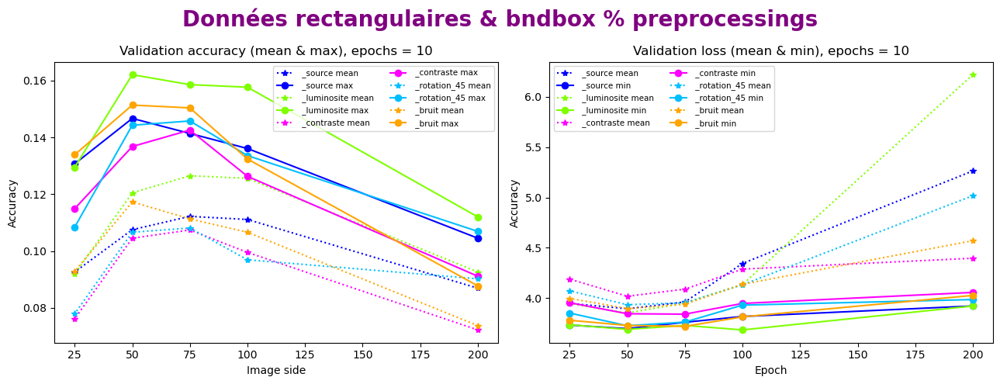

In [67]:
affichage_metriques_par_donnee(folder_history_file_in = C_BNDBOX_CLEANED_RECT,
                               type_modele_DL_in      = 'CNN')

In [ ]:
##################################################################
#   Synthèse résultats - données rectangulaires & bounding box   #
##################################################################
#
# |     type_donnees_in     |     img_side_in     | meilleur val_acc max  |
# | (type de preprocessing) | (taille côté image) |    (test accuracy)    |
# |-------------------------|---------------------|-----------------------|
# | '_source.jpg'           |                 50  |                0.1467 |
# | '_luminosite.jpg'       |                 50  |                0.1621 | <--
# | '_contraste.jpg'        |                 75  |                0.1426 |
# | '_rotation_45.jpg'      |                 75  |                0.1458 |
# | '_bruit.jpg'            |                 50  |                0.1514 |

# 3.1.3. Données rectangulaires % preprocessings

# 3.1.3.1. Source ('xxx.jpg')

In [132]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_rect_source = 25

In [28]:
modele_cnn_1(img_side_in            = img_side_rect_source,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_SOURCE_IMAGES,
             folder_history_file_in = C_DATASET_CLEANED_RECT,
             type_donnees_in        = '_source')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#        (type_donnees_in = '_source')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.058  |      0.068  |        6.7328 |       4.2747 |      42.597 min |
# |         100 |       0.077  |      0.0938 |        4.8959 |       4.1819 |      11.354 min |
# |          75 |       0.0707 |      0.0897 |        4.3604 |       4.1729 |       6.048 min |
# |          50 |       0.0779 |      0.0979 |        4.2374 |       4.1233 |       3.021 min | <-- meilleur val_acc max
# |          25 |       0.0623 |      0.0799 |        4.2456 |       4.133  |       1.174 min |

# 3.1.3.2. Luminosité ('xxx_luminosite.jpg')

In [142]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_rect_luminosite = 25

In [15]:
modele_cnn_1(img_side_in            = img_side_rect_luminosite,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_RECT_IMAGES_LUMINOSITE,
             folder_history_file_in = C_DATASET_CLEANED_RECT,
             type_donnees_in        = '_luminosite')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_luminosite')      #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0527 |      0.0624 |        5.0221 |       4.2331 |      68.566 min |
# |         100 |       0.0745 |      0.0901 |        4.4847 |       4.1325 |      14.147 min |
# |          75 |       0.0704 |      0.0867 |        4.4044 |       4.1764 |       7.953 min |
# |          50 |       0.0686 |      0.0945 |        4.2465 |       4.1202 |       3.534 min | <-- meilleur val_acc max
# |          25 |       0.061  |      0.0879 |        4.2744 |       4.1338 |       1.195 min |

# 3.1.3.3. Contraste ('xxx_contraste.jpg')

In [152]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_rect_contraste = 25

In [16]:
modele_cnn_1(img_side_in            = img_side_rect_contraste,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_RECT_IMAGES_CONTRASTE,
             folder_history_file_in = C_DATASET_CLEANED_RECT,
             type_donnees_in        = '_contraste')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_contraste')       #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0453 |      0.0586 |        6.378  |       4.421  |      48.258 min |
# |         100 |       0.059  |      0.0734 |        4.6373 |       4.2869 |       9.756 min |
# |          75 |       0.0575 |      0.0753 |        4.6069 |       4.379  |       5.920 min |
# |          50 |       0.0579 |      0.0802 |        4.4224 |       4.2833 |       3.333 min | <-- meilleur val_acc max
# |          25 |       0.0482 |      0.0692 |        4.4383 |       4.3213 |       1.215 min |

# 3.1.3.4. Rotation 45° ('xxx_rotation_45.jpg')

In [162]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_rect_rotation_45 = 25

In [17]:
modele_cnn_1(img_side_in            = img_side_rect_rotation_45,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_RECT_IMAGES_ROTATION_45,
             folder_history_file_in = C_DATASET_CLEANED_RECT,
             type_donnees_in        = '_rotation_45')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_rotation_45')     #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0727 |      0.0884 |        5.3118 |       4.1568 |      41.664 min |
# |         100 |       0.0787 |      0.1059 |        4.3188 |       4.1154 |      15.904 min | <-- meilleur val_acc max
# |          75 |       0.0799 |      0.105  |        4.3014 |       4.1256 |       8.100 min |
# |          50 |       0.0691 |      0.094  |        4.276  |       4.1375 |       4.160 min | 
# |          25 |       0.0543 |      0.0814 |        4.3322 |       4.1657 |       1.465 min |

# 3.1.3.5. Bruit ('xxx_bruit.jpg')

In [195]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_rect_bruit = 25

In [18]:
modele_cnn_1(img_side_in            = img_side_rect_bruit,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_RECT_IMAGES_BRUIT,
             folder_history_file_in = C_DATASET_CLEANED_RECT,
             type_donnees_in        = '_bruit')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#         (type_donnees_in = '_bruit')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0613 |      0.0731 |        6.6392 |       4.2556 |      45.801 min |
# |         100 |       0.0697 |      0.0833 |        4.8148 |       4.2343 |      11.725 min |
# |          75 |       0.0706 |      0.094  |        4.3682 |       4.131  |       6.426 min |
# |          50 |       0.0749 |      0.1023 |        4.2124 |       4.0606 |       3.213 min | <-- meilleur val_acc max
# |          25 |       0.0575 |      0.0799 |        4.2792 |       4.1246 |       1.122 min |

# 3.1.3.6. Synthèse % preprocessings

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> VALIDATION ACCURACY (MEAN & MAX)
type_donnees = _source : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.058, 0.077, 0.0707, 0.0779, 0.0623] 
	- val_acc_max		= [0.068, 0.0938, 0.0897, 0.0979, 0.0799] 

type_donnees = _luminosite : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0527, 0.0745, 0.0704, 0.0686, 0.061] 
	- val_acc_max		= [0.0624, 0.0901, 0.0867, 0.0945, 0.0879] 

type_donnees = _contraste : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0453, 0.059, 0.0575, 0.0579, 0.0482] 
	- val_acc_max		= [0.0586, 0.0734, 0.0753, 0.0802, 0.0692] 

type_donnees = _rotation_45 : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0727, 0.0787, 0.0799, 0.0691, 0.0543] 
	- val_acc_max		= [0.0884, 0.1059, 0.105, 0.094, 0.0814] 

type_donnees = _bruit : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0613, 0.0697, 0.0706, 0.0749, 0.0575] 
	- val_acc_max		= [0.0731, 0.0833

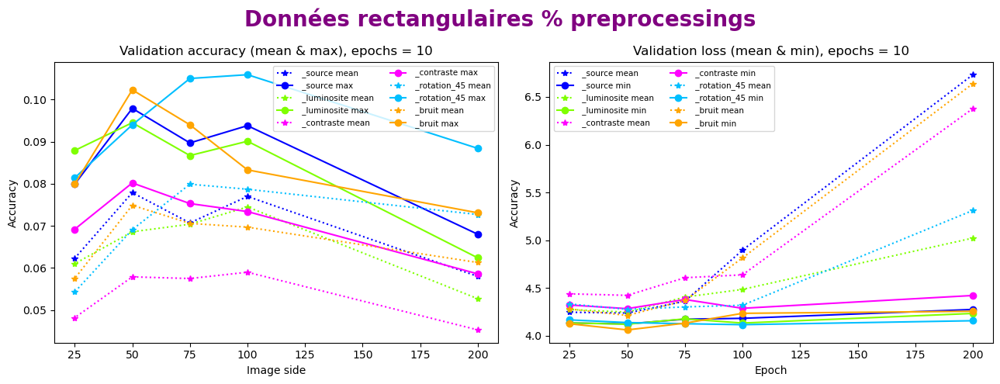

In [27]:
affichage_metriques_par_donnee(folder_history_file_in = C_DATASET_CLEANED_RECT,
                               type_modele_DL_in      = 'CNN')

In [ ]:
##################################################################
#   Synthèse résultats - données rectangulaires                  #
##################################################################
#
# |     type_donnees_in     |     img_side_in     | meilleur val_acc max  |
# | (type de preprocessing) | (taille côté image) |    (test accuracy)    |
# |-------------------------|---------------------|-----------------------|
# | '_source.jpg'           |                  50 |                0.0979 |
# | '_luminosite.jpg'       |                  50 |                0.0945 | 
# | '_contraste.jpg'        |                  50 |                0.0802 |
# | '_rotation_45.jpg'      |                 100 |                0.1059 | <--
# | '_bruit.jpg'            |                  50 |                0.1023 |

# 3.1.4. Données carrées & bounding box % preprocessings

# 3.1.4.1. Source ('xxx.jpg')

In [206]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_carre_source = 25

In [29]:
modele_cnn_1(img_side_in            = img_side_bndbox_carre_source,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_CARRE_IMAGES_SOURCE,
             folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
             type_donnees_in        = '_source')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#        (type_donnees_in = '_source')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0486 |      0.07   |        4.3066 |       4.1505 |      41.967 min |
# |         100 |       0.1229 |      0.1511 |        4.0186 |       3.7368 |       9.827 min |
# |          75 |       0.1205 |      0.1489 |        4.0702 |       3.7529 |       5.170 min |
# |          50 |       0.1225 |      0.1635 |        3.8457 |       3.6331 |       2.900 min | <-- meilleur val_acc max 
# |          25 |       0.0924 |      0.1273 |        3.9646 |       3.7411 |       1.305 min |

# 3.1.4.2. Luminosité ('xxx_luminosite.jpg')

In [220]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_carre_luminosite = 25

In [19]:
modele_cnn_1(img_side_in            = img_side_bndbox_carre_luminosite,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE,
             folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
             type_donnees_in        = '_luminosite')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_luminosite')      #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0832 |      0.1047 |        4.9445 |       3.9563 |      48.914 min |
# |         100 |       0.1169 |      0.1509 |        4.0722 |       3.7519 |       9.749 min |
# |          75 |       0.1148 |      0.1514 |        3.8931 |       3.6747 |       5.793 min |
# |          50 |       0.1252 |      0.1684 |        3.7949 |       3.5916 |       3.290 min | <-- meilleur val_acc max
# |          25 |       0.0975 |      0.1348 |        3.9334 |       3.7049 |       1.095 min |

# 3.1.4.3. Contraste ('xxx_contraste.jpg')

In [228]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_carre_contraste = 25

In [20]:
modele_cnn_1(img_side_in            = img_side_bndbox_carre_contraste,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_CARRE_IMAGES_CONTRASTE,
             folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
             type_donnees_in        = '_contraste')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_contraste')       #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0995 |      0.1212 |        5.3507 |       3.9628 |      95.635 min |
# |         100 |       0.1113 |      0.1378 |        4.2837 |       3.9249 |      10.842 min | <-- meilleur val_acc max
# |          75 |       0.1    |      0.13   |        4.0961 |       3.9034 |       5.526 min |
# |          50 |       0.1002 |      0.1375 |        4.075  |       3.8641 |       4.313 min | 
# |          25 |       0.0846 |      0.1227 |        4.1328 |       3.891  |       1.294 min |

# 3.1.4.4. Rotation 45° ('xxx_rotation_45.jpg')

In [20]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_carre_rotation_45 = 25

In [21]:
modele_cnn_1(img_side_in            = img_side_bndbox_carre_rotation_45,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_CARRE_IMAGES_ROTATION_45,
             folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
             type_donnees_in        = '_rotation_45')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_rotation_45')     #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.1083 |      0.1317 |        4.2689 |       3.7871 |      50.2   min |
# |         100 |       0.125  |      0.1657 |        3.8815 |       3.6594 |      12.249 min | <-- meilleur val_acc max
# |          75 |       0.1098 |      0.1475 |        3.8712 |       3.6855 |       6.203 min |
# |          50 |       0.0996 |      0.1402 |        3.9092 |       3.6637 |       3.243 min | 
# |          25 |       0.0784 |      0.1098 |        4.0668 |       3.8487 |       1.222 min |

# 3.1.4.5. Bruit ('xxx_bruit.jpg')

In [36]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_bndbox_carre_bruit = 25

In [22]:
modele_cnn_1(img_side_in            = img_side_bndbox_carre_bruit,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_CARRE_IMAGES_BRUIT,
             folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
             type_donnees_in        = '_bruit',
             is_affichage_in        = True)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#         (type_donnees_in = '_bruit')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0907 |      0.1042 |        5.3062 |       3.9413 |      46.670 min |
# |         100 |       0.1165 |      0.1399 |        4.1839 |       3.814  |      11.579 min |
# |          75 |       0.1148 |      0.1528 |        4.0149 |       3.7811 |       6.362 min |
# |          50 |       0.1189 |      0.1674 |        3.8434 |       3.6544 |       3.840 min | <-- meilleur val_acc max
# |          25 |       0.093  |      0.1341 |        3.9676 |       3.7453 |       1.346 min |

# 3.1.4.6. Synthèse % preprocessings

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> VALIDATION ACCURACY (MEAN & MAX)
type_donnees = _source : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0486, 0.1229, 0.1205, 0.1225, 0.0924] 
	- val_acc_max		= [0.07, 0.1511, 0.1489, 0.1635, 0.1273] 

type_donnees = _luminosite : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0832, 0.1169, 0.1148, 0.1252, 0.0975] 
	- val_acc_max		= [0.1047, 0.1509, 0.1514, 0.1684, 0.1348] 

type_donnees = _contraste : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0995, 0.1113, 0.1, 0.1002, 0.0846] 
	- val_acc_max		= [0.1212, 0.1378, 0.13, 0.1375, 0.1227] 

type_donnees = _rotation_45 : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.1083, 0.125, 0.1098, 0.0996, 0.0784] 
	- val_acc_max		= [0.1317, 0.1657, 0.1475, 0.1402, 0.1098] 

type_donnees = _bruit : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0907, 0.1165, 0.1148, 0.1189, 0.093] 
	- val_acc_max		= [0.1042, 0.1399, 

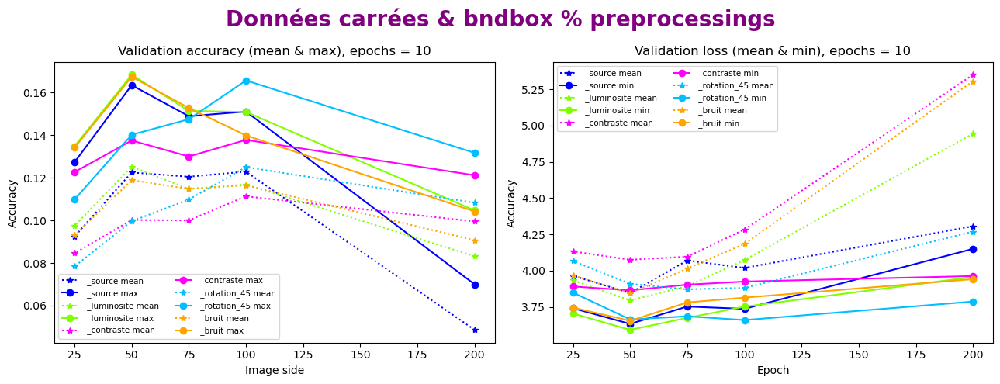

In [38]:
affichage_metriques_par_donnee(folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
                               type_modele_DL_in      = 'CNN')

In [ ]:
##################################################################
#   Synthèse résultats - données carrées & bounding box          #
##################################################################
#
# |     type_donnees_in     |     img_side_in     | meilleur val_acc max  |
# | (type de preprocessing) | (taille côté image) |    (test accuracy)    |
# |-------------------------|---------------------|-----------------------|
# | '_source.jpg'           |                  50 |                0.1635 |
# | '_luminosite.jpg'       |                  50 |                0.1684 | <--
# | '_contraste.jpg'        |                 100 |                0.1378 |
# | '_rotation_45.jpg'      |                 100 |                0.1657 |
# | '_bruit.jpg'            |                  50 |                0.1674 |

# 3.1.5. Données carrées % preprocessings

# 3.1.5.1. Source ('xxx.jpg')

In [47]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_carre_source = 25

In [30]:
modele_cnn_1(img_side_in            = img_side_carre_source,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_CARRE_IMAGES_SOURCE,
             folder_history_file_in = C_DATASET_CLEANED_CARRE,
             type_donnees_in        = '_source')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#        (type_donnees_in = '_source')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0617 |      0.0748 |        6.4585 |       4.24   |      49.494 min |
# |         100 |       0.0751 |      0.0933 |        4.5163 |       4.1456 |      11.801 min |
# |          75 |       0.0682 |      0.0882 |        4.2683 |       4.1188 |       6.868 min |
# |          50 |       0.0744 |      0.0994 |        4.2788 |       4.1396 |       3.618 min | <-- meilleur val_acc max
# |          25 |       0.0625 |      0.0799 |        4.2699 |       4.1338 |       1.127 min |

# 3.1.5.2. Luminosité ('xxx_luminosite.jpg')

In [59]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_carre_luminosite = 25

In [23]:
modele_cnn_1(img_side_in            = img_side_carre_luminosite,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_CARRE_IMAGES_LUMINOSITE,
             folder_history_file_in = C_DATASET_CLEANED_CARRE,
             type_donnees_in        = '_luminosite')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_luminosite')      #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0476 |      0.0549 |        6.0522 |       4.3414 |      54.094 min |
# |         100 |       0.0661 |      0.0802 |        4.8273 |       4.2469 |      16.580 min |
# |          75 |       0.0743 |      0.0965 |        4.3337 |       4.1581 |       8.719 min | <-- meilleur val_acc max
# |          50 |       0.0705 |      0.0916 |        4.2265 |       4.0907 |       3.941 min | 
# |          25 |       0.065  |      0.0853 |        4.2466 |       4.0944 |       1.269 min |

# 3.1.5.3. Contraste ('xxx_contraste.jpg')

In [72]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_carre_contraste = 25

In [24]:
modele_cnn_1(img_side_in            = img_side_carre_contraste,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_CARRE_IMAGES_CONTRASTE,
             folder_history_file_in = C_DATASET_CLEANED_CARRE,
             type_donnees_in        = '_contraste')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_contraste')       #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0388 |      0.0539 |        6.4425 |       4.4978 |      72.833 min |
# |         100 |       0.0562 |      0.0695 |        4.5251 |       4.3182 |      13.417 min |
# |          75 |       0.0675 |      0.0862 |        4.4443 |       4.2923 |       7.187 min | <-- meilleur val_acc max
# |          50 |       0.0615 |      0.0811 |        4.3882 |       4.2739 |       3.945 min | 
# |          25 |       0.0428 |      0.0651 |        4.4849 |       4.3728 |       1.257 min |

# 3.1.5.4. Rotation 45° ('xxx_rotation_45.jpg')

In [121]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_carre_rotation_45 = 25

In [25]:
modele_cnn_1(img_side_in            = img_side_carre_rotation_45,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_CARRE_IMAGES_ROTATION_45,
             folder_history_file_in = C_DATASET_CLEANED_CARRE,
             type_donnees_in        = '_rotation_45')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#       (type_donnees_in = '_rotation_45')     #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0512 |      0.0712 |        4.3907 |       4.2378 |      80.461 min |
# |         100 |       0.0733 |      0.096  |        4.2823 |       4.0957 |      13.465 min |
# |          75 |       0.0711 |      0.0986 |        4.221  |       4.0806 |       7.415 min | <-- meilleur val_acc max
# |          50 |       0.0644 |      0.0872 |        4.2617 |       4.0797 |       3.597 min | 
# |          25 |       0.0497 |      0.0741 |        4.3406 |       4.1888 |       1.291 min |

# 3.1.5.5. Bruit ('xxx_bruit.jpg')

In [131]:
# Image side (height = width) : [200, 100, 75, 50, 25]
img_side_carre_bruit = 25

In [26]:
modele_cnn_1(img_side_in            = img_side_carre_bruit,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_DATASET_CLEANED_CARRE_IMAGES_BRUIT,
             folder_history_file_in = C_DATASET_CLEANED_CARRE,
             type_donnees_in        = '_bruit')


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
################################################
#       Synthèse résultats % img_side_in       #
#         (type_donnees_in = '_bruit')         #
################################################
# | img_side_in | val_acc mean | val_acc max | val_loss mean | val_loss min | Durée programme |
# |-------------|--------------|-------------|---------------|--------------|-----------------|
# |         200 |       0.0582 |      0.0731 |        5.404  |       4.2354 |      45.056 min |
# |         100 |       0.0718 |      0.086  |        4.5189 |       4.2085 |      12.249 min |
# |          75 |       0.0738 |      0.0948 |        4.3312 |       4.1437 |       6.644 min |
# |          50 |       0.0746 |      0.1033 |        4.2096 |       4.086  |       2.950 min | <-- meilleur val_acc max
# |          25 |       0.0637 |      0.0884 |        4.2427 |       4.0974 |       1.492 min |

# 3.1.5.6. Synthèse % preprocessings

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> VALIDATION ACCURACY (MEAN & MAX)
type_donnees = _source : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0617, 0.0751, 0.0682, 0.0744, 0.0625] 
	- val_acc_max		= [0.0748, 0.0933, 0.0882, 0.0994, 0.0799] 

type_donnees = _luminosite : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0476, 0.0661, 0.0743, 0.0705, 0.065] 
	- val_acc_max		= [0.0549, 0.0802, 0.0965, 0.0916, 0.0853] 

type_donnees = _contraste : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0388, 0.0562, 0.0675, 0.0615, 0.0428] 
	- val_acc_max		= [0.0539, 0.0695, 0.0862, 0.0811, 0.0651] 

type_donnees = _rotation_45 : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0512, 0.0733, 0.0711, 0.0644, 0.0497] 
	- val_acc_max		= [0.0712, 0.096, 0.0986, 0.0872, 0.0741] 

type_donnees = _bruit : 
	- liste_img_side	= [200, 100, 75, 50, 25] 
	- val_acc_mean		= [0.0582, 0.0718, 0.0738, 0.0746, 0.0637] 
	- val_acc_max		= [0.0731, 0

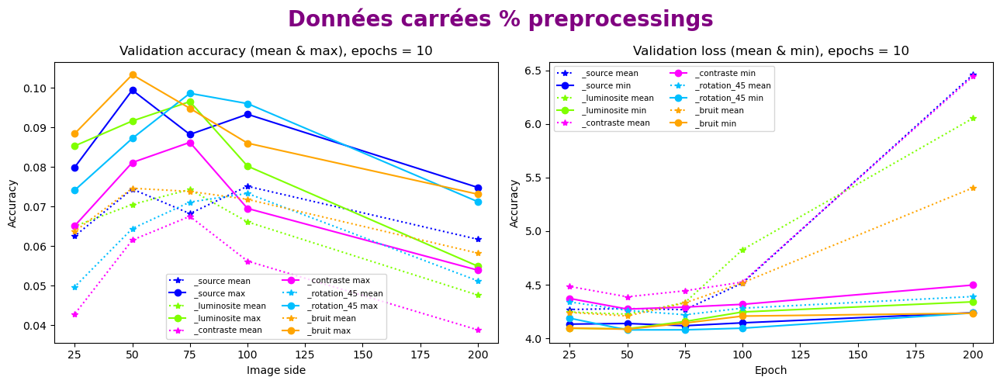

In [136]:
affichage_metriques_par_donnee(folder_history_file_in = C_DATASET_CLEANED_CARRE,
                               type_modele_DL_in      = 'CNN')

In [ ]:
##################################################################
#   Synthèse résultats - données carrées                         #
##################################################################
#
# |     type_donnees_in     |     img_side_in     | meilleur val_acc max  |
# | (type de preprocessing) | (taille côté image) |    (test accuracy)    |
# |-------------------------|---------------------|-----------------------|
# | '_source.jpg'           |                  50 |                0.0994 |
# | '_luminosite.jpg'       |                  75 |                0.0965 | 
# | '_contraste.jpg'        |                  75 |                0.0862 |
# | '_rotation_45.jpg'      |                  75 |                0.0986 |
# | '_bruit.jpg'            |                  50 |                0.1033 | <--

# 3.1.6. Synthèse % découpages & preprocessings

In [138]:
################################################
#              Synthèse résultats              #
################################################
#
# | type de découpage des données |     type_donnees_in     |     img_side_in     | meilleur val_acc max  |
# |                               | (type de preprocessing) | (taille côté image) |    (test accuracy)    |
# |-------------------------------|-------------------------|---------------------|-----------------------|
# | rectangulaires & bounding box | '_luminosite.jpg'       |                  50 |                0.1621 |
# | rectangulaires                | '_rotation_45.jpg'      |                 100 |                0.1059 |
# | carrées & bounding box        | '_luminosite.jpg'       |                  50 |                0.1684 | <--
# | carrées                       | '_bruit.jpg'            |                  50 |                0.1033 |

In [135]:
################################################################################################
# Affichage des meilleures métriques des algorithmes CNN % découpage (1 / type de découpage) : #
#    --> rectangulaire                                                                         #
#    --> bndbox & rectangulaire                                                                #
#    --> carré                                                                                 #
#    --> bndbox & carré                                                                        #
################################################################################################ 

# Couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html
def affichage_best_metrics_CNN(liste_folder_history_file_in, is_data_augmentation_in = False, epochs_in = 10):
    
    # https://matplotlib.org/stable/gallery/color/named_colors.html
    colors         = ['blue', 'red',  'orange', 'deepskyblue', 'chartreuse', 'fuchsia', 'silver']
    epochs_range   = range(epochs_in)
    type_decoupage = ''
    
    plt.figure(figsize = (14, 5)) # longueur, hauteur
    plt.suptitle('CNN : meilleure métrique / découpage', 
                 color      = 'purple', 
                 fontsize   = 20, 
                 fontweight = 'bold')
 

    # Taille du côté de l'image (carré)
    liste_img_side = [200, 100, 75, 50, 25]
    
    if (is_data_augmentation_in):
        liste_type_donnees = ['_data_augmentation_source', '_data_augmentation_carre', '_data_augmentation_luminosite', 
                              '_data_augmentation_contraste', '_data_augmentation_rotation_45', '_data_augmentation_bruit']
    else:
        liste_type_donnees = ['_source', '_carre', '_luminosite', '_contraste', '_rotation_45', '_bruit']

       
        
        
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @    Subplot 1 : training and validation accuracy   @
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    print('>' * 30, 'TRAINING & VALIDATION ACCURACY')    
    plt.subplot(1, 2, 1)
    

    # Boucle sur la liste des répertoires pour chercher la meilleure validation accuracy (1 / folder).
    for folder_history_file in liste_folder_history_file_in:

        # Initialisation
        best_val_acc        = 0
        best_type_donnees   = ''
        best_df_acc         = 0
        best_df_val_acc     = 0
        
        # Maj type_decoupage
        # Image carrée  
        if ('carre' in folder_history_file):
            # Bounding box ?
            if ('bndbox' in folder_history_file):
                type_decoupage = 'carrée & bndbox'
                ind_color      = 0
            else:
                type_decoupage = 'carrée'
                ind_color      = 1

        # Image rectangulaire
        elif ('rect' in folder_history_file):
            # Bounding box ?
            if ('bndbox' in folder_history_file):
                type_decoupage = 'rectangulaire & bndbox'
                ind_color      = 2
            else:
                type_decoupage = 'rectangulaire'
                ind_color      = 3
    
            

        # Boucle sur les types de données
        for type_donnees in liste_type_donnees:
                
            # Boucle sur la taille de l'image
            for img_side in liste_img_side:
                path = folder_history_file + 'CNN_history' + type_donnees + '_' + str(img_side) + '.csv'
                
                # Verification si fichier existe :
                # https://stacklima.com/python-verifier-si-un-fichier-ou-un-repertoire-existe/
                if (os.path.exists(path)):
                    # Chargement données entraînées
                    df = pd.read_csv(path, sep = '\t')    
#                   print(type_donnees, '\n', df)
     
                    acc      = df['acc']      # history.history['accuracy'] ....... pas utilisé ici.......
                    val_acc  = df['val_acc']  # history.history['val_accuracy']
            
                    # Recherche de la meilleure accuracy pour cette taille d'image.
                    if (round(np.mean(val_acc), 4) > best_val_acc):
                        # maj avec meilleure valeur rencontrée
                        best_val_acc = round(np.mean(val_acc), 4)
                        # Mémorisation des meilleurs acc & val_acc
                        best_df_acc         = acc
                        best_df_val_acc     = val_acc
                        best_type_donnees   = type_donnees
        
                
        print('type_decoupage =', type_decoupage, ':',
              '\n\t- best_df_acc mean\t=', round(np.mean(best_df_acc), 4), 
              '\n\t- best_df_val_acc mean\t=', round(np.mean(best_df_val_acc), 4),
              '\n\t- best_type_donnees\t=',  best_type_donnees, '\n')            
                
        # Maj labels train / val
        label_train_acc = 'training accuracy    : ' + best_type_donnees + ' - ' + type_decoupage
        label_val_acc   = 'validation accuracy : '  + best_type_donnees + ' - ' + type_decoupage
        
        plt.plot(epochs_range, best_df_acc,     color = colors[ind_color], marker = '*', linestyle = ':', 
                 label = label_train_acc)
        plt.plot(epochs_range, best_df_val_acc, color = colors[ind_color], marker = 'o', linestyle = '-', 
                 label = label_val_acc)

    plt.legend(loc = 'best', fontsize = 8.5, ncol = 1)
    plt.title('Training and validation accuracy, epochs = ' + str(epochs_in), fontsize = 14, fontweight = 'bold')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')

    
    
    
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @     Subplot 2 : Training and validation loss      @
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@    
    print('\n')
    print('>' * 30, 'TRAINING & VALIDATION LOSS')
    plt.subplot(1, 2, 2) 
    ind_colors = 0 # initialisation
    
    # Boucle sur la liste des répertoires pour chercher la meilleure validation accuracy (1 / folder).
    for folder_history_file in liste_folder_history_file_in:

        # Initialisation
        best_val_loss       = 0
        best_type_donnees   = ''
        best_df_loss        = 0
        best_df_val_loss    = 0
            
        # Maj type_decoupage
        # Image carrée  
        if ('carre' in folder_history_file):
            # Bounding box ?
            if ('bndbox' in folder_history_file):
                type_decoupage = 'carrée & bndbox'
                ind_color      = 0
            else:
                type_decoupage = 'carrée'
                ind_color      = 1

        # Image rectangulaire
        elif ('rect' in folder_history_file):
            # Bounding box ?
            if ('bndbox' in folder_history_file):
                type_decoupage = 'rectangulaire & bndbox'
                ind_color      = 2
            else:
                type_decoupage = 'rectangulaire'
                ind_color      = 3
    
            

        # Boucle sur les types de données
        for type_donnees in liste_type_donnees:
                    
            # Initialisation listes
            val_loss_mean = []
            val_loss_min  = []
          
            # Boucle sur la taille de l'image
            for img_side in liste_img_side:    
             
                path = folder_history_file + 'CNN_history' + type_donnees + '_' + str(img_side) + '.csv'
            
        
                # Verification si fichier existe :
                # https://stacklima.com/python-verifier-si-un-fichier-ou-un-repertoire-existe/
                if (os.path.exists(path)):
                    # Chargement données entraînées
                    df = pd.read_csv(path, sep = '\t')    
#                   print(type_donnees, '\n', df)
          
                    loss     = df['loss']     # history.history['loss'] ....... pas utilisé ici.......
                    val_loss = df['val_loss'] # history.history['val_loss']
            
                        
                    # Recherche de la meilleure accuracy pour cette taille d'image.
                    if (round(np.mean(val_loss), 4) > best_val_loss):
                        # maj avec meilleure valeur rencontrée
                        best_val_loss = round(np.mean(val_loss), 4)
                        # Mémorisation des meilleurs acc & val_acc
                        best_df_loss        = loss
                        best_df_val_loss    = val_loss
                        best_type_donnees   = type_donnees
        
    
        print('type_decoupage =', type_decoupage, ':', 
              '\n\t- best_df_loss mean\t=', round(np.mean(best_df_loss), 4), 
              '\n\t- best_df_val_loss mean\t=', round(np.mean(best_df_val_loss), 4),
              '\n\t- best_type_donnees\t=',  best_type_donnees, '\n')    
        
        # Maj labels train / val
        label_train_loss = 'training loss    : ' + best_type_donnees + ' - ' + type_decoupage
        label_val_loss   = 'validation loss : '  + best_type_donnees + ' - ' + type_decoupage
        
        plt.plot(epochs_range, best_df_loss,     color = colors[ind_color], marker = '*', linestyle = ':', 
                 label = label_train_loss)
        plt.plot(epochs_range, best_df_val_loss, color = colors[ind_color], marker = 'o', linestyle = '-', 
                 label = label_val_loss)
        
    plt.legend(loc = 'best', fontsize = 8.5, ncol = 1)
    plt.title('Training and validation loss, epochs = ' + str(epochs_in), fontsize = 14, fontweight = 'bold')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
        
    plt.tight_layout()
    plt.show()

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> TRAINING & VALIDATION ACCURACY
type_decoupage = rectangulaire & bndbox : 
	- best_df_acc mean	= 0.2514 
	- best_df_val_acc mean	= 0.1265 
	- best_type_donnees	= _luminosite 

type_decoupage = rectangulaire : 
	- best_df_acc mean	= 0.1622 
	- best_df_val_acc mean	= 0.0799 
	- best_type_donnees	= _rotation_45 

type_decoupage = carrée & bndbox : 
	- best_df_acc mean	= 0.1887 
	- best_df_val_acc mean	= 0.1252 
	- best_type_donnees	= _luminosite 

type_decoupage = carrée : 
	- best_df_acc mean	= 0.2176 
	- best_df_val_acc mean	= 0.0751 
	- best_type_donnees	= _source 



>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> TRAINING & VALIDATION LOSS
type_decoupage = rectangulaire & bndbox : 
	- best_df_loss mean	= 2.0884 
	- best_df_val_loss mean	= 6.2211 
	- best_type_donnees	= _luminosite 

type_decoupage = rectangulaire : 
	- best_df_loss mean	= 2.3931 
	- best_df_val_loss mean	= 6.7328 
	- best_type_donnees	= _source 

type_decoupage = carrée & bndbox : 
	- best_df_loss mean	=

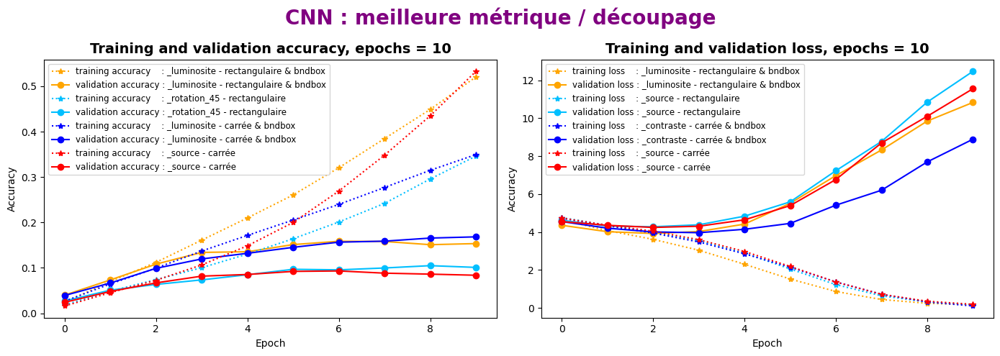

In [136]:
affichage_best_metrics_CNN(liste_folder_history_file_in = [C_BNDBOX_CLEANED_RECT, 
                                                           C_DATASET_CLEANED_RECT,
                                                           C_BNDBOX_CLEANED_CARRE, 
                                                           C_DATASET_CLEANED_CARRE],
                           is_data_augmentation_in      = False)

In [ ]:
# Nous sommes dans le cas d'un surapprentissage, car :
#   * Nous avons peu de données pour chaque race pour l'entrainement.
#   * Le modèle a du mal à généraliser sur un nouvel ensemble de données (trait continu).
# 
# Pour corriger ce problème dans le processus d'entraînement, nous allons augmenter les données et ajouter Dropout à 
# notre modèle.

# Nous prendrons les données avec les meilleurs scores (_rotation_45.jpg et _carre.jpg) et avec les données source.

# 3.2. Approche 2 - Data augmentation

In [ ]:
# https://www.tensorflow.org/tutorials/images/classification?hl=fr

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ 1. DONNEES              @ 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@

In [206]:
######################################################
# 1.2. Data augmentation                             #
######################################################
# L'augmentation des données consiste à générer des données d'entraînement supplémentaires à partir des données existantes
# en les augmentant à l'aide de transformations aléatoires qui produisent des images d'apparence crédible. 
# Cela permet d'exposer le modèle à davantage d'aspects des données et de mieux généraliser.
#
# On implémente l'augmentation des données à l'aide des couches de prétraitement Keras suivantes : 
# tf.keras.layers.RandomFlip, tf.keras.layers.RandomRotation et tf.keras.layers.RandomZoom.
# Celles-ci peuvent être incluses dans notre modèle comme d'autres couches et exécutées sur le GPU.

def data_augmentation(img_side_in):
    data_augment = keras.Sequential([layers.RandomFlip('horizontal',
                                    input_shape = (img_side_in, img_side_in, 3)),
                                    layers.RandomRotation(0.1),
                                    layers.RandomZoom(0.1)])
    
    return data_augment

In [207]:
#############################################################################
# 1.3. Visualisez les données :                                             #
# Visualisation de quelques exemples augmentés en appliquant plusieurs fois #
# l'augmentation de données à la même image                                 #
#############################################################################
def visualiser_donnees_data_augmentation(train_ds_in, data_augmentation_in):
    
    plt.figure(figsize = (9, 9)) # longueur, hauteur
    for images, labels in train_ds_in.take(1):
        first_image = images[0]
        
        for i in range(9):
            augmented_images = data_augmentation_in(tf.expand_dims(first_image, 0))            
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[0].numpy().astype('int32'))
            plt.axis('off')            

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ 2. MODELE               @ 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@

In [213]:
#######################################################################
# 2.1. Construction modèle data augmentation : création & compilation #
#######################################################################
# https://www.tensorflow.org/tutorials/images/classification?hl=fr
# https://www.kaggle.com/code/anandhuh/image-classification-using-cnn-for-beginners
def construction_modele_data_augmentation(num_classes_in, data_augmentation_in, is_affichage_in = False):
    
    #####################################################
    # Créer le modèle :                                 #
    # Régularisation des abandons dans le réseau        #    
    #####################################################
    # Une autre technique pour réduire le surajustement consiste à introduire une régularisation des abandons dans le 
    # réseau.
    # Lorsqu'on applique une suppression à une couche, elle supprime de manière aléatoire (en définissant l'activation sur
    # zéro) un certain nombre d'unités de sortie de la couche pendant le processus d'apprentissage. L'abandon prend un 
    # nombre fractionnaire comme valeur d'entrée, sous la forme de 0,1, 0,2, 0,4, etc. Cela signifie abandonner 10 %, 
    # 20 % ou 40 % des unités de sortie au hasard de la couche appliquée.
    # 
    # Créons un nouveau réseau de neurones avec tf.keras.layers.Dropout avant de l'entraîner à l'aide des images
    # augmentées :
    model = Sequential([data_augmentation_in,
                        layers.Rescaling(1./255),
                        layers.Conv2D(16, 3, padding = 'same', activation = 'relu'),
                        layers.MaxPooling2D(),
                        layers.Conv2D(32, 3, padding = 'same', activation = 'relu'),
                        layers.MaxPooling2D(),
                        layers.Conv2D(64, 3, padding = 'same', activation = 'relu'),
                        layers.MaxPooling2D(),
                        layers.Dropout(0.2),
                        layers.Flatten(),
                        layers.Dense(128, activation = 'relu'),
                        layers.Dense(num_classes_in)])



    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(optimizer = 'adam',                                                            # optimizer
                  loss      = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True), # fonction de perte
                  metrics   = ['accuracy'])                                                      # précision train / test



    #####################################################
    # Architecture du modèle                            #
    #####################################################
    # Affichage de toutes les couches du réseau
    if (is_affichage_in):
        model.summary()
    
    return model

In [214]:
###############################################################
# Regroupement des fonctions ci-dessus en une fonction unique #
###############################################################
def modele_cnn_2(img_side_in,
                 type_modele_DL_in,     # type de modèle de deep learning :
                                        # --> 'CNN'    = modèle CNN
                                        # --> 'CNN_TL' = modèle CNN transfer Learning
                 folder_images_in,
                 folder_history_file_in,
                 type_donnees_in,
                 epochs_in,
                 is_affichage_in = False):

    
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @ 1. DONNEES              @ 
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # 1.1. Découpage données train / val
    print('@' *20, '1.1. Découpage données train / val', '@' *69, '\n')
    num_classes, train_ds, val_ds = decoupage_train_test(directory_in = folder_images_in,
                                                         img_side_in  = img_side_in)


    # 1.2. Data augmentation
    data_augment = data_augmentation(img_side_in = img_side_in)
    

    # 1.3. Visualisez les données (optionnel)
    if (is_affichage_in):
        print('\n\n\n')
        print('@' *20, '1.2. Visualisez les données', '@' *76, '\n')
        visualiser_donnees_data_augmentation(train_ds_in          = train_ds,
                                             data_augmentation_in = data_augment)        


   
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @ 2. MODELE               @ 
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    print('\n\n')
    print('@' *20, '2.1. Construction modèle : création & compilation', '@' *54, '\n')
    # 2.1. Construction modèle : création & compilation
    model = construction_modele_data_augmentation(num_classes_in       = num_classes,
                                                  data_augmentation_in = data_augment,
                                                  is_affichage_in      = is_affichage_in)

    # 2.2. Entraînement et évaluation du modèle
    print('\n\n')
    print('@' *20, '2.2. Entraînement & évaluation modèle', '@' *66, '\n')
    history = entrainement_evaluation_modele(folder_history_file_in = folder_history_file_in,
                                             type_modele_DL         = type_modele_DL_in,
                                             type_donnees_in        = type_donnees_in,
                                             img_side_in            = img_side_in,
                                             train_ds_in            = train_ds, 
                                             val_ds_in              = val_ds, 
                                             model_in               = model,
                                             epochs_in              = epochs_in) 
 
        
    # Suppression_variables pour libérer de la place
    del train_ds
    del val_ds
    del model
    del history

In [ ]:
#######################################################################
# Data augmentation pour les 2 meilleurs tests accuracy :             #
#   1) type de découpage des données = rectangulaires & bounding box  #
#      type de preprocessing         = '_luminosite.jpg'              #
#   2) type de découpage des données = carrées & bounding box         #
#      type de preprocessing         = '_luminosite.jpg'              #
#######################################################################

# 3.2.1. Données rectangulaires & bounding box & preprocessing luminosité ('xxx_luminosite.jpg')

In [215]:
img_side_bndbox_rect_luminosite = 50

In [27]:
modele_cnn_2(img_side_in            = img_side_bndbox_rect_luminosite,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_RECT_IMAGES_LUMINOSITE,
             folder_history_file_in = C_BNDBOX_CLEANED_RECT,
             type_donnees_in        = '_data_augmentation_luminosite',
             epochs_in              = 15,
             is_affichage_in        = True)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

# 3.2.2. Données carrées & bounding box & preprocessing luminosité ('xxx_luminosite.jpg')

In [217]:
img_side_bndbox_carre_luminosite = 50

In [28]:
modele_cnn_2(img_side_in            = img_side_bndbox_carre_luminosite,
             type_modele_DL_in      = 'CNN',
             folder_images_in       = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE,
             folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
             type_donnees_in        = '_data_augmentation_luminosite',
             epochs_in              = 15,
             is_affichage_in        = False)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

# 3.2.3. Synthèse % découpages & preprocessings

In [ ]:
################################################
#              Synthèse résultats              #
################################################
#
# | type de découpage des données |  type_donnees_in  |  img_side_in |              meilleur val_acc max               |
# |                               |    (type de       | (taille côté |                (test accuracy)                  |
# |                               |  preprocessing)   |    image)    | sans data augmentation | avec data augmentation |
# |                               |  preprocessing)   |    image)    |       (approche 1)     |      (approche 2)      |
# |-------------------------------|-------------------|--------------|------------------------|------------------------|
# | rectangulaires & bounding box | '_luminosite.jpg' |           50 |  (epoch = 10)   0.1621 | (epoch = 15)    0.1504 |
# | carrées & bounding box        | '_luminosite.jpg' |           50 |  (epoch = 10)   0.1684 | (epoch = 15)    0.1504 |

# ==> la data augmentation n'améliore pas l'accuracy. Elle est même inférieure.
#
# Nous considérons que la meilleure test accuracy est celle de approche 1 :
#  --> type de découpage des données = carrées & bounding box
#  --> type de preprocessing         = '_luminosite.jpg'

>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> TRAINING & VALIDATION ACCURACY
type_decoupage = rectangulaire & bndbox : 
	- best_df_acc mean	= 0.1165 
	- best_df_val_acc mean	= 0.1026 
	- best_type_donnees	= _data_augmentation_luminosite 

type_decoupage = carrée & bndbox : 
	- best_df_acc mean	= 0.1182 
	- best_df_val_acc mean	= 0.1031 
	- best_type_donnees	= _data_augmentation_luminosite 



>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> TRAINING & VALIDATION LOSS
type_decoupage = rectangulaire & bndbox : 
	- best_df_loss mean	= 3.8115 
	- best_df_val_loss mean	= 3.9796 
	- best_type_donnees	= _data_augmentation_luminosite 

type_decoupage = carrée & bndbox : 
	- best_df_loss mean	= 3.7945 
	- best_df_val_loss mean	= 3.9142 
	- best_type_donnees	= _data_augmentation_luminosite 



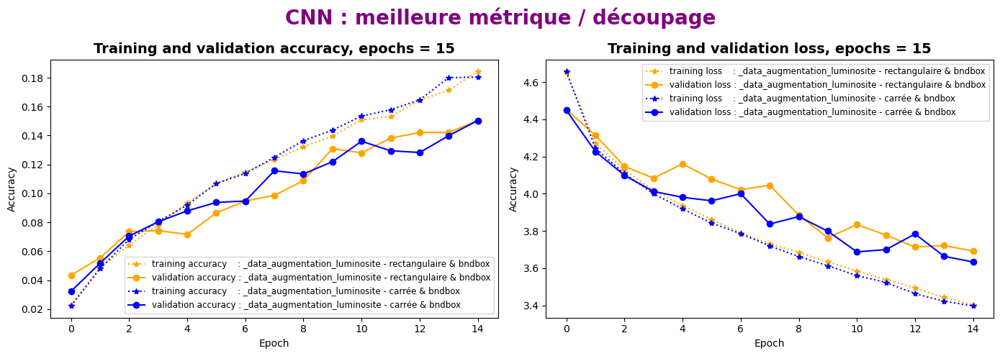

In [137]:
affichage_best_metrics_CNN(liste_folder_history_file_in = [C_BNDBOX_CLEANED_RECT, 
                                                           C_BNDBOX_CLEANED_CARRE],
                           is_data_augmentation_in      = True,
                           epochs_in                    = 15)

# 3.3. Approche 3 - Transfer learning

In [ ]:
# There are three ways to use a pre-trained model:
# --> prediction (here)
# --> feature extraction,
# --> fine-tuning.

# Here, you download the model and immediately use it to classify new images. 
# Here is an example of several pre-trained models (InceptionV3, ResNet50, VGG16) used to classify ImageNet classes. 
# ImageNet is an extensive collection of images that have been used to train models. 
# There are over 1 million images and 1000 classes in this dataset.

# 3.3.1. Fonctions communes

In [5]:
######################################################
#   Découpage données en 3 sets : train, test, val   #
######################################################
# https://www.kaggle.com/code/teyang/dog-breeds-classification-using-transfer-learning
def decoupage_train_test_val(folder_images_in, img_side_in, is_val_data_in):

    ##############################################
    # 1. Data Loading and Structure              #
    ##############################################
    # Nous prenons les données avec la meilleure test accuracy (approche 1) :
    #  --> type de découpage des données = carrées & bounding box
    #  --> type de preprocessing         = '_luminosite.jpg'
    dog_classes = os.listdir(folder_images_in)
    print('@' *20, '1. Data Loading and Structure', '@' *74, '\n')
    print('folder_images_in\t=', folder_images_in)
    print('img_side_in\t\t=', img_side_in, '\n')
    print('dog_classes[0:10] :\n', dog_classes[0:10], '\n')
    

    # Get the dog labels
    breeds = [breed.split('-',1)[1] for breed in dog_classes] # get labels by splitting the folder name at dash
    print('breeds[:10] :\n', breeds[:10], '\n') # view some of the labels


    # Then, for each of the images, we get the full path to the image (stored in X), as well as its associated 
    # label/class/breed (stored in y). This allows us to load the images easily.
    # Get images full path and their labels
    X = []
    y = []

    fullpaths = [folder_images_in + '{}'.format(dog_class) for dog_class in dog_classes]

    for counter, fullpath in enumerate(fullpaths):
        for imgname in os.listdir(fullpath):
            X.append([fullpath + '/' + imgname])
            y.append(breeds[counter])

    X = list(chain.from_iterable(X)) # unnest the lists and join together into one list

    print(len(X), 'images') # number of pictures

    
    
    ##############################################
    # 2. Shuffle Images                          #
    ##############################################
    # Here, we shuffle the images and their labels together so that they are not grouped by their breeds.
    # Random shuffle the images for learning

    print('\n\n')
    print('@' *20, '2. Shuffle Images', '@' *86, '\n')
    # shuffle X and y
    combined = list(zip(X, y))
    random.shuffle(combined)

    X[:], y[:] = zip(*combined)

    
    
    
    ##############################################
    # 3. Subset Data                             #
    ##############################################
    # Subset pour tester le code si sur PC (sinon problème de mémoire). 
    if (C_EXECUTION_SUR_GOOGLE_COLAB == False):
        print('\n\n')
        print('@' *20, '3. Subset Data', '@' *89, '\n')        
        X = X[:4000]
        y = y[:4000]
    else:
        print('\n\n')
        print('@' *20, '3. Colab => Use all Data', '@' *81, '\n')

        
        
    ##############################################
    # 4. Encoding Data                           #
    ##############################################
    # It is also very important that we encode the classes/breeds. 
    # Here we will use one-hot encoding, so that for each image, there will be 120 columns, with all but 1 column with a 
    # value of 0. The only column with a value of 1 is the image's associated class/breed/label.
    
    print('\n\n')
    print('@' *20, '4. Encoding Data', '@' *87, '\n') 
    
    # Convert labels to one-hot encoded labels
    # Label and one-hot encoding y labels
    le = LabelEncoder()
    le.fit(y)
    y_ohe = to_categorical(le.transform(y), len(breeds))
    y_ohe = np.array(y_ohe)



    
    ##############################################
    # 5. Preparing Train, Validation & Test Data #
    ##############################################
    print('\n\n')
    print('@' *20, '5. Preparing Train, Validation & Test Data ', '@' *60, '\n')
    
    # long
    img_data = np.array([img_to_array(load_img(img, target_size = (img_side_in, img_side_in)))
                         for img in X]) # load, resize images, and store as array

    X_train, X_test, y_train, y_test = train_test_split(img_data, y_ohe,
                                                        test_size    = 0.2,
                                                        stratify     = np.array(y), # stratify makes sure that proportion 
                                                                                    # of each class in the output is same
                                                                                    # as the input
                                                        random_state = 2) 

    if (is_val_data_in):
        X_train, X_val, y_train, y_val = train_test_split(X_train, y_train,
                                                          test_size    = 0.2,
                                                          stratify     = np.array(y_train),
                                                          random_state = 2)
    
    print('Dataset size :')
    print('\t- Training\t:', X_train.shape)
    if (is_val_data_in):
        print('\t- Validation\t:', X_val.shape)
    print('\t- Testing\t:', X_test.shape)
    print('\nLabel size :')    
    print('\t- Training\t:', y_train.shape)
    if (is_val_data_in):
        print('\t- Validation\t:', y_val.shape)
    print('\t- Testing\t:', y_test.shape)

    # clear some space from memory
    import gc
    del img_data
    gc.collect()
    
    if (is_val_data_in):
        return X_train, X_test, X_val, y_train, y_test, y_val, breeds, le
    else:
        return X_train, X_test, y_train, y_test, breeds, le

In [6]:
#####################################################
# Data Augmentation                                 #
#####################################################
def data_augmentation_tl(X_train_in, y_train_in, X_val_in, y_val_in, batch_size_in):
    
    # Create train generator
    train_datagen = ImageDataGenerator(preprocessing_function = preprocess_input, # only use rescale=1./255 
                                                                                  # if training from scratch
                                       rotation_range         = 30,
                                       width_shift_range      = 0.2,
                                       height_shift_range     = 0.2,
                                       horizontal_flip        = True) # CHECK

    train_generator = train_datagen.flow(X_train_in, 
                                         y_train_in,
                                         shuffle    = False, 
                                         batch_size = batch_size_in, 
                                         seed       = 1)

    # Create validation generator
    val_datagen = ImageDataGenerator(preprocessing_function = preprocess_input) # do not augment validation data

    val_generator = val_datagen.flow(X_val_in, 
                                     y_val_in,
                                     shuffle    = False, 
                                     batch_size = batch_size_in, 
                                     seed       = 1)

    return train_datagen, train_generator, val_generator

In [6]:
#####################################################
# Visualiser données augmentees                     #
#####################################################
def visualiser_donnees_augmentees(X_train_in, y_train_in, train_datagen_in, batch_size_in):

    # Exemple sur une image
    img_id = 16

    dog_generator = train_datagen.flow(X_train_in[img_id:img_id+1], 
                                       y_train_in[img_id:img_id+1],
                                       shuffle    = False, 
                                       batch_size = batch_size_in, 
                                       seed       = 1)

    plt.figure(figsize = (30, 20))
    dogs = [next(dog_generator) for i in range(0, 5)]
    for counter, dog in enumerate(dogs): 
        plt.imshow(dog[0][0])    
#        plt.axis('off')
    
    plt.show()

In [24]:
#####################################################
# Construction modèle                               #
#####################################################
def construction_modele_tl(pre_trained_model_in, breeds_in, is_affichage_in = False):
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_in) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.3))
    model.add(Dense(512, activation = 'relu'))
    model.add(Dense(512, activation = 'relu'))
    model.add(Dense(len(breeds_in), activation = 'softmax'))


    # Freeze pre-trained layers
    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))

    

    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(Adam(learning_rate = .0001),                   
                  loss    = 'categorical_crossentropy',
                  metrics = ['accuracy']) 

 
    
    #####################################################
    # Architecture du modèle                            #
    #####################################################
    # Affichage de toutes les couches du réseau
    if (is_affichage_in):
        model.summary()
    
    return model

In [98]:
#####################################################
# Entraînement et évaluation du modèle              #
#####################################################
def entrainement_evaluation_modele_tl(folder_history_file_in, type_modele_DL_in, type_donnees_in, img_side_in, \
                                      X_train_in, X_val_in, \
                                      train_generator_in, val_generator_in, \
                                      model_in, batch_size_in, epochs_in = 20):

    # Start the stopwatch / counter
    time_start_sec = perf_counter()
    
    train_steps_per_epoch = X_train_in.shape[0] // batch_size_in
    val_steps_per_epoch   = X_val_in.shape[0] // batch_size_in


    history = model_in.fit_generator(train_generator_in,
                                     steps_per_epoch  = train_steps_per_epoch,
                                     validation_data  = val_generator_in,
                                     validation_steps = val_steps_per_epoch,
                                     epochs           = epochs_in,
                                     verbose          = 1)

    # Détail valeurs history (qui seront tracées plus tard)
    print('\nhistory\t=', history.history, '\n')
    
        
    acc      = history.history['accuracy']
    val_acc  = history.history['val_accuracy'] 
    loss     = history.history['loss']
    val_loss = history.history['val_loss']
    
    print('acc =', acc, '\n')
    print('val_acc =', val_acc, '\n')
    print('loss =', loss, '\n')
    print('val_loss =', val_loss, '\n')    
    


    # Enregistrement dans un fichier (alléger la mémoire).
    # https://datatofish.com/list-to-dataframe/
    # https://stacklima.com/creer-un-dataframe-pandas-a-partir-de-listes/    
    # Calling DataFrame constructor after zipping both lists, with columns specified
    df = pd.DataFrame(list(zip(acc, val_acc, loss, val_loss)),
                      columns = ['acc', 'val_acc', 'loss', 'val_loss'])
    
        
    nom_fichier = folder_history_file_in + type_modele_DL_in + '_history' + type_donnees_in + '_' + str(img_side_in) + '.csv'
    print('==> enregistrement dataframe dans fichier', nom_fichier, ':')
    print(df)
    
    df.to_csv(nom_fichier, sep = '\t', header = True, index = False)
    
    
    

    #############################################
    #             Evaluation modèle             #
    #############################################
    # https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/    
    print('\n\nEvaluation modèle img_side_in =', img_side_in, ':')    
    print('\t- val_acc mean\t=', round(np.mean(val_acc), 4))
    print('\t- val_acc max\t=', round(np.max(val_acc), 4))
    
    print('\t- val_loss mean\t=', round(np.mean(val_loss), 4))
    print('\t- val_loss min\t=', round(np.min(val_loss), 4), '\n') 
    


    # Stop the stopwatch / counter
    time_stop_sec = perf_counter()
    
    # Affichage durée programme
    affichage_duree_programme(time_start_sec = time_start_sec, 
                              time_stop_sec  = time_stop_sec)
    
    return history

In [36]:
###############################################################
# Regroupement des fonctions ci-dessus en une fonction unique #
###############################################################
def modele_transfer_learning(img_side_in,
                             type_modele_DL_in,
                             folder_images_in,
                             folder_history_file_in, 
                             type_donnees_in,
                             data_augmentation_in,
                             pre_trained_model_in,
                             epochs_in,
                             is_affichage_in = False):
    
    batch_size = 32

    print('img_side_in\t\t=', img_side_in,
          '\ntype_modele_DL_in\t=', type_modele_DL_in,
          '\nfolder_images_in\t=', folder_images_in,
          '\nfolder_history_file_in\t=', folder_history_file_in,
          '\ntype_donnees_in\t\t=', type_donnees_in,
          '\ndata_augmentation_in\t=', data_augmentation_in,
          '\nepochs_in\t\t=', epochs_in)
     
    
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @ 1. DONNEES              @ 
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # 1.1. Découpage données en 3 sets : train, test, val
    print('\n\n\n')    
    print('@' *20, '1.1. Découpage données train / test / val', '@' *62, '\n')
    X_train, X_test, X_val, y_train, y_test, y_val, breeds, le = \
    decoupage_train_test_val(folder_images_in = folder_images_in, 
                             img_side_in      = img_side_in,
                             is_val_data_in   = True)                             

    # => Le dataset comprend :
    #  - pour l'entraînement : 2560 images (PC) / 13171 images (colab).
    #  - pour la validation  : 640 images (PC)  / 3293 image (colab).
    #  - pour le test        : 800 images (PC)  / 4116 images (colab).

    # Chaque image a comme dimension img_side_in x img_side_in, avec 3 channels, representant les channels RGB.


    # Data augmentation
    if (data_augmentation_in):
        print('\n\n\n')
        print('@' *20, '1.2. Data augmentation', '@' *81, '\n')        
        train_datagen, train_generator, val_generator = data_augmentation_tl(X_train_in    = X_train, 
                                                                             y_train_in    = y_train,
                                                                             X_val_in      = X_val,
                                                                             y_val_in      = y_val, 
                                                                             batch_size_in = batch_size)
    
        # 1.2. Visualisez les données augmentées (optionnel)
        if (is_affichage_in):
            print('\n\n\n')
            print('@' *20, '1.3. Visualisez les données', '@' *76, '\n')
            visualiser_donnees_augmentees(X_train_in       = X_train_in, 
                                          y_train_in       = y_train_in, 
                                          train_datagen_in = train_datagen,
                                          batch_size_in    = batch_size)


    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @ 2. MODELE               @ 
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@
    print('\n\n')
    print('@' *20, '2.1. Construction modèle : création & compilation', '@' *54, '\n')
    # 2.1. Construction modèle : création & compilation
    model = construction_modele_tl(pre_trained_model_in = pre_trained_model_in,
                                   breeds_in            = breeds,
                                   is_affichage_in      = is_affichage_in)


    # 2.2. Entraînement et évaluation du modèle
    print('\n\n')
    print('@' *20, '2.2. Entraînement & évaluation modèle', '@' *66, '\n')
    history = entrainement_evaluation_modele_tl(folder_history_file_in = folder_history_file_in, 
                                                type_modele_DL_in      = type_modele_DL_in,
                                                type_donnees_in        = type_donnees_in,
                                                img_side_in            = img_side_in,
                                                X_train_in             = X_train, 
                                                X_val_in               = X_val, 
                                                train_generator_in     = train_generator, 
                                                val_generator_in       = val_generator,
                                                model_in               = model, 
                                                batch_size_in          = batch_size, 
                                                epochs_in              = epochs_in)
        
    # Suppression_variables pour libérer de la place
    del X_train, X_test, X_val, y_train, y_test, y_val
    del model
    del history

In [40]:
# Variables communes aux modèles pré-entraînés
# Nous considérons que la meilleure test accuracy est celle de approche 1 :
#  --> type de découpage des données = carrées & bounding box
#  --> type de preprocessing         = '_luminosite.jpg'

folder_source_best       = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE
folder_history_file_best = C_BNDBOX_CLEANED_CARRE
type_donnees_best        = '_luminosite'
img_side_best            = 200 # 75 minimum pour InceptionV3 pre-trained model. Sinon : 
                               # ValueError: Input size must be at least 75x75; Received: input_shape=(50, 50, 3)
epochs                   = 70

# 3.3.2. Modèle pré-entraîné InceptionV3

In [ ]:
# https://www.kaggle.com/code/teyang/dog-breeds-classification-using-transfer-learning
# https://www.kaggle.com/code/crilom/stanford-dogs-with-transfer-learning

In [41]:
# Modèle pré-entraîné InceptionV3
pre_trained_model_inceptionv3 = InceptionV3(weights     = 'imagenet', 
                                            include_top = False, 
                                            input_shape = (img_side_best, img_side_best, 3))

In [47]:
modele_transfer_learning(img_side_in            = img_side_best,
                         type_modele_DL_in      = 'CNN_TL_InceptionV3',          # Modèle CNN Transfer Learning
                         folder_images_in       = folder_source_best,
                         folder_history_file_in = folder_history_file_best, 
                         type_donnees_in        = type_donnees_best,
                         data_augmentation_in   = True,
                         pre_trained_model_in   = pre_trained_model_inceptionv3,
                         epochs_in              = epochs,
                         is_affichage_in        = False)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
##################################################################
#   Synthèse résultats - Algorithme pré-entraîné InceptionV3     #
##################################################################
#
# |     img_side_in     | epochs | meilleur val_acc max  |
# | (taille côté image) |        |  - (test accuracy)    |
# |---------------------|--------|-----------------------|
# |                 100 |     40 |                0.4031 |
# |                 100 |     70 |                0.4203 |
# |                  75 |     70 |                0.2609 |
# |                 200 |     70 |                0.8125 | <--

# 3.3.3. Modèle pré-entraîné ResNet50

In [ ]:
# https://neptune.ai/blog/transfer-learning-guide-examples-for-images-and-text-in-keras
# https://www.kaggle.com/code/samshenvi/stanford-dogs-resnet50

In [46]:
# Modèle pré-entraîné ResNet50
pre_trained_model_resnet50 = ResNet50(weights     = 'imagenet', 
                                      include_top = False, 
                                      input_shape = (img_side_best, img_side_best, 3))

In [29]:
modele_transfer_learning(img_side_in            = img_side_best,
                         type_modele_DL_in      = 'CNN_TL_ResNet50',         # Modèle CNN Transfer Learning
                         folder_images_in       = folder_source_best,
                         folder_history_file_in = folder_history_file_best, 
                         type_donnees_in        = type_donnees_best,
                         data_augmentation_in   = True,
                         pre_trained_model_in   = pre_trained_model_resnet50,
                         epochs_in              = epochs,                         
                         is_affichage_in        = False)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
##################################################################
#   Synthèse résultats - Algorithme pré-entraîné ResNet50        #
##################################################################
#
# |     img_side_in     | epochs | meilleur val_acc max  |
# | (taille côté image) |        |  - (test accuracy)    |
# |---------------------|--------|-----------------------|
# |                 200 |     70 |                0.0469 | <--

# 3.3.4. Modèle pré-entraîné VGG-16

In [ ]:
# https://openclassrooms.com/fr/courses/4470531-classez-et-segmentez-des-donnees-visuelles/5097666-tp-implementez-votre-premier-reseau-de-neurones-avec-keras
# https://www.kaggle.com/code/twhitehurst3/stanford-dogs-keras-vgg16 : étapes + mettre commentaires

In [49]:
# Modèle pré-entraîné VGG-16
pre_trained_model_vgg16 = VGG16(weights     = 'imagenet', 
                                include_top = False, 
                                input_shape = (img_side_best, img_side_best, 3))

In [30]:
modele_transfer_learning(img_side_in            = img_side_best,
                         type_modele_DL_in      = 'CNN_TL_VGG16',           # Modèle CNN Transfer Learning
                         folder_images_in       = folder_source_best,
                         folder_history_file_in = folder_history_file_best, 
                         type_donnees_in        = type_donnees_best,
                         data_augmentation_in   = True,
                         pre_trained_model_in   = pre_trained_model_vgg16,
                         epochs_in              = epochs,                         
                         is_affichage_in        = False)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
##################################################################
#     Synthèse résultats - Algorithme pré-entraîné VGG-16        #
##################################################################
#
# |     img_side_in     | epochs | meilleur val_acc max  |
# | (taille côté image) |        |  - (test accuracy)    |
# |---------------------|--------|-----------------------|
# |                 200 |     70 |                0.4469 | <--

# 3.3.5. Synthèse % modèles pré-entraînés

In [ ]:
#################################################################################
# Synthèse résultats pour les données la meilleure test accuracy (approche 1) : #
#    --> type de découpage des données = carrées & bounding box                 #
#    --> type de preprocessing         = '_luminosite.jpg'                      #
#################################################################################
#
# | Modèle pré-entrainé |     img_side_in     | epochs | meilleur val_acc max  |
# |                     | (taille côté image) |        |    (test accuracy)    |
# |---------------------|---------------------|--------|-----------------------|
# | InceptionV3         |                 200 |     70 |                0.8125 | <--
# | ResNet50            |                 200 |     70 |                0.0469 |
# | VGG-16              |                 200 |     70 |                0.4469 |

In [131]:
###################################################################################
# Affichage des meilleures métriques des algorithmes Transfer Learning % modèle : #
#    --> rectangulaire                                                            #
#    --> bndbox & rectangulaire                                                   #
#    --> carré                                                                    #
#    --> bndbox & carré                                                           #
################################################################################### 

# Couleurs : https://matplotlib.org/stable/gallery/color/named_colors.html
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html
def affichage_best_metrics_TL(folder_history_file_in, type_modele_TL_in, epochs_in = 10):
    
    # https://matplotlib.org/stable/gallery/color/named_colors.html
    colors         = ['blue', 'fuchsia', 'deepskyblue', 'orange', 'red', 'silver']
    epochs_range   = range(epochs_in)
    type_decoupage = ''
    ind_color      = 0
    

    # Taille du côté de l'image (carré)
    liste_img_side     = [200, 100, 75, 50, 25]
    liste_type_donnees = ['_source', '_carre', '_luminosite', '_contraste', '_rotation_45', '_bruit']

       
    # Maj type_decoupage
    # Image carrée  
    if ('carre' in folder_history_file_in):
        # Bounding box ?
        if ('bndbox' in folder_history_file_in):
            type_decoupage = 'carrée & bndbox'
        else:
            type_decoupage = 'carrée'
    
    # Image rectangulaire
    elif ('rect' in folder_history_file_in):
        # Bounding box ?
        if ('bndbox' in folder_history_file_in):
            type_decoupage = 'rectangulaire & bndbox'
        else:
            type_decoupage = 'rectangulaire'
                
                
    plt.figure(figsize = (14, 5)) # longueur, hauteur
    plt.suptitle('CNN Transfer Learning : meilleure métrique (' + type_decoupage + ') / modèle',
                 color      = 'purple',
                 fontsize   = 20,
                 fontweight = 'bold')
    
    
        
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @    Subplot 1 : training and validation accuracy   @
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    plt.subplot(1, 2, 1)
    
    # Boucle sur le type d'algorithme de transfer learning (CNN_TL_xxx)
    for type_modele_TL in type_modele_TL_in:
            
       # Boucle sur les types de données
        for type_donnees in liste_type_donnees:
                
            # Boucle sur la taille de l'image
            for img_side in liste_img_side:
                path = folder_history_file_in + type_modele_TL + '_history' + type_donnees + '_' + str(img_side) + '.csv'
                
                # Verification si fichier existe :
                # https://stacklima.com/python-verifier-si-un-fichier-ou-un-repertoire-existe/
                if (os.path.exists(path)):
                    # Chargement données entraînées
                    df = pd.read_csv(path, sep = '\t')    
#                   print(type_donnees, '\n', df)
     
                    acc      = df['acc']      # history.history['accuracy'] ....... pas utilisé ici.......
                    val_acc  = df['val_acc']  # history.history['val_accuracy']
            
                    # Maj modèle de transfer learning
                    type_model_tl = type_modele_TL[7:len(type_modele_TL)] # on enlève CNN_TL      

                    # Maj labels train / val
                    label_train_acc = 'training accuracy    : ' + type_model_tl + ' - ' + type_donnees
                    label_val_acc   = 'validation accuracy : '  + type_model_tl + ' - ' + type_donnees
        
                    plt.plot(epochs_range, acc,     color = colors[ind_color], marker = '*', linestyle = ':', 
                             label = label_train_acc)
                    plt.plot(epochs_range, val_acc, color = colors[ind_color], marker = 'o', linestyle = '-', 
                             label = label_val_acc)
                    ind_color = ind_color + 1
                    
        
    plt.legend(loc = 'lower right', fontsize = 8.5, ncol = 1)
    plt.title('Training and validation accuracy, epochs = ' + str(epochs_in), fontsize = 14, fontweight = 'bold')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')

    
    
    
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
    # @     Subplot 2 : Training and validation loss      @
    # @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@    
    plt.subplot(1, 2, 2) 
    ind_color = 0 # initialisation
    
    # Boucle sur le type d'algorithme de transfer learning (CNN_TL_xxx)
    for type_modele_TL in type_modele_TL_in:        

       # Boucle sur les types de données
       for type_donnees in liste_type_donnees:
                    
           # Boucle sur la taille de l'image
           for img_side in liste_img_side:    
             
                path = folder_history_file_in + type_modele_TL + '_history' + type_donnees + '_' + str(img_side) + '.csv'
            
        
                # Verification si fichier existe :
                # https://stacklima.com/python-verifier-si-un-fichier-ou-un-repertoire-existe/
                if (os.path.exists(path)):
                   # Chargement données entraînées
                    df = pd.read_csv(path, sep = '\t')    
#                   print(type_donnees, '\n', df)
          
                    loss     = df['loss']     # history.history['loss'] ....... pas utilisé ici.......
                    val_loss = df['val_loss'] # history.history['val_loss']
                
                    # Maj modèle de transfer learning
                    type_model_tl = type_modele_TL[7:len(type_modele_TL)] # on enlève CNN_TL
        
                    # Maj labels train / val
                    label_train_loss = 'training loss    : ' + type_model_tl + ' -' + type_donnees
                    label_val_loss   = 'validation loss : '  + type_model_tl + ' -' + type_donnees

                    plt.plot(epochs_range, loss,     color = colors[ind_color], marker = '*', linestyle = ':', 
                             label = label_train_loss)
                    plt.plot(epochs_range, val_loss, color = colors[ind_color], marker = 'o', linestyle = '-', 
                             label = label_val_loss)
                    ind_color = ind_color + 1
        
    plt.legend(loc = 'center right', fontsize = 8.5, ncol = 1)
    plt.title('Training and validation loss, epochs = ' + str(epochs_in), fontsize = 14, fontweight = 'bold')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
        
    plt.tight_layout()
    plt.show()

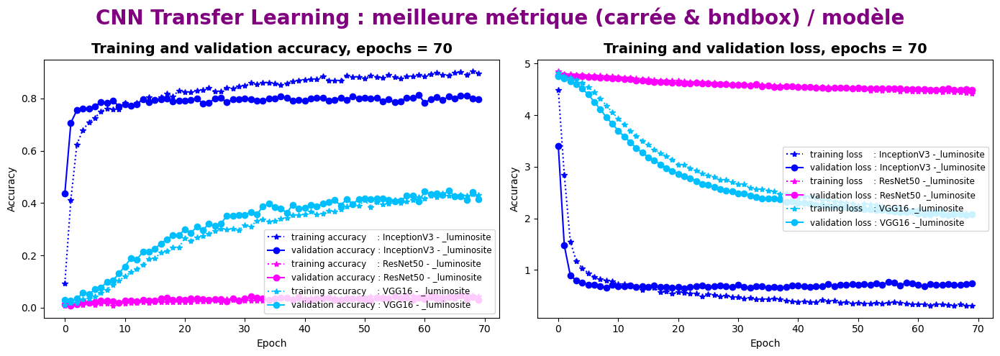

In [132]:
affichage_best_metrics_TL(folder_history_file_in = C_BNDBOX_CLEANED_CARRE,
                          type_modele_TL_in      = ['CNN_TL_InceptionV3', 'CNN_TL_ResNet50', 'CNN_TL_VGG16'],
                          epochs_in              = epochs)

# 3.4. Approche 5 - Optimisation hyperparamètres Transfer learning

# 3.4.1. Fonctions communes

In [ ]:
# https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/
# https://www.kaggle.com/code/mellonixie/image-classification-cnn-hyperparameter-tuning
# https://www.geeksforgeeks.org/hyperparameter-tuning-using-gridsearchcv-and-kerasclassifier/
# https://www.kaggle.com/code/sohaibanwaar1203/hyperparameter-tunning-and-cnn-visualization
# https://www.kaggle.com/code/aaryandhore/neural-network-gridsearchcv-explanations
# https://deeplylearning.fr/cours-theoriques-deep-learning/reglages-des-hyper-parametres/ : grid search CV
# https://www.kaggle.com/code/mellonixie/image-classification-cnn-hyperparameter-tuning

In [ ]:
# https://yannicksergeobam.medium.com/optimiser-les-hyperparam%C3%A8tres-dun-mod%C3%A8le-de-deep-learning-d65643141282
#
# On distingue 3 types d’hyperparamètres pour les réseaux de neurones profonds :
#  --> Les hyperparamètres des layers.
#  --> Les hyperparamètres de compilation du modèle.
#  --> Les hyperparamètres d’exécution du modèle : batch size, nombre d’epochs.
#
# L’optimisation des hyperparamètres améliore les performances, la vitesse et la qualité des modèles d’apprentissage 
# profond. Il existe plusieurs techniques :
#  --> Des techniques de base telles que Grid Search (la recherche en grille), Random Search (la recherche aleatoire). 
#  --> Des techniques plus sophistiquées telles que l’optimisation bayésienne (Keras Tuner) et
#      Hyperbande (tableau de bord HParams dans TensorBoad). 
#      Nous allons utiliser ces méthodes.

In [ ]:
# Rappel critères meilleure test accuracy (val_acc max = 0.8125) :
#    --> type de découpage des données = carrées & bounding box
#    --> type de preprocessing         = '_luminosite.jpg'
#    --> type modèle deep learning     = CNN transfer Learning
#    --> modèle pré-entrainé           = InceptionV3
#    --> img_side (taille côté image)  = 200
#    --> epochs                        = 70

In [7]:
# Paramètres fixes pour grid search (car meilleurs scores)
folder_source_gs       = C_BNDBOX_CLEANED_CARRE_IMAGES_LUMINOSITE
folder_history_file_gs = C_BNDBOX_CLEANED_CARRE
type_donnees_gs        = '_luminosite'
img_side_gs            = 200 # 75 minimum pour InceptionV3 pre-trained model. Sinon : 
                             # ValueError: Input size must be at least 75x75; Received: input_shape=(50, 50, 3)

In [8]:
# Paramètres à faire évoluer plus tard (hyperparamètres)
epochs_gs     = 20
batch_size_gs = 32

In [9]:
# Modèle pré-entraîné InceptionV3
pre_trained_model_inceptionv3 = InceptionV3(weights     = 'imagenet', 
                                            include_top = False, 
                                            input_shape = (img_side_gs, img_side_gs, 3))

In [10]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ 1. DONNEES              @ 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# 1.1. Découpage données en 3 sets : train, test, val
print('@' *20, '1.1. Découpage données train / test / val', '@' *62, '\n')
X_train_gs, X_test_gs, X_val_gs, y_train_gs, y_test_gs, y_val_gs, breeds_gs, le_gs = \
decoupage_train_test_val(folder_images_in = folder_source_gs, 
                         img_side_in      = img_side_gs,
                         is_val_data_in   = True)

# => Le dataset comprend :
#  - pour l'entraînement : 2560 images (PC) / 13171 images (colab).
#  - pour la validation  : 640 images (PC)  / 3293 image (colab).
#  - pour le test        : 800 images (PC)  / 4116 images (colab).

# Chaque image a comme dimension img_side_in x img_side_in, avec 3 channels, representant les channels RGB.

@@@@@@@@@@@@@@@@@@@@ 1.1. Découpage données train / test / val @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 

@@@@@@@@@@@@@@@@@@@@ 1. Data Loading and Structure @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 

folder_images_in	= ./data/bndbox_cleaned_carre/Images_luminosite/
img_side_in		= 200 

dog_classes[0:10] :
 ['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound'] 

breeds[:10] :
 ['Chihuahua', 'Japanese_spaniel', 'Maltese_dog', 'Pekinese', 'Shih-Tzu', 'Blenheim_spaniel', 'papillon', 'toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound'] 

20580 images



@@@@@@@@@@@@@@@@@@@@ 2. Shuffle Images @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 




@@@@@@@@@@@@@@@@@@@@ 3. Subset Data @@@@@@@@@@@@@@@@

In [11]:
# Data augmentation (systématique)
print('@' *20, '1.2. Data augmentation', '@' *81, '\n')
train_datagen_gs, train_generator_gs, val_generator_gs = data_augmentation_tl(X_train_in    = X_train_gs, 
                                                                              y_train_in    = y_train_gs,
                                                                              X_val_in      = X_val_gs,
                                                                              y_val_in      = y_val_gs, 
                                                                              batch_size_in = batch_size_gs)

@@@@@@@@@@@@@@@@@@@@ 1.2. Data augmentation @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@ 



In [12]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ 2. MODELE               @ 
# @@@@@@@@@@@@@@@@@@@@@@@@@@@
# Entraînement et évaluation du modèle              
def entrainement_evaluation_modele_gs(X_train_in, X_val_in, \
                                      train_generator_in, val_generator_in, \
                                      model_in, batch_size_in, epochs_in, is_history = False):
    
    train_steps_per_epoch = X_train_in.shape[0] // batch_size_gs
    val_steps_per_epoch   = X_val_in.shape[0] // batch_size_gs
    
    history = model_in.fit_generator(train_generator_in,
                                     steps_per_epoch  = train_steps_per_epoch,
                                     validation_data  = val_generator_in,
                                     validation_steps = val_steps_per_epoch,
                                     epochs           = epochs_gs)
        
    # Détail valeurs history (qui seront tracées plus tard)
    print('\nhistory\t=', history.history, '\n')
    
        
    acc      = history.history['accuracy']
    val_acc  = history.history['val_accuracy'] 
    loss     = history.history['loss']
    val_loss = history.history['val_loss']
    
    print('acc =', acc, '\n')
    print('val_acc =', val_acc, '\n')
    print('loss =', loss, '\n')
    print('val_loss =', val_loss, '\n')    

    val_acc_mean  = round(np.mean(val_acc), 4)
    val_acc_max   = round(np.max(val_acc), 4)
    val_loss_mean = round(np.mean(val_loss), 4)
    val_loss_min  = round(np.min(val_loss), 4)
            
            
    #############################################
    #             Evaluation modèle             #
    #############################################
    # https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/    
    print('Evaluation modèle :')    
    print('\t- val_acc mean\t=', val_acc_mean)
    print('\t- val_acc max\t=', val_acc_max)
    print('\t- val_loss mean\t=', val_loss_mean)
    print('\t- val_loss min\t=', val_loss_min, '\n') 
    
    
    if (is_history):
        return val_acc_max, history
    else:
        return val_acc_max

# 3.4.2. Hyperparamètres des layers

In [13]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   OPTIMISATION HYPERPARAMETRES DES LAYERS (1)       @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#   --> dropout_rate
#   --> weight constraint
# For the best results, dropout is best combined with weight constraint.
#####################################################
# Construction modèle                               #
#####################################################
def create_model_layer_1(dropout_rate, weight_constraint):
    
    print('@' * 20, ' create_model_layer_1 : dropout_rate =', dropout_rate, ', weight_constraint =', weight_constraint,
          '@' * 20)
         
        
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(dropout_rate))
    model.add(Dense(512, activation = 'relu', kernel_constraint = MaxNorm(weight_constraint)))
    model.add(Dense(512, activation = 'relu', kernel_constraint = MaxNorm(weight_constraint)))
    model.add(Dense(len(breeds_gs), activation = 'softmax'))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))

    
    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(Adam(learning_rate = .0001),                   
                  loss    = 'categorical_crossentropy',
                  metrics = ['accuracy'])
    
    return model    

In [14]:
# https://stackoverflow.com/questions/47279677/how-use-grid-search-with-fit-generator-in-keras
##################################################################
# Entraînement et évaluation du modèle pour chaque hypeparamètre #
##################################################################
def fit_model_layer_1(dropout_rate, weight_constraint):
    # initialisation
    best_val_acc_max = 0 # meilleur validation accuracy
        
    print('dropout_rate =', dropout_rate, ', weight_constraint =', weight_constraint, '\n')

    for dropout_rate_ in dropout_rate:
        for weight_constraint_ in weight_constraint:
#            print('dropout_rate_ =', dropout_rate_, ', weight_constraint_ =', weight_constraint_)
            model_layer_1 = create_model_layer_1(dropout_rate      = dropout_rate_, 
                                                 weight_constraint = weight_constraint_)
            
            val_acc_max = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                            X_val_in           = X_val_gs, 
                                                            train_generator_in = train_generator_gs,
                                                            val_generator_in   = val_generator_gs, 
                                                            model_in           = model_layer_1, 
                                                            batch_size_in      = batch_size_gs, 
                                                            epochs_in          = epochs_gs)
                
                
            # enregistrement des meilleurs hyperparamètres rencontrés
            if (val_acc_max > best_val_acc_max):
                best_val_acc_max       = val_acc_max # mise à jour meilleur validation accuracy
                best_dropout_rate      = dropout_rate_
                best_weight_constraint = weight_constraint_
                print('best_val_acc_max =', best_val_acc_max, 'avec dropout_rate =', best_dropout_rate,
                     ', weight_constraint =', best_weight_constraint)
       
            print('\n\n', '>' * 125, '\n\n')
        
    return best_val_acc_max, best_dropout_rate, best_weight_constraint

In [32]:
# Start the stopwatch / counter
time_start_sec = perf_counter()
    
best_val_acc_max, best_dropout_rate, best_weight_constraint = \
fit_model_layer_1(dropout_rate      = [0.1, 0.3, 0.7], # valeur utilisée pour modèle pré-entraîné = 0.3
                  weight_constraint = [None, 1.0])     # valeur utilisée pour modèle pré-entraîné = None

print('\n\nSYNTHESE ==> best_val_acc_max =', best_val_acc_max, 'avec dropout_rate =', best_dropout_rate,
      ', weight_constraint =', best_weight_constraint)

# Stop the stopwatch / counter
time_stop_sec = perf_counter()
    
# Affichage durée programme
affichage_duree_programme(time_start_sec = time_start_sec, 
                          time_stop_sec  = time_stop_sec)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [..]
# SYNTHESE ==> best_val_acc_max = 0.8156 avec dropout_rate = 0.3 , weight_constraint = None
# Durée programme (start : 3334.003 --> stop : 14459.801 ) = 11125.798 sec ou 185.430 min

[..]
SYNTHESE ==> best_val_acc_max = 0.8156 avec dropout_rate = 0.3 , weight_constraint = None
Durée programme (start : 3334.003 --> stop : 14459.801 ) = 11125.798 sec ou 185.430 min


In [ ]:
####################################################################
# Synthèse résultats - OPTIMISATION HYPERPARAMETRES DES LAYERS (1) #
#   --> dropout_rate      = [0.1, 0.3, 0.7]                        #
#   --> weight constraint = [None, 1.0]                            #
####################################################################
#
# | dropout_rate | weight_constraint |          best_val_acc_max          |
# |              |                   |           (test accuracy)          |
# |              |                   | --- essai 1 ---- | --- essai 2 --- |
# |--------------|-------------------|------------------|-----------------|
# |          0.1 |              None |       0.8188     |      0.8125     |
# |          0.1 |               1.0 |       0.8156     |      0.8062     |
# |          0.3 |              None |       0.8234     |      0.8156 <-- |
# |          0.3 |               1.0 |       0.8234     |      0.8125     |
# |          0.7 |              None |       0.8281 <-- |      0.8078     |
# |          0.7 |               1.0 |       0.825      |      0.8125     |
#
# Rappel : meilleur val_acc max inceptionV3 = 0.8125 (avec valeurs par défaut)

In [171]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   OPTIMISATION HYPERPARAMETRES DES LAYERS (2)       @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#   --> activation
#   --> last_activation

#####################################################
# Construction modèle                               #
#####################################################
def create_model_layer_2(activation, last_activation):

    print('@' * 20, ' create_model_layer_2 : activation =', activation, ', last_activation =', last_activation,
          '@' * 20)
       
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.7))
    model.add(Dense(units = 512, activation = activation, kernel_constraint = MaxNorm(None)))
    model.add(Dense(units = 512, activation = activation, kernel_constraint = MaxNorm(None)))
    model.add(Dense(len(breeds_gs), activation = last_activation))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))


    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(Adam(learning_rate = .0001),                   
                  loss    = 'categorical_crossentropy',
                  metrics = ['accuracy'])
    
    return model

In [172]:
##################################################################
# Entraînement et évaluation du modèle pour chaque hypeparamètre #
##################################################################
def fit_model_layer_2(activation, last_activation):
    # initialisation
    best_val_acc_max = 0 # meilleur validation accuracy
        
    print('activation =', activation, ', last_activation =', last_activation, '\n')

    for activation_ in activation:
        for last_activation_ in last_activation:
            model_layer_2 = create_model_layer_2(activation      = activation_,
                                                 last_activation = last_activation_)
            
            val_acc_max = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                            X_val_in           = X_val_gs, 
                                                            train_generator_in = train_generator_gs,
                                                            val_generator_in   = val_generator_gs, 
                                                            model_in           = model_layer_2, 
                                                            batch_size_in      = batch_size_gs, 
                                                            epochs_in          = epochs_gs)
                
                
            # enregistrement des meilleurs hyperparamètres rencontrés
            if (val_acc_max > best_val_acc_max):
                best_val_acc_max     = val_acc_max # mise à jour meilleur validation accuracy
                best_activation      = activation_
                best_last_activation = last_activation_
                print('best_val_acc_max =', best_val_acc_max, 'avec activation =', best_activation,
                     ', last_activation =', best_last_activation)
       
            print('\n\n', '>' * 125, '\n\n')
        
    return best_val_acc_max, best_activation, best_last_activation

In [33]:
# Start the stopwatch / counter
time_start_sec = perf_counter()
    
best_val_acc_max, best_activation, best_last_activation = \
fit_model_layer_2(activation      = ['softmax', 'relu', 'linear', 'tanh'], # valeur utilisée pour modèle pré-entraîné =
                                                                           # relu
                  last_activation = ['softmax', 'sigmoid'])                # valeur utilisée pour modèle pré-entraîné = 
                                                                           # softmax

print('\n\nSYNTHESE ==> best_val_acc_max =', best_val_acc_max, 'avec activation =', best_activation,
      ', last_activation =', best_last_activation)

# Stop the stopwatch / counter
time_stop_sec = perf_counter()
    
# Affichage durée programme
affichage_duree_programme(time_start_sec = time_start_sec, 
                          time_stop_sec  = time_stop_sec)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [..]
# SYNTHESE ==> best_val_acc_max = 0.8391 avec dropout_rate = 0.7 , weight_constraint = None
# Durée programme (start : 273215.635 --> stop : 308170.210 ) = 34954.576 sec ou 582.576 min

[..]
SYNTHESE ==> best_val_acc_max = 0.8391 avec dropout_rate = 0.7 , weight_constraint = None
Durée programme (start : 273215.635 --> stop : 308170.210 ) = 34954.576 sec ou 582.576 min


In [ ]:
####################################################################
# Synthèse résultats - OPTIMISATION HYPERPARAMETRES DES LAYERS (2) #
#   --> activation      = ['softmax', 'relu', 'linear', 'tanh']    #
#   --> last_activation = ['softmax', 'sigmoid']                   #
####################################################################
#
# | activation   | last_activation   | best_val_acc_max |
# |              |                   |  (test accuracy) |
# |--------------|-------------------|------------------|
# |      softmax |           softmax |           0.025  |
# |      softmax |           sigmoid |           0.0125 |
# |         relu |           softmax |           0.8203 |
# |         relu |           sigmoid |           0.8266 |
# |       linear |           softmax |           0.8313 |
# |       linear |           sigmoid |           0.8344 |
# |         tanh |           softmax |           0.8313 |
# |         tanh |           sigmoid |           0.8391 | <--
#
# Rappel : meilleur val_acc max inceptionV3 = 0.8125 (avec valeurs par défaut)

In [185]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   OPTIMISATION HYPERPARAMETRES DES LAYERS (3)       @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#   --> neurons

#####################################################
# Construction modèle                               #
#####################################################
def create_model_layer_3(neurons):

    print('@' * 20, ' create_model_layer_3 : neurons =', neurons,
          '@' * 20)
       
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.7))
    model.add(Dense(units = neurons, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(units = neurons, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(len(breeds_gs), activation = 'sigmoid'))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))


    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(Adam(learning_rate = .0001),                   
                  loss    = 'categorical_crossentropy',
                  metrics = ['accuracy'])
    
    return model

In [186]:
##################################################################
# Entraînement et évaluation du modèle pour chaque hypeparamètre #
##################################################################
def fit_model_layer_3(neurons):
    # initialisation
    best_val_acc_max = 0 # meilleur validation accuracy
        
    print('neurons =', neurons, '\n')

    for neurons_ in neurons:
        model_layer_3 = create_model_layer_3(neurons = neurons_)
            
        val_acc_max = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                        X_val_in           = X_val_gs, 
                                                        train_generator_in = train_generator_gs,
                                                        val_generator_in   = val_generator_gs, 
                                                        model_in           = model_layer_3, 
                                                        batch_size_in      = batch_size_gs, 
                                                        epochs_in          = epochs_gs)
                
                
        # enregistrement des meilleurs hyperparamètres rencontrés
        if (val_acc_max > best_val_acc_max):
            best_val_acc_max = val_acc_max # mise à jour meilleur validation accuracy
            best_neurons     = neurons_
            print('best_val_acc_max =', best_val_acc_max, 'avec neurons =', best_neurons)
       
        print('\n\n', '>' * 125, '\n\n')
        
    return best_val_acc_max, best_neurons

In [35]:
# Start the stopwatch / counter
time_start_sec = perf_counter()
    
best_val_acc_max, best_neurons = \
fit_model_layer_3(neurons = [300, 512, 1_000, 1_500, 2_000, 5_000]) # valeur utilisée pour modèle pré-entraîné =
                                                                    # 512

print('\n\nSYNTHESE ==> best_val_acc_max =', best_val_acc_max, 'avec neurons =', best_neurons)

# Stop the stopwatch / counter
time_stop_sec = perf_counter()
    
# Affichage durée programme
affichage_duree_programme(time_start_sec = time_start_sec, 
                          time_stop_sec  = time_stop_sec)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [..]
# SYNTHESE ==> best_val_acc_max = 0.8391 avec neurons = 1500
# Durée programme (start : 342643.775 --> stop : 364780.376 ) = 22136.600 sec ou 368.943 min

[..]
SYNTHESE ==> best_val_acc_max = 0.8391 avec neurons = 1500
Durée programme (start : 342643.775 --> stop : 364780.376 ) = 22136.600 sec ou 368.943 min


In [ ]:
####################################################################
# Synthèse résultats - OPTIMISATION HYPERPARAMETRES DES LAYERS (3) #
#   --> neurons =  [300, 512, 1_000, 1_500, 2_000, 5_000]          #
####################################################################
#
# |   neurons   | best_val_acc_max |
# |             |  (test accuracy) |
# |-------------|------------------|
# |         300 |           0.8219 |
# |         512 |           0.8313 |
# |       1_000 |           0.8328 |
# |       1_500 |           0.8391 | <--
# |       2_000 |           0.8328 |
# |       5_000 |           0.8234 |
#
# Rappel : meilleur val_acc max inceptionV3 = 0.8125 (avec valeurs par défaut)

# 3.4.3. Hyperparamètres de compilation

In [15]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   OPTIMISATION HYPERPARAMETRES DE COMPILATION DU MODELE (1)    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#   --> optimizer
#   --> learning_rate

#####################################################
# Construction modèle                               #
#####################################################
def create_model_compilation_1(optimizer, learning_rate):
    
    print('@' * 20, ' create_model_compilation_1 : optimizer =', optimizer, ', learning_rate =', learning_rate, 
          '@' * 20)
       
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.7))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(len(breeds_gs), activation = 'sigmoid'))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))


    #####################################################
    # Compiler le modèle                                #
    #####################################################
    # https://keras.io/api/optimizers/adam/
    # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/legacy/Adam    
    if (optimizer == 'Adam'):
        opt = keras.optimizers.legacy.Adam(learning_rate = learning_rate)
    # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/legacy/Adagrad
    elif (optimizer == 'Adagrad'):
        opt = keras.optimizers.legacy.Adagrad(learning_rate = learning_rate)
    # https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/legacy/SGD
    elif (optimizer == 'sgd'):
        opt = keras.optimizers.legacy.SGD(learning_rate = learning_rate)        
    
    model.compile(optimizer = opt,
                  loss      = 'categorical_crossentropy',
                  metrics   = ['accuracy'])
    
    return model 

In [16]:
##################################################################
# Entraînement et évaluation du modèle pour chaque hypeparamètre #
##################################################################
def fit_model_compilation_1(optimizer, learning_rate):
    # initialisation
    best_val_acc_max = 0 # meilleur validation accuracy
        
    print('optimizer =', optimizer, ', learning_rate =', learning_rate, '\n')

    for optimizer_ in optimizer:
        for learning_rate_ in learning_rate:
            model_compilation_1 = create_model_compilation_1(optimizer     = optimizer_,
                                                             learning_rate = learning_rate_)
            
            val_acc_max = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                            X_val_in           = X_val_gs, 
                                                            train_generator_in = train_generator_gs,
                                                            val_generator_in   = val_generator_gs, 
                                                            model_in           = model_compilation_1, 
                                                            batch_size_in      = batch_size_gs, 
                                                            epochs_in          = epochs_gs)
                
                
            # enregistrement des meilleurs hyperparamètres rencontrés
            if (val_acc_max > best_val_acc_max):
                best_val_acc_max   = val_acc_max # mise à jour meilleur validation accuracy
                best_optimizer     = optimizer_
                best_learning_rate = learning_rate_
                print('best_val_acc_max =', best_val_acc_max, 'avec optimizer =', best_optimizer,
                     ', learning_rate =', best_learning_rate)
       
            print('\n\n', '>' * 125, '\n\n')
        
    return best_val_acc_max, best_optimizer, best_learning_rate

In [36]:
# Start the stopwatch / counter
time_start_sec = perf_counter()
    
best_val_acc_max, best_optimizer, best_learning_rate = \
fit_model_compilation_1(optimizer     = ['Adam', 'Adagrad', 'sgd'],    # valeur utilisée pour modèle pré-entraîné =
                                                                       # Adam
                        learning_rate = [0.0001, 0.001, 0.01, 0.1, 1]) # valeur utilisée pour modèle pré-entraîné = 
                                                                       # 0.0001

print('\n\nSYNTHESE ==> best_val_acc_max =', best_val_acc_max, 'avec optimizer =', best_optimizer,
      ', learning_rate =', best_learning_rate)

# Stop the stopwatch / counter
time_stop_sec = perf_counter()
    
# Affichage durée programme
affichage_duree_programme(time_start_sec = time_start_sec, 
                          time_stop_sec  = time_stop_sec)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [..]
# SYNTHESE ==> best_val_acc_max = 0.8547 avec optimizer = sgd , learning_rate = 0.01
# Durée programme (start : 774.212 --> stop : 37807.751 ) = 37033.539 sec ou 617.226 min

[..]
SYNTHESE ==> best_val_acc_max = 0.8547 avec optimizer = sgd , learning_rate = 0.01
Durée programme (start : 774.212 --> stop : 37807.751 ) = 37033.539 sec ou 617.226 min


In [ ]:
##################################################################################
# Synthèse résultats - OPTIMISATION HYPERPARAMETRES DE COMPILATION DU MODELE (1) #
#   --> optimizer     = ['Adam', 'Adagrad', 'sgd']                               #
#   --> learning_rate = [0.0001, 0.001, 0.01, 0.1, 1]                            #
##################################################################################
#
# | optimizer    | learning_rate  | best_val_acc_max |
# |              |                |  (test accuracy) |
# |--------------|----------------|------------------|
# |         Adam |         0.0001 |           0.8469 |
# |         Adam |         0.001  |           0.7937 |
# |         Adam |         0.01   |           0.0109 |
# |         Adam |         0.1    |           0.0125 |
# |         Adam |         1      |           0.0109 |
# |      Adagrad |         0.0001 |           0.3141 |
# |      Adagrad |         0.001  |           0.8047 |
# |      Adagrad |         0.01   |           0.85   |
# |      Adagrad |         0.1    |           0.7141 |
# |      Adagrad |         1      |           0.0125 |
# |          sgd |         0.0001 |           0.0344 |
# |          sgd |         0.001  |           0.6687 |
# |          sgd |         0.01   |           0.8547 | <--
# |          sgd |         0.1    |           0.8156 |
# |          sgd |         1      |           0.0125 |
#
# Rappel : meilleur val_acc max inceptionV3 = 0.8125 (avec valeurs par défaut)

In [30]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   OPTIMISATION HYPERPARAMETRES DE COMPILATION DU MODELE (2)    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#   --> loss

#####################################################
# Construction modèle                               #
#####################################################
def create_model_compilation_2(loss):
    
    print('@' * 20, ' create_model_compilation_2 : loss =', loss, '@' * 20)
       
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.7))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(len(breeds_gs), activation = 'sigmoid'))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))


    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(optimizer = keras.optimizers.legacy.SGD(learning_rate = 0.01),
                  loss      = loss,
                  metrics   = ['accuracy'])
    
    
    return model

In [31]:
##################################################################
# Entraînement et évaluation du modèle pour chaque hypeparamètre #
##################################################################
def fit_model_compilation_2(loss):
    # initialisation
    best_val_acc_max = 0 # meilleur validation accuracy
        
    print('loss =', loss, '\n')

    for loss_ in loss:
        model_compilation_2 = create_model_compilation_2(loss = loss_)
            
        val_acc_max = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                        X_val_in           = X_val_gs, 
                                                        train_generator_in = train_generator_gs,
                                                        val_generator_in   = val_generator_gs, 
                                                        model_in           = model_compilation_2, 
                                                        batch_size_in      = batch_size_gs, 
                                                        epochs_in          = epochs_gs)
                
                
        # enregistrement des meilleurs hyperparamètres rencontrés
        if (val_acc_max > best_val_acc_max):
            best_val_acc_max = val_acc_max # mise à jour meilleur validation accuracy
            best_loss        = loss_
            print('best_val_acc_max =', best_val_acc_max, 'avec loss =', best_loss)
       
        print('\n\n', '>' * 125, '\n\n')
        
    return best_val_acc_max, best_loss

In [37]:
# Start the stopwatch / counter
time_start_sec = perf_counter()

# https://www.tensorflow.org/api_docs/python/tf/keras/losses
# valeur utilisée pour modèle pré-entraîné = categorical_crossentropy
best_val_acc_max, best_loss = \
fit_model_compilation_2(loss = ['categorical_crossentropy', # Computes the crossentropy loss between the labels and 
                                                            # predictions
                                'mean_squared_error'])      # Computes the mean of squares of errors between labels 
                                                            # and predictions

print('\n\nSYNTHESE ==> best_val_acc_max =', best_val_acc_max, 'avec loss =', best_loss)

# Stop the stopwatch / counter
time_stop_sec = perf_counter()
    
# Affichage durée programme
affichage_duree_programme(time_start_sec = time_start_sec, 
                          time_stop_sec  = time_stop_sec)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [..]
# SYNTHESE ==> best_val_acc_max = 0.8562 avec loss = categorical_crossentropy
# Durée programme (start : 77095.008 --> stop : 82572.495 ) = 5477.487 sec ou 91.291 min

[..]
SYNTHESE ==> best_val_acc_max = 0.8562 avec loss = categorical_crossentropy
Durée programme (start : 77095.008 --> stop : 82572.495 ) = 5477.487 sec ou 91.291 min


In [ ]:
##################################################################################
# Synthèse résultats - OPTIMISATION HYPERPARAMETRES DE COMPILATION DU MODELE (2) #
#   --> loss = ['categorical_crossentropy', 'mean_squared_error']                #
##################################################################################
#
# |       loss               | best_val_acc_max |
# |                          |  (test accuracy) |
# |--------------------------|------------------|
# | categorical_crossentropy |           0.8562 | <--
# |       mean_squared_error |           0.0109 |
#
# Rappel : meilleur val_acc max inceptionV3 = 0.8125 (avec valeurs par défaut)

# 3.4.4. Hyperparamètres d'exécution du modèle

In [39]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @   OPTIMISATION HYPERPARAMETRES D'EXECUTION DU MODELE (1)    @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
#   --> batch_size
#   --> epochs

#####################################################
# Construction modèle                               #
#####################################################
def create_model_execution_1(epochs, batch_size):
    
    print('@' * 20, ' create_model_execution_1 : epochs =', epochs, ', batch_size =', batch_size,
          '@' * 20) 
    
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.7))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(len(breeds_gs), activation = 'sigmoid'))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))

    

    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(optimizer = keras.optimizers.legacy.SGD(learning_rate = 0.01),
                  loss      = 'categorical_crossentropy',
                  metrics   = ['accuracy'])

    return model

In [40]:
##################################################################
# Entraînement et évaluation du modèle pour chaque hypeparamètre #
##################################################################
def fit_model_execution_1(epochs, batch_size):
    # initialisation
    best_val_acc_max = 0 # meilleur validation accuracy
        
    print('epochs =', epochs, ', batch_size =', batch_size, '\n')

    for epochs_ in epochs:
        for batch_size_ in batch_size:
            model_execution_1 = create_model_execution_1(epochs     = epochs_,
                                                         batch_size = batch_size_)
            
            val_acc_max = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                            X_val_in           = X_val_gs, 
                                                            train_generator_in = train_generator_gs,
                                                            val_generator_in   = val_generator_gs, 
                                                            model_in           = model_execution_1, 
                                                            batch_size_in      = batch_size_gs, 
                                                            epochs_in          = epochs_gs)
                
                
            # enregistrement des meilleurs hyperparamètres rencontrés
            if (val_acc_max > best_val_acc_max):
                best_val_acc_max = val_acc_max # mise à jour meilleur validation accuracy
                best_epochs      = epochs_
                best_batch_size  = batch_size_
                print('best_val_acc_max =', best_val_acc_max, 'avec epochs =', best_epochs,
                     ', batch_size =', best_batch_size)
       
            print('\n\n', '>' * 125, '\n\n')
        
    return best_val_acc_max, best_epochs, best_batch_size

In [38]:
# Start the stopwatch / counter
time_start_sec = perf_counter()
    
best_val_acc_max, best_epochs, best_batch_size = \
fit_model_execution_1(epochs     = [20, 50, 100],     # valeur utilisée pour modèle pré-entraîné = 20
                      batch_size = [10, 32, 60, 100]) # valeur utilisée pour modèle pré-entraîné = 32

print('\n\nSYNTHESE ==> best_val_acc_max =', best_val_acc_max, 'avec epochs =', best_epochs,
      ', batch_size =', best_batch_size)

# Stop the stopwatch / counter
time_stop_sec = perf_counter()
    
# Affichage durée programme
affichage_duree_programme(time_start_sec = time_start_sec, 
                          time_stop_sec  = time_stop_sec)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.
# [..]
# SYNTHESE ==> best_val_acc_max = 0.8578 avec epochs = 20 , batch_size = 100
# Durée programme (start : 82644.856 --> stop : 131060.876 ) = 48416.019 sec ou 806.934 min

[..]
SYNTHESE ==> best_val_acc_max = 0.8578 avec epochs = 20 , batch_size = 100
Durée programme (start : 82644.856 --> stop : 131060.876 ) = 48416.019 sec ou 806.934 min


In [ ]:
###############################################################################
# Synthèse résultats - OPTIMISATION HYPERPARAMETRES D'EXECUTION DU MODELE (1) #
#   --> epochs     = [20, 50, 100]                                            #
#   --> batch_size = [10, 32, 60, 100]                                        #
###############################################################################
#
# | epochs    | batch_size  | best_val_acc_max |
# |           |             |  (test accuracy) |
# |-----------|-------------|------------------|
# |        20 |          10 |           0.8562 |
# |        20 |          32 |           0.8438 |
# |        20 |          60 |           0.8422 |
# |        20 |         100 |           0.8578 | <--
# |        50 |          10 |           0.8562 |
# |        50 |          32 |           0.8469 |
# |        50 |          60 |           0.8484 |
# |        50 |         100 |           0.8516 |
# |       100 |          10 |           0.8469 |
# |       100 |          32 |           0.8422 |
# |       100 |          60 |           0.8484 |
# |       100 |         100 |           0.8453 |
#
# Rappel : meilleur val_acc max inceptionV3 = 0.8125 (avec valeurs par défaut)

# 3.4.5. Meilleurs hyperparamètres

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @       MODELE FINAL AVEC LES MEILLEURS HYPERPARAMETRES       @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [16]:
# https://deeplylearning.fr/cours-theoriques-deep-learning/reglages-des-hyper-parametres/
#####################################################
# Construction modèle                               #
#####################################################
def create_best_model():
    
    print('@' * 20, ' create_best_model', '@' * 20) 
    
    
    #######################################################
    # Créer le modèle en utilisant un modèle pré-entrainé #
    #######################################################
    model = models.Sequential()
    model.add(pre_trained_model_inceptionv3) # add pre_trained layers
    model.add(GlobalAveragePooling2D())
    #model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
    model.add(Dropout(0.7))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(units = 1_500, activation = 'tanh', kernel_constraint = MaxNorm(None)))
    model.add(Dense(len(breeds_gs), activation = 'sigmoid'))


    # Freeze pre-trained layers
#    print('Number of trainable weights before freezing the base layer\t:', len(model.trainable_weights))
    model.layers[0].trainable = False
#    print('Number of trainable weights after freezing the base layer\t:', len(model.trainable_weights))

    

    #####################################################
    # Compiler le modèle                                #
    #####################################################
    model.compile(optimizer = keras.optimizers.legacy.SGD(learning_rate = 0.01),
                  loss      = 'categorical_crossentropy',
                  metrics   = ['accuracy'])

    
    return model

In [18]:
best_batch_size = 100
best_epochs     = 20

#####################################################
# Construction modèle                               #
#####################################################
best_model = create_best_model()


#####################################################
# Entraînement et évaluation du modèle              #
#####################################################
val_acc_max_best_model, history_best_model = entrainement_evaluation_modele_gs(X_train_in         = X_train_gs, 
                                                                               X_val_in           = X_val_gs, 
                                                                               train_generator_in = train_generator_gs,
                                                                               val_generator_in   = val_generator_gs, 
                                                                               model_in           = best_model, 
                                                                               batch_size_in      = best_batch_size, 
                                                                               epochs_in          = best_epochs,
                                                                               is_history         = True)

@@@@@@@@@@@@@@@@@@@@  create_best_model @@@@@@@@@@@@@@@@@@@@


C:\Users\valdu\AppData\Local\Temp\ipykernel_8104\4109397076.py:12: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model_in.fit_generator(train_generator_in,


Epoch 1/20
80/80 [==============================] - 120s 1s/step - loss: 4.6180 - accuracy: 0.0574 - val_loss: 3.1258 - val_accuracy: 0.4812
Epoch 2/20
80/80 [==============================] - 108s 1s/step - loss: 3.6912 - accuracy: 0.2539 - val_loss: 1.7990 - val_accuracy: 0.6750
Epoch 3/20
80/80 [==============================] - 103s 1s/step - loss: 2.8818 - accuracy: 0.4543 - val_loss: 1.1220 - val_accuracy: 0.7281
Epoch 4/20
80/80 [==============================] - 99s 1s/step - loss: 2.2994 - accuracy: 0.5500 - val_loss: 0.8062 - val_accuracy: 0.7750
Epoch 5/20
80/80 [==============================] - 103s 1s/step - loss: 1.9202 - accuracy: 0.5988 - val_loss: 0.6802 - val_accuracy: 0.7969
Epoch 6/20
80/80 [==============================] - 118s 1s/step - loss: 1.6306 - accuracy: 0.6457 - val_loss: 0.6175 - val_accuracy: 0.8203
Epoch 7/20
80/80 [==============================] - 113s 1s/step - loss: 1.4605 - accuracy: 0.6547 - val_loss: 0.5805 - val_accuracy: 0.8234
Epoch 8/20
80/

In [20]:
print('val_acc_max best_model =', val_acc_max_best_model)

val_acc_max best_model = 0.8313


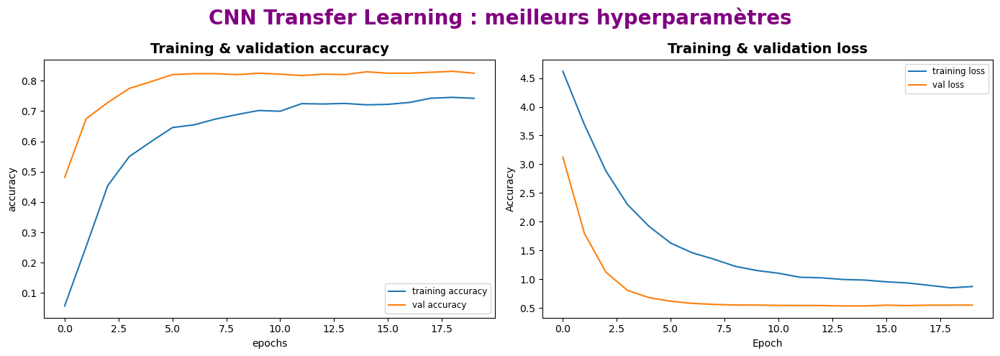

In [21]:
# Affichage accuracy et loss vs epoch
plt.figure(figsize = (14, 5)) # longueur, hauteur
plt.suptitle('CNN Transfer Learning : meilleurs hyperparamètres',
             color      = 'purple',
             fontsize   = 20,
             fontweight = 'bold')
    

# Subplot 1 : training and validation accuracy 
plt.subplot(1, 2, 1)
plt.plot(history_best_model.history['accuracy'], label = 'training accuracy')
plt.plot(history_best_model.history['val_accuracy'], label = 'val accuracy')
plt.legend(loc = 'best', fontsize = 8.5, ncol = 1)
plt.title('Training & validation accuracy', fontsize = 14, fontweight = 'bold')
plt.xlabel('epochs')
plt.ylabel('accuracy')


# Subplot 2 : Training and validation loss
plt.subplot(1, 2, 2)
plt.plot(history_best_model.history['loss'], label = 'training loss')
plt.plot(history_best_model.history['val_loss'], label = 'val loss')
plt.legend(loc = 'best', fontsize = 8.5, ncol = 1)
plt.title('Training & validation loss', fontsize = 14, fontweight = 'bold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
        
plt.tight_layout()
plt.show()

In [ ]:
##################################################
# Enregistrement modèle dans un fichier          #
##################################################

In [297]:
#pickle.dump(best_model,
#            open(folder_source_gs + 'best_model.pkl', 'wb'))

In [263]:
# https://stackoverflow.com/questions/65697623/tensorflow-warning-found-untraced-functions-such-as-lstm-cell-6-layer-call-and
best_model.save(folder_source_gs + 'best_model.tf')

INFO:tensorflow:Assets written to: ./data/bndbox_cleaned_carre/Images_luminosite/best_model.tf\assets


INFO:tensorflow:Assets written to: ./data/bndbox_cleaned_carre/Images_luminosite/best_model.tf\assets


# 4. Prédiction avec les meilleurs hyperparamètres

In [56]:
# Predicting on Test Set 
X_test1 = X_test_gs / 255. # rescale to 0-1. Divide by 255 as its the max RGB value
test_predictions = best_model.predict(X_test1)

# get model predictions (predicted)
predictions = le_gs.classes_[np.argmax(test_predictions, axis = 1)] # get labels and reverse back to get the text labels
# get target labels (true)
target_labels = le_gs.classes_[np.argmax(y_test_gs, axis = 1)]

# Store in dataframe
predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions})
print(predict_df.head(40))

25/25 [==============================] - 17s 577ms/step
                  Target_Labels                  Predictions
0                  Walker_hound             English_foxhound
1                    Rottweiler                   Rottweiler
2                 Saint_Bernard                Saint_Bernard
3                French_bulldog               French_bulldog
4                Dandie_Dinmont               Dandie_Dinmont
5            standard_schnauzer           standard_schnauzer
6                    Rottweiler                   Rottweiler
7                       Samoyed                      Samoyed
8                       whippet                      whippet
9                        vizsla                       vizsla
10                      basenji                      basenji
11                 Newfoundland                 Newfoundland
12                Saint_Bernard                Saint_Bernard
13                     Pembroke                     Pembroke
14                       bria

In [294]:
print(le_gs.classes_)

['Afghan_hound' 'African_hunting_dog' 'Airedale'
 'American_Staffordshire_terrier' 'Appenzeller' 'Australian_terrier'
 'Bedlington_terrier' 'Bernese_mountain_dog' 'Blenheim_spaniel'
 'Border_collie' 'Border_terrier' 'Boston_bull' 'Bouvier_des_Flandres'
 'Brabancon_griffon' 'Brittany_spaniel' 'Cardigan'
 'Chesapeake_Bay_retriever' 'Chihuahua' 'Dandie_Dinmont' 'Doberman'
 'English_foxhound' 'English_setter' 'English_springer' 'EntleBucher'
 'Eskimo_dog' 'French_bulldog' 'German_shepherd'
 'German_short-haired_pointer' 'Gordon_setter' 'Great_Dane'
 'Great_Pyrenees' 'Greater_Swiss_Mountain_dog' 'Ibizan_hound'
 'Irish_setter' 'Irish_terrier' 'Irish_water_spaniel' 'Irish_wolfhound'
 'Italian_greyhound' 'Japanese_spaniel' 'Kerry_blue_terrier'
 'Labrador_retriever' 'Lakeland_terrier' 'Leonberg' 'Lhasa' 'Maltese_dog'
 'Mexican_hairless' 'Newfoundland' 'Norfolk_terrier' 'Norwegian_elkhound'
 'Norwich_terrier' 'Old_English_sheepdog' 'Pekinese' 'Pembroke'
 'Pomeranian' 'Rhodesian_ridgeback' 'Rottw

In [295]:
print('le_gs.classes_[0]\t=', le_gs.classes_[0])
print('le_gs.classes_[3]\t=', le_gs.classes_[3])
print('le_gs.classes_[119]\t=', le_gs.classes_[119])

le_gs.classes_[0]	= Afghan_hound
le_gs.classes_[3]	= American_Staffordshire_terrier
le_gs.classes_[119]	= wire-haired_fox_terrier


In [296]:
# Enregistrement dans un fichier
tmp = pd.DataFrame({'le_gs.classes_': le_gs.classes_})
tmp.to_csv(C_DATASET + 'le_gs_classes_.txt', header = False, index = False)

In [231]:
#####################################################################
# Plot actual vs predicted images with confidence levels (4 images) #
#####################################################################
def affichage_prediction_images_test(liste_id_images): # 4 images
    counter = 1
    plt.figure(figsize = (20, 6)) # longueur, hauteur
    plt.suptitle(t = 'Prédiction images test', fontsize = 20, color = 'green')   

    for i in liste_id_images:
    
        plt.subplot(1, 4, counter)
        plt.subplots_adjust(hspace = 0.6)
        actual    = str(target_labels[i])
        predicted = str(predictions[i])
        conf_max  = str(max(test_predictions[i]))
        
        # https://stackovercoder.fr/programming/6910641/how-do-i-get-indices-of-n-maximum-values-in-a-numpy-array
        # Moyenne des 15 meilleures prédictions
        ind_best = np.argpartition(test_predictions[i], -15)[-15:] # indices des 15 meilleurs prédictions
        conf_mean = str(np.mean(test_predictions[i][ind_best]))

        # Affichage image stockée en ndarray
        img_test = np.asarray(X_test1[i])
        plt.imshow(img_test)
        
        plt.axis('off')
        plt.title(label    = 'id                : ' + str(i) + '\nActual         : ' + actual + 
                  '\nPredict        : ' + predicted + '\nconf_mean : ' + conf_mean + '\nconf_max   : ' + conf_max,
                  loc      = 'left', 
                  fontsize = 11)
        
        counter = counter + 1
        
    plt.show()

In [266]:
###########################################
# Enregistrement image test sur le disque #
###########################################
def enregistrement_image_test(id_image):

    # race réelle (actual)
    y_true = target_labels[id_image]
    
    # Affichage image stockée en ndarray
    img_test = np.asarray(X_test1[id_image])
    plt.axis('off')
    plt.imshow(img_test)
        
    # Enregistrement image sur disque pour la lire depuis le programme
    # https://stackoverflow.com/questions/13811334/saving-numpy-ndarray-in-python-as-an-image        
    img_test_name = C_DATASET + y_true + '_' + str(id_image) + '.jpg'
    print('Enregistrement image', id_image, 'à l\'emplacement :', img_test_name)
    plt.savefig(img_test_name)

In [ ]:
######################################################
# Affichage prédiction images test (par groupe de 4) #
######################################################

In [267]:
liste_id_images_1 = [0, 201, 554, 725]
liste_id_images_2 = [763, 329, 677, 799]
#liste_id_images_random = random.sample(range(0, len(y_test_gs)), 4)  # random 4 images

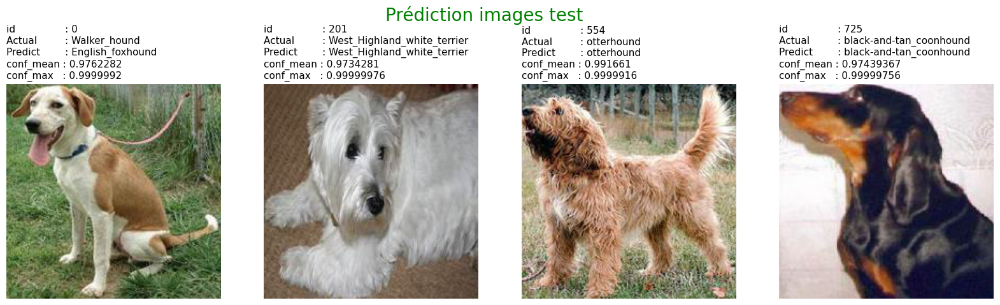

In [268]:
affichage_prediction_images_test(liste_id_images = liste_id_images_1)

In [39]:
affichage_prediction_images_test(liste_id_images = liste_id_images_2)


# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [ ]:
######################################################
# Enregistrement des images sur le disque            #
######################################################

In [ ]:
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
# @ liste_id_images_1              @
# @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@

In [49]:
enregistrement_image_test(id_image = 0)

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [31]:
enregistrement_image_test(id_image = 201)

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.

In [48]:
enregistrement_image_test(id_image = 554)

# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>   Extrait traces pour github :   >>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Traces supprimées.